In [1]:
import sklearn
import numpy
import math

print('The scikit-learn verison is {}.'.format(sklearn.__version__))
print('The numpy versions i {}.'.format(numpy.__version__))
# lt. Paper: Imbalanced-learn: A Python Toolbox to Tackle the Curse of Imbalanced Datasets in 
# Machine Learning ist nur RandomOverSampler für den Multi-class-Fall anwendbar
from imblearn.over_sampling import RandomOverSampler, SMOTE, ADASYN, KMeansSMOTE, SVMSMOTE

import numpy as np
from numpy import mean, std
import matplotlib.pyplot as plt

from sklearn.svm import SVC
from sklearn.svm import LinearSVC
#from sklearn.multiclass import OneVsRestClassifier

from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import StratifiedKFold

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import validation_curve
from sklearn.model_selection import learning_curve
from sklearn.model_selection import ShuffleSplit

from sklearn.pipeline import Pipeline

from sklearn.preprocessing import StandardScaler


from sklearn.metrics import classification_report, confusion_matrix

from sklearn.metrics import make_scorer
from sklearn.metrics import f1_score, precision_score, recall_score, roc_auc_score
from sklearn.metrics import average_precision_score
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import accuracy_score, balanced_accuracy_score 

from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import auc
from sklearn.metrics import roc_curve, precision_recall_curve

from sklearn.preprocessing import LabelBinarizer

from sklearn.utils import shuffle
from sklearn.utils.multiclass import unique_labels

from skimage import exposure, feature, transform
import pickle as pkl
from sklearn.decomposition import PCA

from itertools import product
from itertools import cycle

import seaborn as sns

import time
import timeit
from timeit import default_timer as timer

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
%matplotlib inline

import csv
import pandas as pd
# zum Visualisieren der Daten mithilfe von PCA
from mpl_toolkits.mplot3d import Axes3D

# jupyter notebooks als Module importieren
!pip install import-ipynb
import import_ipynb
import save_load
from save_load import load_hog_features, load_vgg16_features, load_labels, save_trained_model_as_pkl, load_trained_model_from_pkl, save_as_csv, read_csv, make_subsets_training_data_A
import tools
from tools import roc_auc_score_multiclass, roc_auc_score_single_class, scale_train_test_data, scale_train_test_data_without_std, scale_train_test_data_without_mean

The scikit-learn verison is 0.21.3.
The numpy versions i 1.15.4.


Using TensorFlow backend.


importing Jupyter notebook from save_load.ipynb
Hallo angekommen
importing Jupyter notebook from tools.ipynb


In [2]:
def load_hog_features(path_train):
    X_hog = np.load(path_train)
    return X_hog

def load_labels(path_train):
    y_label = np.load(path_train)
    return y_label

'''
speichert trainierte Modelle bzw. Ergebnisse wiederholter Grid Search Anwendungen als Pickle-Datei.
Diese gespeicherten Modelle können mit Funktion   load_trained_model_from_pkl(name)
'''

def save_trained_model_as_pkl(model, filename):
    with open(filename, 'wb') as file:
        pkl.dump(model, file)  
        
'''
lädt bereits trainiertes, als Pickle-Datei gespeichertes Modell bzw. Ergebnisse wiederholter
Grid Search Anwendungen
'''
def load_trained_model_from_pkl(filename):
    with open(filename, 'rb') as file:
        new_model=pkl.load(file)
    return new_model

'''
speichern und lesen von CSV-Dateien
'''
def save_as_csv(list,path,name):
    path = path+name    
    with open(path, "w") as file:
        csv_wr = csv.writer(file)
        csv_wr.writerows(list)
        
def read_csv(path):
    read_file = []
    with open(path, "r") as file:
        csv_r = csv.reader(file)
        for row in csv_r:
            if row:
                read_file.append(row)
    return read_file

In [3]:
# in Anlehnung an:   https://medium.com/@plog397/auc-roc-curve-scoring-function-for-multi-class-classification-9822871a6659
def roc_auc_score_multiclass(y_test, y_pred, average='macro'):    
    labelBin = LabelBinarizer()
    labelBin.fit(y_test)    
    y_test = labelBin.transform(y_test)
    y_pred = labelBin.transform(y_pred)
    return roc_auc_score(y_test, y_pred, average=average)

In [4]:
'''
Roc_Auc_score für die einzelnen Klassen berechnen
'''
def roc_auc_score_single_class(y_test, y_pred, average = "macro"):
    # Menge der einzelnen Klassen erstellen
    single_classes = set(y_test)
    roc_aucs = {}
    for cl in single_classes:
        #Liste der restlichen Klassen erstellen
        remain_classes = [x for x in single_classes if x != cl]

        # aktuelle Klasse mit 1 markieren und alle anderen Klassen mit 0
        y_test_roc = [0 if x in remain_classes else 1 for x in y_test]
        y_pred_roc = [0 if x in remain_classes else 1 for x in y_pred]

        # roc_auc_score berechnen
        roc_auc = roc_auc_score(y_test_roc, y_pred_roc, average = average)
        roc_aucs[cl] = roc_auc

    return roc_aucs

#lr_roc_auc_multiclass = roc_auc_score_single_class(y_test, pred)
#print(lr_roc_auc_multiclass)

In [5]:
def convert_string_to_int(y_true, y_pred):
    y_true_int = []
    y_pred_int = []
    for i in range(0, len(y_true)):
        y_true_int.append(int(y_true[i]))
        y_pred_int.append(int(y_pred[i]))
    return y_true_int, y_pred_int 

In [6]:
def plot_confusion_matrix_norm(y_test, y_pred, title):        
    classes = ['0','1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16','17','18',
              '19','20','21','22','23','24','25','26','27','28','29','30','31','32','33','34','35',
              '36','37','38','39','40','41','42']  
    y_test_int, y_pred_int = convert_string_to_int(y_test, y_pred)
    cm = confusion_matrix(y_test_int, y_pred_int)    
    np.set_printoptions(precision=3)    
    #plt.figure(figsize=(4.5*2, 2.5*2))
    #plt.figure(figsize=(9*2, 5*2))
    #plt.figure(figsize=(13.5*2, 7.5*2))
    
    fig = plt.figure(figsize=(18*2, 10*2))
    #fig.suptitle('Confusion matrix ', fontsize=20, fontweight='medium')
    normalize=True    
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        #print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Confusion matrix  '+title, fontsize=28)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 1.5
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):            
    #for i, j in product(range(cm.shape[0]), range(cm.shape[1])):
            plt.text(j, i, format(cm[i, j], fmt),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
    plt.ylabel('True label', fontsize=24)
    plt.xlabel('Predicted label', fontsize=24)
    plt.tight_layout()
    plt.show()
    return fig


# Classification report ausgeben
def classif_report(y_te, y_pred):
    y_test_int, y_pred_int = convert_string_to_int(y_te, y_pred)
    print(classification_report(y_test_int, y_pred_int))   

In [7]:
'''
erstellen unterschiedlicher Trainingsmengen aus 39.209 Trainingsdaten
Datensätze werden zufällig aber reproduzierbar durch random_state=0
unter Berücksichtigung der prozentualen Anteile der Daten in den
einzelnen Klassen, erstellt.
Tracks werden nicht berücksichtigt
'''
def make_training_subsets_A(X_tr, y_tr):
    # Trainingsdaten mischen, da diese ursprünglich sortiert vorliegen
    X_tr, y_tr = shuffle(X_tr, y_tr, random_state=42)    
    # Trainingsmenge mit 20.000 Bilder erzeugen
    X_tr_20000, X_te_2, y_tr_20000, y_te_2 = train_test_split(
        X_tr, y_tr, random_state = 0, train_size=20000/39209, stratify=y_tr)
    # Trainingsmenge mit 10.000 Bilder erzeugen
    X_tr_10000, X_te_3, y_tr_10000, y_te_3 = train_test_split(
        X_tr_20000, y_tr_20000, random_state = 0, train_size=1/2, stratify=y_tr_20000)
    # Trainingsmenge mit 5.000 Bilder erzeugen   
    X_tr_5000, X_te_4, y_tr_5000, y_te_4 = train_test_split(
        X_tr_10000, y_tr_10000, random_state = 0, train_size=1/2, stratify=y_tr_10000)
     #Trainingsmenge mit 2.000 Bilder erzeugen   
    X_tr_2000, X_te_5, y_tr_2000, y_te_5 = train_test_split(
        X_tr_5000, y_tr_5000, random_state = 0, train_size=2/5, stratify=y_tr_5000)
     #Trainingsmenge mit 1.000 Bilder erzeugen   
    X_tr_1000, X_te_6, y_tr_1000, y_te_6 = train_test_split(
        X_tr_2000, y_tr_2000, random_state = 0, train_size=1/2, stratify=y_tr_2000)
    # Trainingsmenge mit 500 Bilder erzeugen   
    X_tr_500, X_te_7, y_tr_500, y_te_7 = train_test_split(
        X_tr_1000, y_tr_1000, random_state = 0, train_size=1/2, stratify=y_tr_1000)
    # Trainingsmenge mit 200 Bilder erzeugen   
    X_tr_200, X_te_8, y_tr_200, y_te_8 = train_test_split(
        X_tr_500, y_tr_500, random_state = 0, train_size=2/5, stratify=y_tr_500)
    return X_tr,y_tr,X_tr_20000,y_tr_20000,X_tr_10000,y_tr_10000,X_tr_5000,y_tr_5000,X_tr_2000,y_tr_2000,X_tr_1000,y_tr_1000,X_tr_500,y_tr_500,X_tr_200,y_tr_200
    

In [8]:
'''
Trainings- und Testdaten mit dem StandardScaler skalieren
'''
def scale_train_test_data(X_tr, X_te):
    scaler = StandardScaler()
    scaler.fit(X_tr)
    X_tr_trans = scaler.transform(X_tr)
    X_te_trans = scaler.transform(X_te)
    return X_tr_trans, X_te_trans
    
'''
Trainings- und Testdaten mit dem StandardScaler skalieren
ohne std
'''
def scale_train_test_data_without_std(X_tr, X_te):
    scaler = StandardScaler(with_std=False)
    scaler.fit(X_tr)
    X_tr_trans = scaler.transform(X_tr)
    X_te_trans = scaler.transform(X_te)
    return X_tr_trans, X_te_trans
    
'''
Trainings- und Testdaten mit dem StandardScaler skalieren
ohne std
'''
def scale_train_test_data_without_mean(X_tr, X_te):
    scaler = StandardScaler(with_mean=False)
    scaler.fit(X_tr)
    X_tr_trans = scaler.transform(X_tr)
    X_te_trans = scaler.transform(X_te)
    return X_tr_trans, X_te_trans
    
    
'''
Oversampling der Minderheitsklasse
'''
def make_smote_minority(X, y):
    smote = SMOTE('minority', k_neighbors=1, random_state=0)
    X_smote, y_smote = smote.fit_sample(X,y)
    return X_smote, y_smote 

In [9]:
'''
SVC mit RBG Kernel trainieren
seed = Saatpunkt für Numpy-Zufallsgenerator
number = Anzahl der Trainingsdaten
C = Wert des Parameters C
scale = Daten skalieren oder nicht, wenn scale=0 dann nicht skalieren
                                    wenn scale=1 dann skalieren ohne std
                                    wenn scale=2 dann skalieren mit std
                                    wenn scale=3 dann skalieren ohne mean
smote = 0, dann ohne SMOTE
smote = 1, dann mit SMOTE mit minority

class_weight:    class_weight='balanced', class_weight=None
'''
'''
SVC mit RBF-Kernel trainieren, mit StandardScaler
'''
def train_RBF_SVC(X_tr, X_te, y_tr, y_te, seed, number, C, gamma, scale, smote, decision_function, 
                  class_weight, front_path, end_path, feature):
    # Seed-Punkt setzen für Reproduzierbarkeit
    #seed = seed
    #np.random.seed(seed)
    # Pfad für speichern des Modells, Confusion matrix, Metriken
    #path = "SVM_Modelle_FM/Hog_default/rbf/"+number+"/NEU seed 7 random 0/1terDL/"
    #path = "SVM_Modelle_FM/Hog_default/rbf/"+number+"/NEU seed 7 random B/1terDL/"
    #path = "SVM_Modelle_FM/Hog_default/rbf/"+number+"/NEU seed 7 random C/1terDL/"
    path = front_path+"/"+number+"/"+end_path+"/"
    
    # Liste in welcher die berechneten Metriken gespeichert werden
    metrics = []
    # Liste für Trainingszeiten
    time_list = []
    #Liste für Testzeiten
    time_list_test = []
    
    if smote == 1:
        print("Smote minority")
        X_tr, y_tr = make_smote_minority(X_tr, y_tr)
    
     # Trainings- und Testdaten skalieren
    if scale == 1:
        print("Daten skalieren ohne std")
        X_tr, X_te = scale_train_test_data_without_std(X_tr, X_te)
    if scale == 2:
        print("Daten skalieren")
        X_tr, X_te = scale_train_test_data(X_tr, X_te)
    if scale == 3:
        print("Daten skalieren ohne mean")
        scale_train_test_data_without_mean(X_tr, X_te)
        
    #if smote == 1:
     #   print("Smote minority")
      #  X_tr, y_tr = make_smote_minority(X_tr, y_tr)
 
    # SVC mit den skalierten Daten trainieren und speichern
    start = time.time()
    start2 = time.process_time()
    start3 = time.perf_counter()
    
    #rbfSVC = SVC(C=C, gamma='auto_deprecated')
    rbfSVC = SVC(C=C, gamma=gamma, class_weight=class_weight, decision_function_shape= decision_function, random_state=seed)
    rbfSVC.fit(X_tr, y_tr)
    end = time.time()-start
    end2 = time.process_time()-start2
    end3 = time.perf_counter()-start3
                
    end_per_sample = end/int(number)
    end2_per_sample = end2/int(number)
    end3_per_sample = end3/int(number)
    # Trainingszeiten speichern
    time_list.append([end,end2,end3])    
    time_list.append([end_per_sample, end2_per_sample, end3_per_sample])
    save_as_csv(time_list, path, 'Trainingszeiten.csv')
    
    # trainiertes Modell speichern
    save_trained_model_as_pkl(rbfSVC, path+"RBF_SVC_"+number+"_"+feature)    
                              
    # Vorhersage machen und speichern
    y_pred = rbfSVC.predict(X_te)    
    np.save(path+"y_pred_label.npy", y_pred) 
    # zusätzlich Label der Testdaten speichern, auch wenn eigentlich überflüssig
    np.save(path+"y_test_label.npy", y_te)
                                  
    # Metriken berechnen und speichern                          
    acc = accuracy_score(y_te, y_pred)                  
    prec = precision_score(y_te, y_pred, average='macro')    
    rec = recall_score(y_te, y_pred, average='macro')   
    f1 = f1_score(y_te, y_pred, average='macro') 
    roc = roc_auc_score_multiclass(y_te, y_pred, average='macro')
    kappa = cohen_kappa_score(y_te, y_pred)
    metrics.append([acc,prec,rec,f1,roc,kappa])
    save_as_csv(metrics,path,'metrics.csv')  
    
    roc_single_class = roc_auc_score_single_class(y_te, y_pred, average='macro')
    np.save(path+"roc_auc_score_single_class.npy", roc_single_class)
    
    # Confusion Matrix erstellen und speichern
    title = '(SVC rbf '+number+' C='+str(C)+')'    
    cm = plot_confusion_matrix_norm(y_te, y_pred, title)       
    cm.savefig(path+"Confusion_matrix.png")    
    
    # Performanz mit Testdaten testen und Klassifikationszeit speichern
    start4 = time.time()
    start5 = time.process_time()
    start6 = time.perf_counter()
    test_acc = rbfSVC.score(X_te, y_te)
    end4 = time.time()-start4
    end5 = time.process_time()-start5
    end6 = time.perf_counter()-start6
    end4_per_sample = end4/int(number)
    end5_per_sample = end5/int(number)
    end6_per_sample = end6/int(number)
    # Klassifikationszeiten speichern
    time_list_test.append([end4,end5,end6])    
    time_list_test.append([end4_per_sample, end5_per_sample, end6_per_sample])
    save_as_csv(time_list_test, path, 'Testzeiten.csv')
    print("Test accuracy: ",test_acc,'\n')
    
    # Klassifikationsreport erstellen und speichern
    classif_report(y_te, y_pred)
    
    # precision, recall und f-Score pro Klasse speichern
    save_as_csv(precision_recall_fscore_support(y_te, y_pred), path, "precision_recall_fscore.csv")

In [10]:
'''
LinearSVC trainieren
seed = Saatpunkt für Numpy-Zufallsgenerator
number = Anzahl der Trainingsdaten
C = Wert des Parameters C
scale = Daten skalieren oder nicht, wenn scale=0 dann nicht skalieren
                                    wenn scale=1 dann skalieren ohne std
                                    wenn scale=2 dann skalieren mit std
smote = 0, dann ohne SMOTE
smote = 1, dann mit SMOTE

class_weight:    class_weight='balanced', class_weight=None
'''
def train_LinearSVC(X_tr, X_te, y_tr, y_te, seed, number, C, scale, smote, class_weight, front_path, end_path,feature):
    # Seed-Punkt setzen für Reproduzierbarkeit
    #seed = seed
    #np.random.seed(seed)
    # Pfad für speichern des Modells, Confusion matrix, Metriken
    #path = "SVM_Modelle_FM/Hog_default/LinearSVC/"+number+"/NEU seed 7 random 0/1terDL/"
    #path = "SVM_Modelle_FM/Hog_default/LinearSVC/"+number+"/NEU seed 7 random B/1terDL/"
    #path = "SVM_Modelle_FM/Hog_default/LinearSVC/"+number+"/NEU seed 7 random C/1terDL/"
    path = front_path+"/"+number+"/"+end_path+"/"
    # Liste in welcher die berechneten Metriken gespeichert werden
    metrics = []
    # Liste für Trainingszeiten
    time_list = []
    #Liste für Testzeiten
    time_list_test = []
    
    if smote == 1:
        print("Smote minority")
        X_tr, y_tr = make_smote_minority(X_tr, y_tr)
       
    if scale == 1:
        print("Daten skalieren ohne std")
        X_tr, X_te = scale_train_test_data_without_std(X_tr, X_te)
    if scale == 2:
        print("Daten skalieren")
        X_tr, X_te = scale_train_test_data(X_tr, X_te)
        
    # LinearSVC mit den Daten trainieren und speichern
    start = time.time()
    start2 = time.process_time()
    start3 = time.perf_counter()
    
    linSVC = LinearSVC(C=C, loss='hinge', class_weight=class_weight, random_state=seed)
    linSVC.fit(X_tr, y_tr)
    end = time.time()-start
    end2 = time.process_time()-start2
    end3 = time.perf_counter()-start3
            
    end_per_sample = end/int(number)
    end2_per_sample = end2/int(number)
    end3_per_sample = end3/int(number)
    # Trainingszeiten speichern
    time_list.append([end,end2,end3])    
    time_list.append([end_per_sample, end2_per_sample, end3_per_sample])
    save_as_csv(time_list, path, 'Trainingszeiten.csv')
    
    # trainiertes Modell speichern
    save_trained_model_as_pkl(linSVC, path+"LinearSVC_"+number+"_"+feature)      
                              
    # Vorhersage machen und speichern
    y_pred = linSVC.predict(X_te)    
    np.save(path+"y_pred_label.npy", y_pred) 
    # zusätzlich Label der Testdaten speichern, auch wenn eigentlich überflüssig
    np.save(path+"y_test_label.npy", y_te)
                                  
    # Metriken berechnen und speichern                          
    acc = accuracy_score(y_te, y_pred)                  
    prec = precision_score(y_te, y_pred, average='macro')    
    rec = recall_score(y_te, y_pred, average='macro')   
    f1 = f1_score(y_te, y_pred, average='macro')
    roc = roc_auc_score_multiclass(y_te, y_pred, average='macro')
    kappa = cohen_kappa_score(y_te, y_pred)
    metrics.append([acc,prec,rec,f1,roc,kappa])
    save_as_csv(metrics,path,'metrics.csv')  
    
    roc_single_class = roc_auc_score_single_class(y_te, y_pred, average='macro')
    np.save(path+"roc_auc_score_single_class.npy", roc_single_class)
    
    # Confusion Matrix erstellen und speichern
    title = '(LinearSVC '+number+' C='+str(C)+')'
    cm = plot_confusion_matrix_norm(y_te, y_pred, title)     
    cm.savefig(path+"Confusion_matrix.png")    
    
    # Performanz mit Testdaten testen und Klassifikationszeit speichern
    start4 = time.time()
    start5 = time.process_time()
    start6 = time.perf_counter()
    test_acc = linSVC.score(X_te, y_te)
    end4 = time.time()-start4
    end5 = time.process_time()-start5
    end6 = time.perf_counter()-start6
    end4_per_sample = end4/int(number)
    end5_per_sample = end5/int(number)
    end6_per_sample = end6/int(number)
    # Klassifikationszeiten speichern
    time_list_test.append([end4,end5,end6])    
    time_list_test.append([end4_per_sample, end5_per_sample, end6_per_sample])
    save_as_csv(time_list_test, path, 'Testzeiten.csv')
    print("Test accuracy: ",test_acc,'\n')
    
    # Klassifikationsreport erstellen und speichern
    classif_report(y_te, y_pred)
        
    # precision, recall und f-Score pro Klasse speichern
    save_as_csv(precision_recall_fscore_support(y_te, y_pred), path, 'precision_recall_fscore.csv')    

In [11]:
'''
LinearSVC trainieren
seed = Saatpunkt für Numpy-Zufallsgenerator
number = Anzahl der Trainingsdaten
C = Wert des Parameters C
scale = Daten skalieren oder nicht, wenn scale=0 dann nicht skalieren
                                    wenn scale=1 dann skalieren ohne std
                                    wenn scale=2 dann skalieren mit std
smote = 0, dann ohne SMOTE
smote = 1, dann mit SMOTE

class_weight:    class_weight='balanced', class_weight=None
'''
def train_LinearSVC_sq(X_tr, X_te, y_tr, y_te, seed, number, C, scale, smote, class_weight, front_path, end_path,feature):
    # Seed-Punkt setzen für Reproduzierbarkeit
    #seed = seed
    #np.random.seed(seed)
    # Pfad für speichern des Modells, Confusion matrix, Metriken
    #path = "SVM_Modelle_FM/Hog_default/LinearSVC/"+number+"/NEU seed 7 random 0/1terDL/"
    #path = "SVM_Modelle_FM/Hog_default/LinearSVC/"+number+"/NEU seed 7 random B/1terDL/"
    #path = "SVM_Modelle_FM/Hog_default/LinearSVC/"+number+"/NEU seed 7 random C/1terDL/"
    path = front_path+"/"+number+"/"+end_path+"/"
    # Liste in welcher die berechneten Metriken gespeichert werden
    metrics = []
    # Liste für Trainingszeiten
    time_list = []
    #Liste für Testzeiten
    time_list_test = []
    
    if smote == 1:
        print("Smote minority")
        X_tr, y_tr = make_smote_minority(X_tr, y_tr)
       
    if scale == 1:
        print("Daten skalieren ohne std")
        X_tr, X_te = scale_train_test_data_without_std(X_tr, X_te)
    if scale == 2:
        print("Daten skalieren")
        X_tr, X_te = scale_train_test_data(X_tr, X_te)
        
    # LinearSVC mit den Daten trainieren und speichern
    start = time.time()
    start2 = time.process_time()
    start3 = time.perf_counter()
    
    linSVC = LinearSVC(C=C, penalty='l2', loss='squared_hinge', class_weight=class_weight, random_state=seed)
    linSVC.fit(X_tr, y_tr)
    end = time.time()-start
    end2 = time.process_time()-start2
    end3 = time.perf_counter()-start3
            
    end_per_sample = end/int(number)
    end2_per_sample = end2/int(number)
    end3_per_sample = end3/int(number)
    # Trainingszeiten speichern
    time_list.append([end,end2,end3])    
    time_list.append([end_per_sample, end2_per_sample, end3_per_sample])
    save_as_csv(time_list, path, 'Trainingszeiten.csv')
    
    # trainiertes Modell speichern
    save_trained_model_as_pkl(linSVC, path+"LinearSVC_"+number+"_"+feature)      
                              
    # Vorhersage machen und speichern
    y_pred = linSVC.predict(X_te)    
    np.save(path+"y_pred_label.npy", y_pred) 
    # zusätzlich Label der Testdaten speichern, auch wenn eigentlich überflüssig
    np.save(path+"y_test_label.npy", y_te)
                                  
    # Metriken berechnen und speichern                          
    acc = accuracy_score(y_te, y_pred)                  
    prec = precision_score(y_te, y_pred, average='macro')    
    rec = recall_score(y_te, y_pred, average='macro')   
    f1 = f1_score(y_te, y_pred, average='macro')
    roc = roc_auc_score_multiclass(y_te, y_pred, average='macro')
    kappa = cohen_kappa_score(y_te, y_pred)
    metrics.append([acc,prec,rec,f1,roc,kappa])
    save_as_csv(metrics,path,'metrics.csv')  
    
    roc_single_class = roc_auc_score_single_class(y_te, y_pred, average='macro')
    np.save(path+"roc_auc_score_single_class.npy", roc_single_class)
    
    # Confusion Matrix erstellen und speichern
    title = '(LinearSVC '+number+' C='+str(C)+')'
    cm = plot_confusion_matrix_norm(y_te, y_pred, title)     
    cm.savefig(path+"Confusion_matrix.png")    
    
    # Performanz mit Testdaten testen und Klassifikationszeit speichern
    start4 = time.time()
    start5 = time.process_time()
    start6 = time.perf_counter()
    test_acc = linSVC.score(X_te, y_te)
    end4 = time.time()-start4
    end5 = time.process_time()-start5
    end6 = time.perf_counter()-start6
    end4_per_sample = end4/int(number)
    end5_per_sample = end5/int(number)
    end6_per_sample = end6/int(number)
    # Klassifikationszeiten speichern
    time_list_test.append([end4,end5,end6])    
    time_list_test.append([end4_per_sample, end5_per_sample, end6_per_sample])
    save_as_csv(time_list_test, path, 'Testzeiten.csv')
    print("Test accuracy: ",test_acc,'\n')
    
    # Klassifikationsreport erstellen und speichern
    classif_report(y_te, y_pred)
        
    # precision, recall und f-Score pro Klasse speichern
    save_as_csv(precision_recall_fscore_support(y_te, y_pred), path, 'precision_recall_fscore.csv')  

In [12]:
'''
Tuning der Hyperparameter mit GridSearchCV 

Mit refit=True (Standardeinstellung) wird der beste Estimator, welcher über 
die Kreuzvalidierung gefunden wurde, zusätzlich mit dem gesamten
Trainingsdatensatz trainiert 
'''
def tuning_hyper_params(X, y, X_test, y_test, kernel='LinearSVC', cv=3,
                        scaler=0, pca=0,
                        c_range=np.logspace(-16,10,14, base=2), 
                        gamma_range=np.logspace(-16,4,11, base=2),  
                        penalty='l2', loss='squared_hinge',
                        seed=1):
    # extra nochmal seed für np.random setzen, z.B. auch StratifiedKFold ein
    # random_state verwendet wird
    seed = seed
    np.random.seed(seed)    
    start=time.time()
    start2 = time.process_time()
    start3 = time.perf_counter()
    time_list = [] # Zeit für GridSearch
    
    scoring = {'Precision': make_scorer(precision_score, average='macro'),
               'Recall': make_scorer(recall_score, average='macro'),
               'F1': make_scorer(f1_score, average='macro'),
               'acc': make_scorer(accuracy_score),
               'roc': make_scorer(roc_auc_score_multiclass, average='macro')} 
                  
    if kernel == 'LinearSVC':
        if scaler == 0:
            pipeline = Pipeline([
                ("svm", LinearSVC(penalty=penalty, loss=loss, class_weight='balanced', random_state=seed))])
        if scaler == 1:
            pipeline = Pipeline([
                ("scaler", StandardScaler(with_std=False)),
                ("svm", LinearSVC(penalty=penalty, loss=loss, class_weight='balanced', random_state=seed))
            ])
        if scaler == 2:
            pipeline = Pipeline([
                ("scaler", StandardScaler()),
                ("svm", LinearSVC(penalty=penalty, loss=loss, class_weight='balanced', random_state=seed))
            ])          
                        
        param_grid=[{'svm__C': c_range}]
                        
        clf = GridSearchCV(pipeline, param_grid=param_grid, cv=cv, scoring=scoring, refit='F1', n_jobs=-1)
        clf.fit(X,y)                
                               
        print('\n C_range:', c_range)
        print('\n Bester Score: ',clf.best_score_)
        print('\n Besten Parameter: ', clf.best_params_)            
                        
    elif kernel == 'rbf':
        if scaler == 2:
            pipeline = Pipeline([
                ("scaler", StandardScaler()),
                ("svm", SVC(decision_function_shape='ovo', class_weight="balanced", random_state=seed))])
                              
        param_grid=[{'svm__C': c_range, 'svm__gamma': gamma_range}]
        clf = GridSearchCV(pipeline, param_grid=param_grid, cv=cv, scoring=scoring, refit='F1', n_jobs=-1)
        clf.fit(X,y)        
        print('\n C_range: ', c_range)
        print('\n gamma_range:', gamma_range)
        print('\n Beste Score: ',clf.best_score_)
        print('\n Besten Parameter: ', clf.best_params_)   

    end = time.time()-start
    end2 = time.process_time()-start2
    end3 = time.perf_counter()-start3
    time_list.append([end,end2,end3])
    
    #Nur korrekt, wenn kein StandardScaler verwendet wurde
    if scaler == 0:
        print("Bester Estimator score: ",clf.best_estimator_.score(X_test, y_test))            
       
    for mean, stdev, param in zip(clf.cv_results_['mean_test_Precision'],
                              clf.cv_results_['std_test_Precision'],
                              clf.cv_results_['params']):
        print("Precision-Score: %f (%f) mit Parameter: %r" % (mean, stdev, param))
        
    for mean, stdev, param in zip(clf.cv_results_['mean_test_Recall'], 
                              clf.cv_results_['std_test_Recall'],clf.cv_results_['params']):
        print("Recall-Score: %f (%f) mit Parameter: %r" % (mean, stdev, param))
        
    for mean, stdev, param in zip(clf.cv_results_['mean_test_F1'], 
                              clf.cv_results_['std_test_F1'],clf.cv_results_['params']):
        print("F1-Score: %f (%f) mit Parameter: %r" % (mean, stdev, param))
        
    for mean, stdev, param in zip(clf.cv_results_['mean_test_acc'], clf.cv_results_['std_test_acc'],
                              clf.cv_results_['params']):
        print("Accuracy-Score: %f (%f) mit Parameter: %r" % (mean, stdev, param))  
                
    for mean, stdev, param in zip(clf.cv_results_['mean_test_roc'],clf.cv_results_['std_test_roc'],
                              clf.cv_results_['params']):
        print("Roc-Score: %f (%f) mit Parameter: %r" % (mean, stdev, param))    
    return clf, time_list


'''
Verfeinerten Suchbereich für gefundenen Parameter bestimmen
Schrittweite 1/4 im Exponenten, d.h. wenn z.B. 8 der gefundene Parameter ist,
np.log2(8) = 3    ---> np.logspace(1,5,17,base=2)
'''
def get_finer_range(number):
    exp = np.log2(number) #Exponent bestimmen, Basis 2
    range = np.logspace(exp-2, exp+2, 17, base=2)
    return range

In [13]:
# Trainingsdaten, Bounding Box laden
X_train_9_4_2 = load_hog_features("GTSRB_Data/GTSRB_HOG_Features_BB_skimage_9_4_2.npy")
X_test_9_4_2 = load_hog_features("GTSRB_Data/GTSRB_HOG_Features_Test_BB_skimage_9_4_2.npy")
# Label laden
y_train = load_labels("GTSRB_Data/GTSRB_training_label.npy")
y_test = load_labels("GTSRB_Data/GTSRB_test_label.npy")

In [14]:
X_tr,y_tr,X_tr_20000,y_tr_20000,X_tr_10000,y_tr_10000,X_tr_5000,y_tr_5000,X_tr_2000,y_tr_2000,X_tr_1000,y_tr_1000,X_tr_500,y_tr_500,X_tr_200,y_tr_200 = make_training_subsets_A(X_train_9_4_2, y_train)

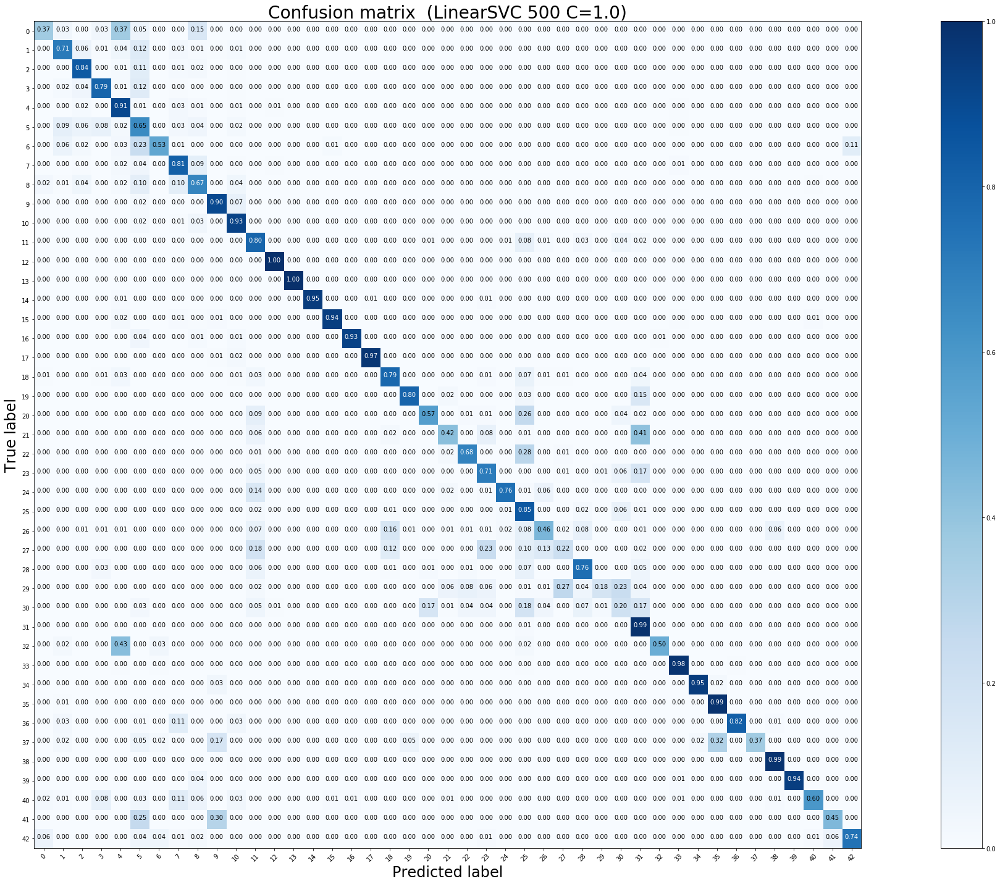

Test accuracy:  0.8239904988123515 

              precision    recall  f1-score   support

           0       0.51      0.37      0.43        60
           1       0.85      0.71      0.77       720
           2       0.82      0.84      0.83       750
           3       0.83      0.79      0.81       450
           4       0.81      0.91      0.86       660
           5       0.51      0.65      0.57       630
           6       0.88      0.53      0.66       150
           7       0.72      0.81      0.76       450
           8       0.68      0.67      0.68       450
           9       0.91      0.90      0.91       480
          10       0.85      0.93      0.89       660
          11       0.77      0.80      0.78       420
          12       0.98      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       1.00      0.95      0.98       270
          15       0.97      0.94      0.95       210
          16       0.97      0.93      0.95 

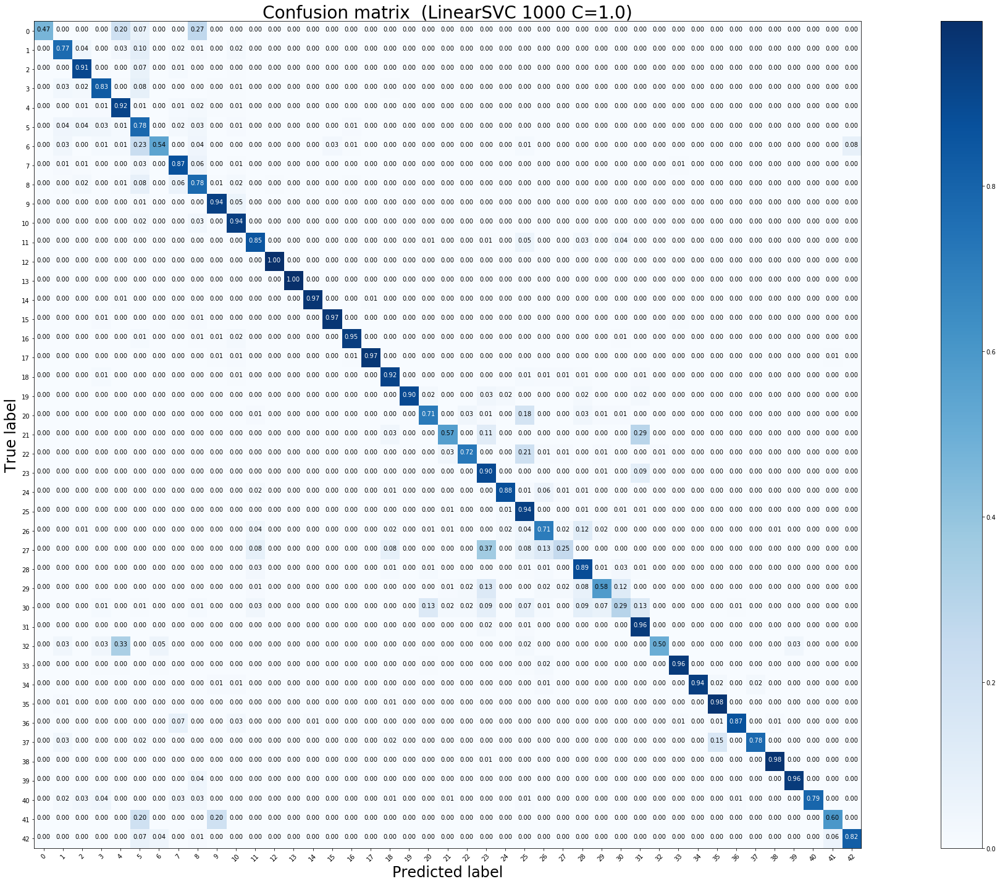

Test accuracy:  0.8776722090261283 

              precision    recall  f1-score   support

           0       0.88      0.47      0.61        60
           1       0.89      0.77      0.83       720
           2       0.89      0.91      0.90       750
           3       0.88      0.83      0.85       450
           4       0.90      0.92      0.91       660
           5       0.63      0.78      0.70       630
           6       0.88      0.54      0.67       150
           7       0.82      0.87      0.85       450
           8       0.74      0.78      0.76       450
           9       0.94      0.94      0.94       480
          10       0.88      0.94      0.91       660
          11       0.93      0.85      0.89       420
          12       0.99      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.99      0.97      0.98       270
          15       0.97      0.97      0.97       210
          16       0.90      0.95      0.92 

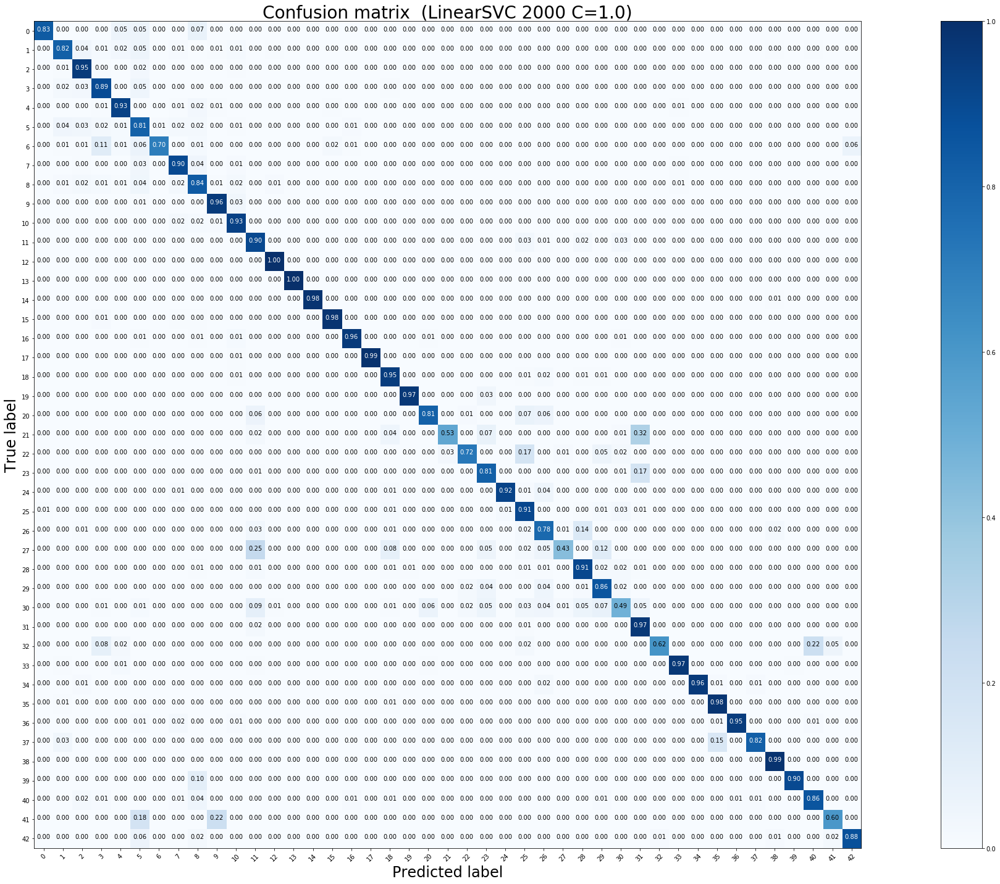

Test accuracy:  0.905859065716548 

              precision    recall  f1-score   support

           0       0.89      0.83      0.86        60
           1       0.91      0.82      0.86       720
           2       0.90      0.95      0.92       750
           3       0.86      0.89      0.88       450
           4       0.94      0.93      0.94       660
           5       0.78      0.81      0.79       630
           6       0.95      0.70      0.80       150
           7       0.88      0.90      0.89       450
           8       0.81      0.84      0.83       450
           9       0.93      0.96      0.94       480
          10       0.92      0.93      0.92       660
          11       0.87      0.90      0.89       420
          12       0.98      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.99      0.98      0.99       270
          15       0.96      0.98      0.97       210
          16       0.92      0.96      0.94  

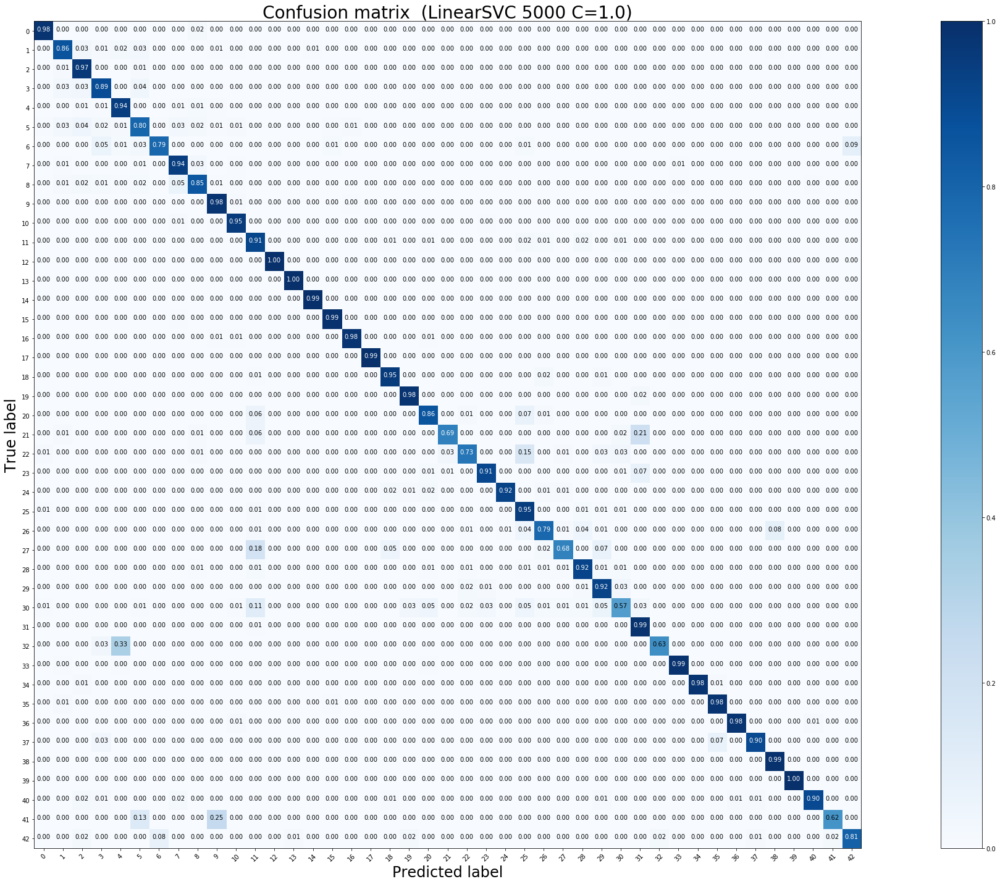

Test accuracy:  0.926049089469517 

              precision    recall  f1-score   support

           0       0.86      0.98      0.91        60
           1       0.92      0.86      0.89       720
           2       0.89      0.97      0.93       750
           3       0.89      0.89      0.89       450
           4       0.93      0.94      0.94       660
           5       0.88      0.80      0.84       630
           6       0.91      0.79      0.85       150
           7       0.88      0.94      0.91       450
           8       0.89      0.85      0.87       450
           9       0.93      0.98      0.95       480
          10       0.96      0.95      0.96       660
          11       0.87      0.91      0.89       420
          12       0.99      1.00      1.00       690
          13       1.00      1.00      1.00       720
          14       0.97      0.99      0.98       270
          15       0.94      0.99      0.97       210
          16       0.92      0.98      0.95  

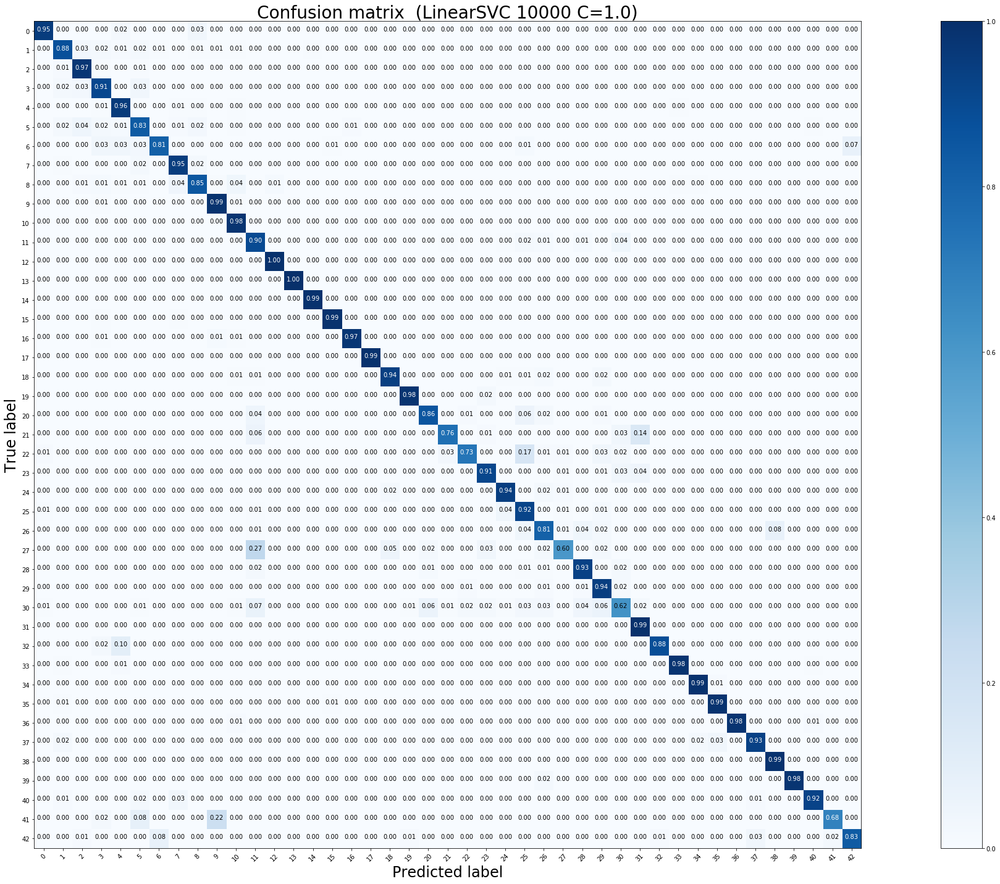

Test accuracy:  0.933729216152019 

              precision    recall  f1-score   support

           0       0.89      0.95      0.92        60
           1       0.95      0.88      0.91       720
           2       0.91      0.97      0.94       750
           3       0.89      0.91      0.90       450
           4       0.95      0.96      0.95       660
           5       0.89      0.83      0.86       630
           6       0.90      0.81      0.85       150
           7       0.92      0.95      0.93       450
           8       0.92      0.85      0.88       450
           9       0.95      0.99      0.97       480
          10       0.94      0.98      0.96       660
          11       0.89      0.90      0.89       420
          12       0.99      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.98      0.99      0.98       270
          15       0.96      0.99      0.98       210
          16       0.94      0.97      0.95  

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


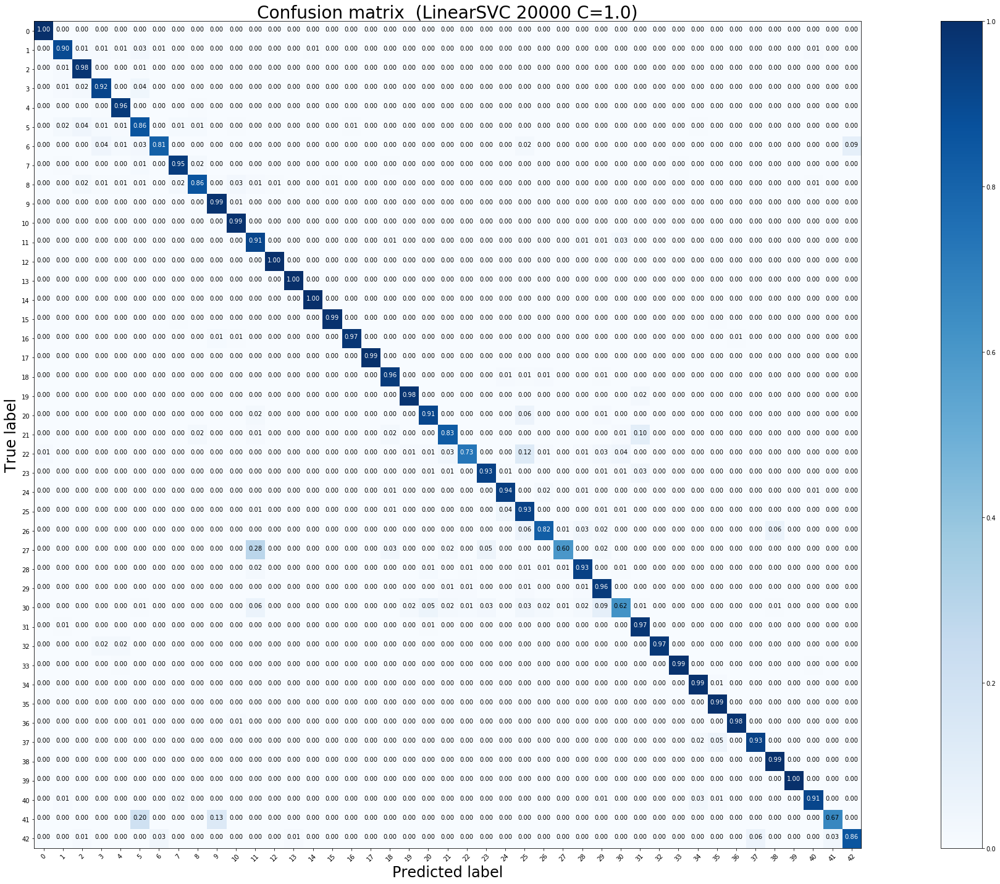

Test accuracy:  0.9424386381631037 

              precision    recall  f1-score   support

           0       0.95      1.00      0.98        60
           1       0.96      0.90      0.93       720
           2       0.93      0.98      0.95       750
           3       0.93      0.92      0.92       450
           4       0.97      0.96      0.96       660
           5       0.89      0.86      0.87       630
           6       0.92      0.81      0.87       150
           7       0.94      0.95      0.95       450
           8       0.94      0.86      0.90       450
           9       0.97      0.99      0.98       480
          10       0.96      0.99      0.98       660
          11       0.90      0.91      0.91       420
          12       0.99      1.00      1.00       690
          13       1.00      1.00      1.00       720
          14       0.97      1.00      0.99       270
          15       0.97      0.99      0.98       210
          16       0.96      0.97      0.97 

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


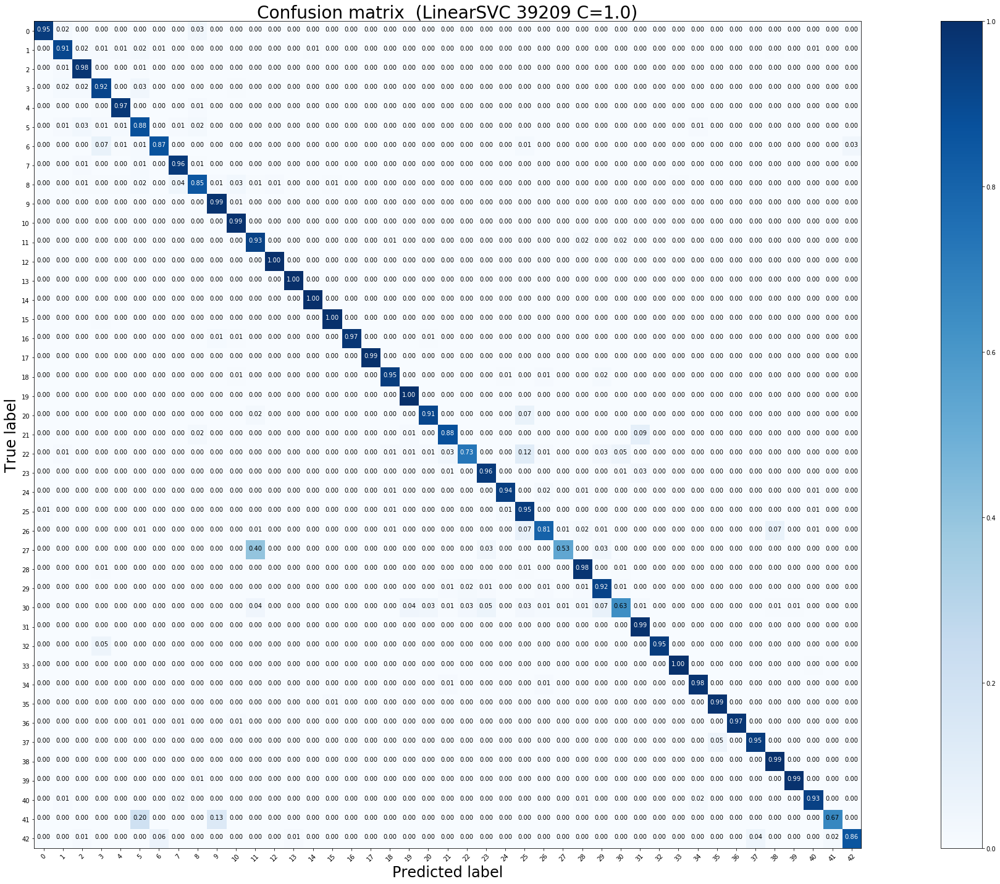

Test accuracy:  0.9465558194774347 

              precision    recall  f1-score   support

           0       0.93      0.95      0.94        60
           1       0.96      0.91      0.94       720
           2       0.94      0.98      0.96       750
           3       0.92      0.92      0.92       450
           4       0.97      0.97      0.97       660
           5       0.89      0.88      0.88       630
           6       0.92      0.87      0.89       150
           7       0.94      0.96      0.95       450
           8       0.93      0.85      0.89       450
           9       0.96      0.99      0.97       480
          10       0.96      0.99      0.97       660
          11       0.91      0.93      0.92       420
          12       0.99      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.97      1.00      0.99       270
          15       0.96      1.00      0.98       210
          16       0.98      0.97      0.98 

In [20]:
##############################################################################
###########   LinearSVC, HOG, hinge, seed=1, random_A, without_scaler ########
###########   Defaultwerte   #################################################
##############################################################################

train_LinearSVC(X_tr_500, X_test_9_4_2, y_tr_500, y_test, 1, '500',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_1000, X_test_9_4_2, y_tr_1000, y_test, 1, '1000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_2000, X_test_9_4_2, y_tr_2000, y_test, 1, '2000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_5000, X_test_9_4_2, y_tr_5000, y_test, 1, '5000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_10000, X_test_9_4_2, y_tr_10000, y_test, 1, '10000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_20000, X_test_9_4_2, y_tr_20000, y_test, 1, '20000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr, X_test_9_4_2, y_tr, y_test, 1, '39209',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")

In [35]:
#### GridSearch, ohne StandardScaler, mit l2, hinge
# 1. DL
print('********************************************************************************')
print(' GridSearch 500 1. DL: ')
clf_500_lin, time_500_lin = tuning_hyper_params(X_tr_500, y_tr_500, X_test_9_4_2, y_test, 'LinearSVC', 10, 0, 0, 
                                                np.logspace(-16,10,14, base=2), np.logspace(-16,4,11, base=2), 'l2', 'hinge', 1)
save_trained_model_as_pkl(clf_500_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/500/seed_1_random_A_without_scaler/GridSearch_1DL.pkl")
save_as_csv(time_500_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/500/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_1_DL.csv')
print('********************************************************************************')
print(' GridSearch 1000 1. DL: ')
clf_1000_lin, time_1000_lin = tuning_hyper_params(X_tr_1000, y_tr_1000, X_test_9_4_2, y_test, 'LinearSVC', 10, 0, 0, 
                                                np.logspace(-16,10,14, base=2), np.logspace(-16,4,11, base=2),'l2', 'hinge', 1)
save_trained_model_as_pkl(clf_1000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/1000/seed_1_random_A_without_scaler/GridSearch_1DL.pkl")
save_as_csv(time_1000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/1000/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_1_DL.csv')
print('********************************************************************************')
print(' GridSearch 2000 1. DL: ')
clf_2000_lin, time_2000_lin = tuning_hyper_params(X_tr_2000, y_tr_2000, X_test_9_4_2, y_test, 'LinearSVC', 10, 0, 0, 
                                                np.logspace(-16,10,14, base=2), np.logspace(-16,4,11, base=2),'l2', 'hinge', 1)
save_trained_model_as_pkl(clf_2000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/2000/seed_1_random_A_without_scaler/GridSearch_1DL.pkl")
save_as_csv(time_2000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/2000/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_1_DL.csv')
print('********************************************************************************')
print(' GridSearch 5000 1. DL: ')
clf_5000_lin, time_5000_lin = tuning_hyper_params(X_tr_5000, y_tr_5000, X_test_9_4_2, y_test, 'LinearSVC', 10, 0, 0, 
                                                np.logspace(-16,10,14, base=2), np.logspace(-16,4,11, base=2),'l2', 'hinge', 1)
save_trained_model_as_pkl(clf_5000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/5000/seed_1_random_A_without_scaler/GridSearch_1DL.pkl")
save_as_csv(time_5000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/5000/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_1_DL.csv')

********************************************************************************
 GridSearch 500 1. DL: 


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 2 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)



 C_range: [1.526e-05 6.104e-05 2.441e-04 9.766e-04 3.906e-03 1.562e-02 6.250e-02
 2.500e-01 1.000e+00 4.000e+00 1.600e+01 6.400e+01 2.560e+02 1.024e+03]

 Bester Score:  0.730807504879981

 Besten Parameter:  {'svm__C': 1.0}
Bester Estimator score:  0.8239904988123515
Precision-Score: 0.268205 (0.101985) mit Parameter: {'svm__C': 1.52587890625e-05}
Precision-Score: 0.268205 (0.101985) mit Parameter: {'svm__C': 6.103515625e-05}
Precision-Score: 0.268205 (0.101985) mit Parameter: {'svm__C': 0.000244140625}
Precision-Score: 0.390251 (0.121088) mit Parameter: {'svm__C': 0.0009765625}
Precision-Score: 0.577769 (0.098701) mit Parameter: {'svm__C': 0.00390625}
Precision-Score: 0.641787 (0.092027) mit Parameter: {'svm__C': 0.015625}
Precision-Score: 0.659138 (0.094063) mit Parameter: {'svm__C': 0.0625}
Precision-Score: 0.730655 (0.118622) mit Parameter: {'svm__C': 0.25}
Precision-Score: 0.729905 (0.124405) mit Parameter: {'svm__C': 1.0}
Precision-Score: 0.731046 (0.123519) mit Parameter: {'sv

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 5 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)



 C_range: [1.526e-05 6.104e-05 2.441e-04 9.766e-04 3.906e-03 1.562e-02 6.250e-02
 2.500e-01 1.000e+00 4.000e+00 1.600e+01 6.400e+01 2.560e+02 1.024e+03]

 Bester Score:  0.8682409759775612

 Besten Parameter:  {'svm__C': 1.0}
Bester Estimator score:  0.8776722090261283
Precision-Score: 0.210851 (0.037876) mit Parameter: {'svm__C': 1.52587890625e-05}
Precision-Score: 0.210851 (0.037876) mit Parameter: {'svm__C': 6.103515625e-05}
Precision-Score: 0.265867 (0.040953) mit Parameter: {'svm__C': 0.000244140625}
Precision-Score: 0.603140 (0.066838) mit Parameter: {'svm__C': 0.0009765625}
Precision-Score: 0.725212 (0.051264) mit Parameter: {'svm__C': 0.00390625}
Precision-Score: 0.765359 (0.049300) mit Parameter: {'svm__C': 0.015625}
Precision-Score: 0.796984 (0.044017) mit Parameter: {'svm__C': 0.0625}
Precision-Score: 0.846804 (0.035182) mit Parameter: {'svm__C': 0.25}
Precision-Score: 0.870529 (0.042265) mit Parameter: {'svm__C': 1.0}
Precision-Score: 0.871651 (0.041081) mit Parameter: {'s

********************************************************************************
 GridSearch 5000 1. DL: 


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)



 C_range: [1.526e-05 6.104e-05 2.441e-04 9.766e-04 3.906e-03 1.562e-02 6.250e-02
 2.500e-01 1.000e+00 4.000e+00 1.600e+01 6.400e+01 2.560e+02 1.024e+03]

 Bester Score:  0.9651237813007912

 Besten Parameter:  {'svm__C': 4.0}
Bester Estimator score:  0.920665083135392
Precision-Score: 0.203486 (0.003851) mit Parameter: {'svm__C': 1.52587890625e-05}
Precision-Score: 0.450663 (0.022747) mit Parameter: {'svm__C': 6.103515625e-05}
Precision-Score: 0.805285 (0.029297) mit Parameter: {'svm__C': 0.000244140625}
Precision-Score: 0.835290 (0.026958) mit Parameter: {'svm__C': 0.0009765625}
Precision-Score: 0.869988 (0.020533) mit Parameter: {'svm__C': 0.00390625}
Precision-Score: 0.892173 (0.015978) mit Parameter: {'svm__C': 0.015625}
Precision-Score: 0.924417 (0.017652) mit Parameter: {'svm__C': 0.0625}
Precision-Score: 0.956316 (0.011800) mit Parameter: {'svm__C': 0.25}
Precision-Score: 0.968134 (0.011542) mit Parameter: {'svm__C': 1.0}
Precision-Score: 0.972588 (0.006477) mit Parameter: {'sv

In [37]:
#### GridSearch, ohne StandardScaler, mit l2, hinge
# 2. DL
print('********************************************************************************')
print(' GridSearch 500 2. DL: ')
clf_500_lin, time_500_lin = tuning_hyper_params(X_tr_500, y_tr_500, X_test_9_4_2, y_test, 'LinearSVC', 10, 0, 0, 
                                                get_finer_range(1.0), np.logspace(-16,4,11, base=2), 'l2', 'hinge', 1)
save_trained_model_as_pkl(clf_500_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/500/seed_1_random_A_without_scaler/GridSearch_2DL.pkl")
save_as_csv(time_500_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/500/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_2_DL.csv')
print('********************************************************************************')
print(' GridSearch 1000 2. DL: ')
clf_1000_lin, time_1000_lin = tuning_hyper_params(X_tr_1000, y_tr_1000, X_test_9_4_2, y_test, 'LinearSVC', 10, 0, 0, 
                                                get_finer_range(1.0), np.logspace(-16,4,11, base=2),'l2', 'hinge', 1)
save_trained_model_as_pkl(clf_1000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/1000/seed_1_random_A_without_scaler/GridSearch_2DL.pkl")
save_as_csv(time_1000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/1000/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_2_DL.csv')
print('********************************************************************************')
print(' GridSearch 2000 2. DL: ')
clf_2000_lin, time_2000_lin = tuning_hyper_params(X_tr_2000, y_tr_2000, X_test_9_4_2, y_test, 'LinearSVC', 10, 0, 0, 
                                                get_finer_range(1.0), np.logspace(-16,4,11, base=2),'l2', 'hinge', 1)
save_trained_model_as_pkl(clf_2000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/2000/seed_1_random_A_without_scaler/GridSearch_2DL.pkl")
save_as_csv(time_2000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/2000/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_2_DL.csv')
print('********************************************************************************')
print(' GridSearch 5000 2. DL: ')
clf_5000_lin, time_5000_lin = tuning_hyper_params(X_tr_5000, y_tr_5000, X_test_9_4_2, y_test, 'LinearSVC', 10, 0, 0, 
                                                get_finer_range(4.0), np.logspace(-16,4,11, base=2),'l2', 'hinge', 1)
save_trained_model_as_pkl(clf_5000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/5000/seed_1_random_A_without_scaler/GridSearch_2DL.pkl")
save_as_csv(time_5000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/5000/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_2_DL.csv')

********************************************************************************
 GridSearch 500 2. DL: 


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 2 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)



 C_range: [0.25  0.297 0.354 0.42  0.5   0.595 0.707 0.841 1.    1.189 1.414 1.682
 2.    2.378 2.828 3.364 4.   ]

 Bester Score:  0.7437299785394502

 Besten Parameter:  {'svm__C': 0.42044820762685725}
Bester Estimator score:  0.8140142517814727
Precision-Score: 0.730655 (0.118622) mit Parameter: {'svm__C': 0.25}
Precision-Score: 0.735419 (0.118370) mit Parameter: {'svm__C': 0.29730177875068026}
Precision-Score: 0.738487 (0.121175) mit Parameter: {'svm__C': 0.3535533905932738}
Precision-Score: 0.744047 (0.122229) mit Parameter: {'svm__C': 0.42044820762685725}
Precision-Score: 0.720349 (0.121964) mit Parameter: {'svm__C': 0.5}
Precision-Score: 0.718993 (0.120861) mit Parameter: {'svm__C': 0.5946035575013605}
Precision-Score: 0.728253 (0.119999) mit Parameter: {'svm__C': 0.7071067811865476}
Precision-Score: 0.730252 (0.122130) mit Parameter: {'svm__C': 0.8408964152537145}
Precision-Score: 0.729905 (0.124405) mit Parameter: {'svm__C': 1.0}
Precision-Score: 0.727269 (0.125465) mit Param

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 5 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)



 C_range: [0.25  0.297 0.354 0.42  0.5   0.595 0.707 0.841 1.    1.189 1.414 1.682
 2.    2.378 2.828 3.364 4.   ]

 Bester Score:  0.8705041550937751

 Besten Parameter:  {'svm__C': 0.8408964152537145}
Bester Estimator score:  0.8778305621536026
Precision-Score: 0.846804 (0.035182) mit Parameter: {'svm__C': 0.25}
Precision-Score: 0.856655 (0.032388) mit Parameter: {'svm__C': 0.29730177875068026}
Precision-Score: 0.859707 (0.031887) mit Parameter: {'svm__C': 0.3535533905932738}
Precision-Score: 0.859724 (0.032371) mit Parameter: {'svm__C': 0.42044820762685725}
Precision-Score: 0.864751 (0.031019) mit Parameter: {'svm__C': 0.5}
Precision-Score: 0.864402 (0.030458) mit Parameter: {'svm__C': 0.5946035575013605}
Precision-Score: 0.863333 (0.032781) mit Parameter: {'svm__C': 0.7071067811865476}
Precision-Score: 0.872595 (0.039836) mit Parameter: {'svm__C': 0.8408964152537145}
Precision-Score: 0.870529 (0.042265) mit Parameter: {'svm__C': 1.0}
Precision-Score: 0.866020 (0.041962) mit Parame


 C_range: [ 1.     1.189  1.414  1.682  2.     2.378  2.828  3.364  4.     4.757
  5.657  6.727  8.     9.514 11.314 13.454 16.   ]

 Bester Score:  0.96513199240537

 Besten Parameter:  {'svm__C': 3.363585661014858}
Bester Estimator score:  0.9214568487727632
Precision-Score: 0.968134 (0.011542) mit Parameter: {'svm__C': 1.0}
Precision-Score: 0.969344 (0.010439) mit Parameter: {'svm__C': 1.189207115002721}
Precision-Score: 0.970010 (0.010294) mit Parameter: {'svm__C': 1.4142135623730951}
Precision-Score: 0.970059 (0.009634) mit Parameter: {'svm__C': 1.681792830507429}
Precision-Score: 0.970151 (0.009395) mit Parameter: {'svm__C': 2.0}
Precision-Score: 0.970635 (0.008348) mit Parameter: {'svm__C': 2.378414230005442}
Precision-Score: 0.971021 (0.007547) mit Parameter: {'svm__C': 2.8284271247461903}
Precision-Score: 0.972249 (0.007415) mit Parameter: {'svm__C': 3.363585661014858}
Precision-Score: 0.972588 (0.006477) mit Parameter: {'svm__C': 4.0}
Precision-Score: 0.972335 (0.006748) mit

In [36]:
print('********************************************************************************')
print(' GridSearch 10000 1. DL: ')
print('')
clf_10000_lin, time_10000_lin = tuning_hyper_params(X_tr_10000, y_tr_10000, X_test_9_4_2, y_test, 'LinearSVC', 5, 0, 0, 
                                                np.logspace(-16,6,12, base=2), np.logspace(-16,4,11, base=2),'l2', 'hinge',1)
save_trained_model_as_pkl(clf_10000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/10000/seed_1_random_A_without_scaler/GridSearch_1DL.pkl")
save_as_csv(time_10000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/10000/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_1_DL.csv')

print('********************************************************************************')
print(' GridSearch 20000 1. DL: ')
print('')
clf_20000_lin, time_20000_lin = tuning_hyper_params(X_tr_20000, y_tr_20000, X_test_9_4_2, y_test, 'LinearSVC', 3, 0, 0, 
                                                np.logspace(-16,6,12, base=2), np.logspace(-16,4,11, base=2),'l2', 'hinge',1)
save_trained_model_as_pkl(clf_20000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/20000/seed_1_random_A_without_scaler/GridSearch_1DL.pkl")
save_as_csv(time_20000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/20000/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_1_DL.csv')

print('********************************************************************************')
print(' GridSearch 39209 1. DL: ')
print('')
clf_39209_lin, time_39209_lin = tuning_hyper_params(X_train_9_4_2, y_train, X_test_9_4_2, y_test, 'LinearSVC', 3, 0, 0, 
                                                np.logspace(-16,6,12, base=2), np.logspace(-16,4,11, base=2),'l2', 'hinge',1)
save_trained_model_as_pkl(clf_39209_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/39209/seed_1_random_A_without_scaler/GridSearch_1DL.pkl")
save_as_csv(time_39209_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/39209/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_1_DL.csv')

********************************************************************************
 GridSearch 10000 1. DL: 


 C_range: [1.526e-05 6.104e-05 2.441e-04 9.766e-04 3.906e-03 1.562e-02 6.250e-02
 2.500e-01 1.000e+00 4.000e+00 1.600e+01 6.400e+01]

 Bester Score:  0.9734735314185525

 Besten Parameter:  {'svm__C': 1.0}
Bester Estimator score:  0.933729216152019
Precision-Score: 0.205875 (0.004395) mit Parameter: {'svm__C': 1.52587890625e-05}
Precision-Score: 0.676236 (0.043125) mit Parameter: {'svm__C': 6.103515625e-05}
Precision-Score: 0.835836 (0.012308) mit Parameter: {'svm__C': 0.000244140625}
Precision-Score: 0.858500 (0.011705) mit Parameter: {'svm__C': 0.0009765625}
Precision-Score: 0.881945 (0.009047) mit Parameter: {'svm__C': 0.00390625}
Precision-Score: 0.907483 (0.010497) mit Parameter: {'svm__C': 0.015625}
Precision-Score: 0.938843 (0.005909) mit Parameter: {'svm__C': 0.0625}
Precision-Score: 0.958196 (0.005296) mit Parameter: {'svm__C': 0.25}
Precision-Score: 0.974768 (0.004602)

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)



 C_range: [1.526e-05 6.104e-05 2.441e-04 9.766e-04 3.906e-03 1.562e-02 6.250e-02
 2.500e-01 1.000e+00 4.000e+00 1.600e+01 6.400e+01]

 Bester Score:  0.977319319716332

 Besten Parameter:  {'svm__C': 1.0}
Bester Estimator score:  0.9424386381631037
Precision-Score: 0.424265 (0.002016) mit Parameter: {'svm__C': 1.52587890625e-05}
Precision-Score: 0.840472 (0.006797) mit Parameter: {'svm__C': 6.103515625e-05}
Precision-Score: 0.851668 (0.010108) mit Parameter: {'svm__C': 0.000244140625}
Precision-Score: 0.880054 (0.005456) mit Parameter: {'svm__C': 0.0009765625}
Precision-Score: 0.897598 (0.003492) mit Parameter: {'svm__C': 0.00390625}
Precision-Score: 0.924884 (0.002323) mit Parameter: {'svm__C': 0.015625}
Precision-Score: 0.951294 (0.001994) mit Parameter: {'svm__C': 0.0625}
Precision-Score: 0.968187 (0.003356) mit Parameter: {'svm__C': 0.25}
Precision-Score: 0.976396 (0.001479) mit Parameter: {'svm__C': 1.0}
Precision-Score: 0.977687 (0.002969) mit Parameter: {'svm__C': 4.0}
Precisio

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)



 C_range: [1.526e-05 6.104e-05 2.441e-04 9.766e-04 3.906e-03 1.562e-02 6.250e-02
 2.500e-01 1.000e+00 4.000e+00 1.600e+01 6.400e+01]

 Bester Score:  0.9429444093961868

 Besten Parameter:  {'svm__C': 1.0}
Bester Estimator score:  0.9465558194774347
Precision-Score: 0.595924 (0.010310) mit Parameter: {'svm__C': 1.52587890625e-05}
Precision-Score: 0.800265 (0.011328) mit Parameter: {'svm__C': 6.103515625e-05}
Precision-Score: 0.820378 (0.006246) mit Parameter: {'svm__C': 0.000244140625}
Precision-Score: 0.848828 (0.005996) mit Parameter: {'svm__C': 0.0009765625}
Precision-Score: 0.870579 (0.006510) mit Parameter: {'svm__C': 0.00390625}
Precision-Score: 0.904080 (0.003775) mit Parameter: {'svm__C': 0.015625}
Precision-Score: 0.929451 (0.001636) mit Parameter: {'svm__C': 0.0625}
Precision-Score: 0.942559 (0.001531) mit Parameter: {'svm__C': 0.25}
Precision-Score: 0.945715 (0.002013) mit Parameter: {'svm__C': 1.0}
Precision-Score: 0.945667 (0.003288) mit Parameter: {'svm__C': 4.0}
Precisi

In [39]:
print('********************************************************************************')
print(' GridSearch 10000 2. DL: ')
print('')
clf_10000_lin, time_10000_lin = tuning_hyper_params(X_tr_10000, y_tr_10000, X_test_9_4_2, y_test, 'LinearSVC', 5, 0, 0, 
                                                get_finer_range(1), np.logspace(-16,4,11, base=2),'l2', 'hinge',1)
save_trained_model_as_pkl(clf_10000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/10000/seed_1_random_A_without_scaler/GridSearch_2DL.pkl")
save_as_csv(time_10000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/10000/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_2_DL.csv')

print('********************************************************************************')
print(' GridSearch 20000 2. DL: ')
print('')
clf_20000_lin, time_20000_lin = tuning_hyper_params(X_tr_20000, y_tr_20000, X_test_9_4_2, y_test, 'LinearSVC', 3, 0, 0, 
                                                get_finer_range(1), np.logspace(-16,4,11, base=2),'l2', 'hinge',1)
save_trained_model_as_pkl(clf_20000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/20000/seed_1_random_A_without_scaler/GridSearch_2DL.pkl")
save_as_csv(time_20000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/20000/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_2_DL.csv')

print('********************************************************************************')
print(' GridSearch 39209 2. DL: ')
print('')
clf_39209_lin, time_39209_lin = tuning_hyper_params(X_train_9_4_2, y_train, X_test_9_4_2, y_test, 'LinearSVC', 3, 0, 0, 
                                                get_finer_range(1), np.logspace(-16,4,11, base=2),'l2', 'hinge',1)
save_trained_model_as_pkl(clf_39209_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/39209/seed_1_random_A_without_scaler/GridSearch_2DL.pkl")
save_as_csv(time_39209_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/39209/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_2_DL.csv')

********************************************************************************
 GridSearch 10000 2. DL: 


 C_range: [0.25  0.297 0.354 0.42  0.5   0.595 0.707 0.841 1.    1.189 1.414 1.682
 2.    2.378 2.828 3.364 4.   ]

 Bester Score:  0.9734735314185525

 Besten Parameter:  {'svm__C': 1.0}
Bester Estimator score:  0.933729216152019
Precision-Score: 0.958196 (0.005296) mit Parameter: {'svm__C': 0.25}
Precision-Score: 0.960552 (0.004957) mit Parameter: {'svm__C': 0.29730177875068026}
Precision-Score: 0.963768 (0.005558) mit Parameter: {'svm__C': 0.3535533905932738}
Precision-Score: 0.966751 (0.004951) mit Parameter: {'svm__C': 0.42044820762685725}
Precision-Score: 0.969791 (0.004180) mit Parameter: {'svm__C': 0.5}
Precision-Score: 0.970801 (0.004460) mit Parameter: {'svm__C': 0.5946035575013605}
Precision-Score: 0.972748 (0.004695) mit Parameter: {'svm__C': 0.7071067811865476}
Precision-Score: 0.973733 (0.004320) mit Parameter: {'svm__C': 0.8408964152537145}
Precision-Score: 0.9747

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)



 C_range: [0.25  0.297 0.354 0.42  0.5   0.595 0.707 0.841 1.    1.189 1.414 1.682
 2.    2.378 2.828 3.364 4.   ]

 Bester Score:  0.9777106561595363

 Besten Parameter:  {'svm__C': 3.363585661014858}
Bester Estimator score:  0.9394299287410927
Precision-Score: 0.968187 (0.003356) mit Parameter: {'svm__C': 0.25}
Precision-Score: 0.969228 (0.003097) mit Parameter: {'svm__C': 0.29730177875068026}
Precision-Score: 0.970133 (0.002461) mit Parameter: {'svm__C': 0.3535533905932738}
Precision-Score: 0.971160 (0.002317) mit Parameter: {'svm__C': 0.42044820762685725}
Precision-Score: 0.972744 (0.002739) mit Parameter: {'svm__C': 0.5}
Precision-Score: 0.974307 (0.002596) mit Parameter: {'svm__C': 0.5946035575013605}
Precision-Score: 0.975102 (0.002346) mit Parameter: {'svm__C': 0.7071067811865476}
Precision-Score: 0.975878 (0.002214) mit Parameter: {'svm__C': 0.8408964152537145}
Precision-Score: 0.976396 (0.001479) mit Parameter: {'svm__C': 1.0}
Precision-Score: 0.976785 (0.001823) mit Paramet

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)



 C_range: [0.25  0.297 0.354 0.42  0.5   0.595 0.707 0.841 1.    1.189 1.414 1.682
 2.    2.378 2.828 3.364 4.   ]

 Bester Score:  0.9440409061567469

 Besten Parameter:  {'svm__C': 0.5}
Bester Estimator score:  0.9475851148060174
Precision-Score: 0.942559 (0.001531) mit Parameter: {'svm__C': 0.25}
Precision-Score: 0.943033 (0.001142) mit Parameter: {'svm__C': 0.29730177875068026}
Precision-Score: 0.943118 (0.000950) mit Parameter: {'svm__C': 0.3535533905932738}
Precision-Score: 0.944133 (0.002161) mit Parameter: {'svm__C': 0.42044820762685725}
Precision-Score: 0.945085 (0.001816) mit Parameter: {'svm__C': 0.5}
Precision-Score: 0.945560 (0.002003) mit Parameter: {'svm__C': 0.5946035575013605}
Precision-Score: 0.945874 (0.001818) mit Parameter: {'svm__C': 0.7071067811865476}
Precision-Score: 0.946135 (0.001980) mit Parameter: {'svm__C': 0.8408964152537145}
Precision-Score: 0.945715 (0.002013) mit Parameter: {'svm__C': 1.0}
Precision-Score: 0.945858 (0.002046) mit Parameter: {'svm__C':

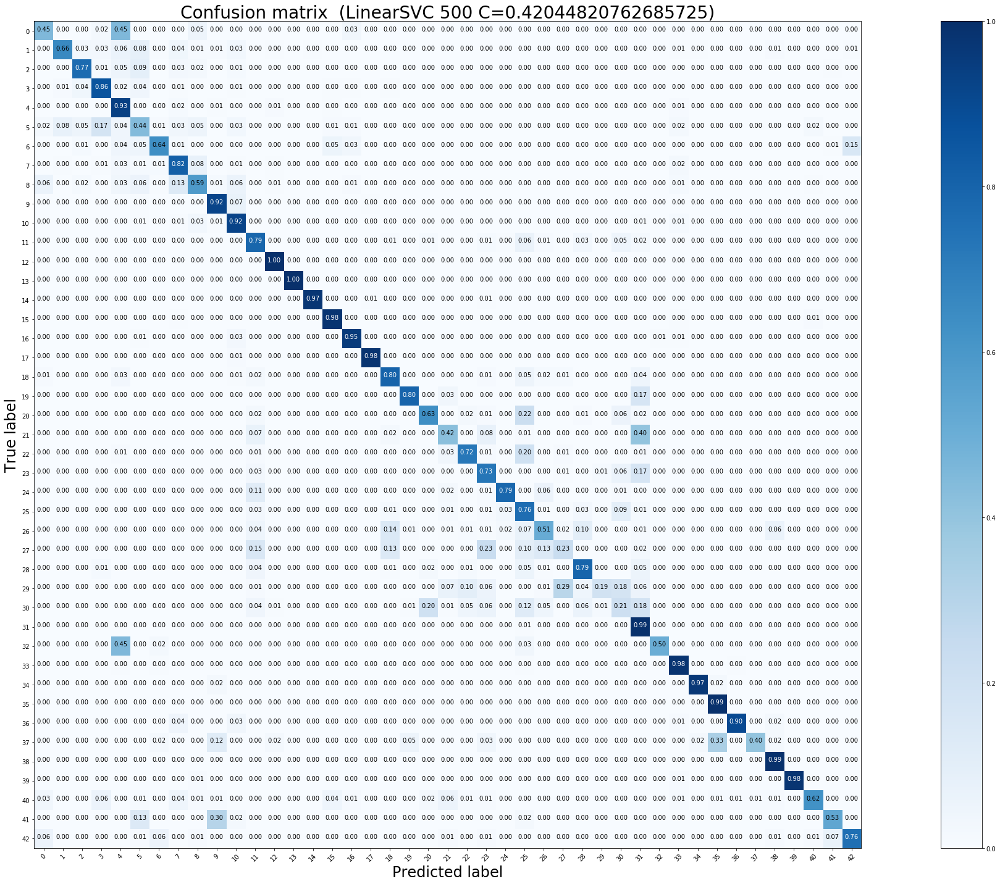

Test accuracy:  0.8140142517814727 

              precision    recall  f1-score   support

           0       0.35      0.45      0.39        60
           1       0.89      0.66      0.76       720
           2       0.88      0.77      0.82       750
           3       0.72      0.86      0.78       450
           4       0.74      0.93      0.83       660
           5       0.58      0.44      0.50       630
           6       0.78      0.64      0.70       150
           7       0.70      0.82      0.76       450
           8       0.70      0.59      0.64       450
           9       0.89      0.92      0.90       480
          10       0.82      0.92      0.87       660
          11       0.82      0.79      0.80       420
          12       0.97      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.98      0.97      0.98       270
          15       0.89      0.98      0.93       210
          16       0.85      0.95      0.90 

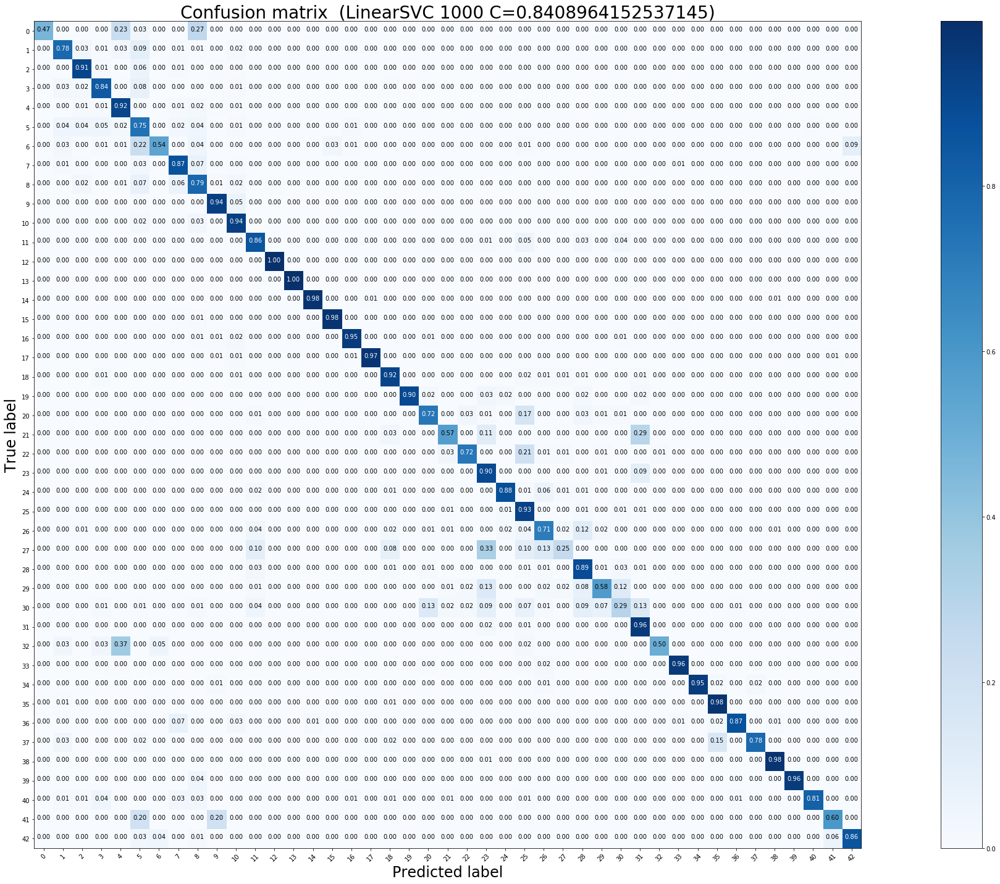

Test accuracy:  0.8778305621536026 

              precision    recall  f1-score   support

           0       0.88      0.47      0.61        60
           1       0.90      0.78      0.83       720
           2       0.89      0.91      0.90       750
           3       0.85      0.84      0.85       450
           4       0.89      0.92      0.90       660
           5       0.65      0.75      0.69       630
           6       0.87      0.54      0.67       150
           7       0.83      0.87      0.85       450
           8       0.73      0.79      0.76       450
           9       0.93      0.94      0.94       480
          10       0.88      0.94      0.91       660
          11       0.92      0.86      0.89       420
          12       0.99      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.99      0.98      0.98       270
          15       0.97      0.98      0.97       210
          16       0.89      0.95      0.92 

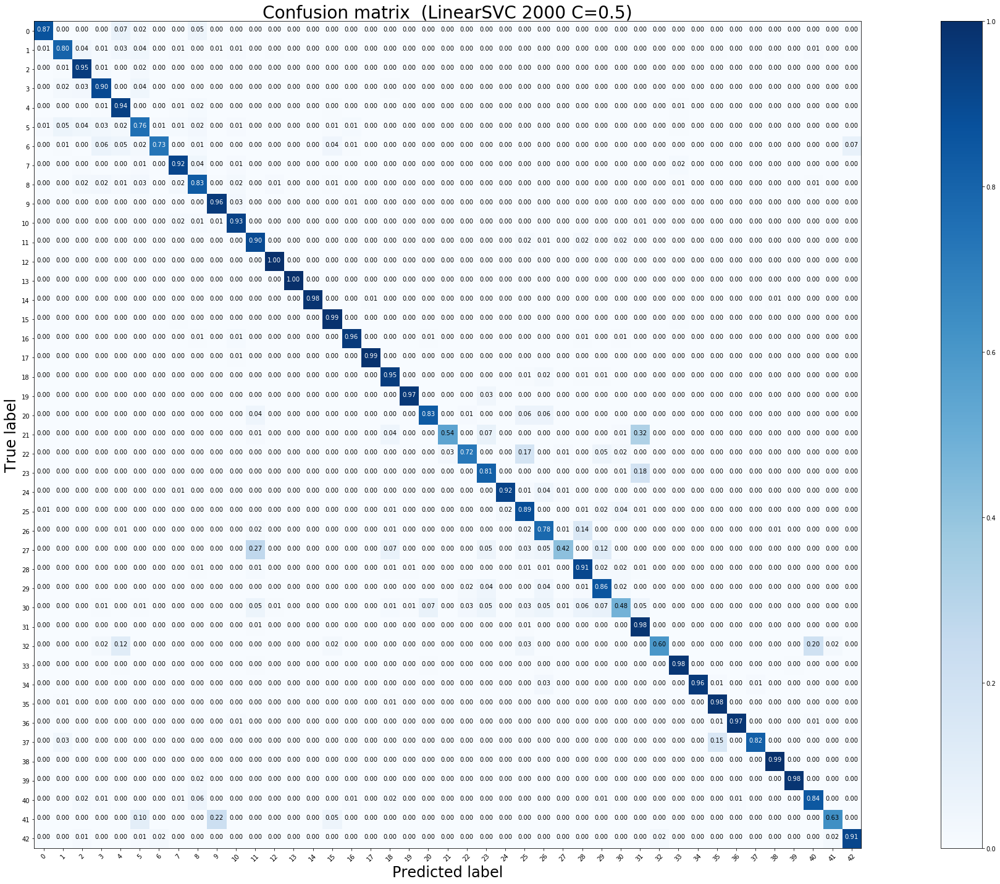

Test accuracy:  0.9049089469517023 

              precision    recall  f1-score   support

           0       0.78      0.87      0.82        60
           1       0.91      0.80      0.85       720
           2       0.90      0.95      0.92       750
           3       0.86      0.90      0.88       450
           4       0.92      0.94      0.93       660
           5       0.84      0.76      0.80       630
           6       0.91      0.73      0.81       150
           7       0.90      0.92      0.91       450
           8       0.84      0.83      0.84       450
           9       0.94      0.96      0.95       480
          10       0.93      0.93      0.93       660
          11       0.91      0.90      0.90       420
          12       0.98      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.99      0.98      0.98       270
          15       0.90      0.99      0.94       210
          16       0.88      0.96      0.92 

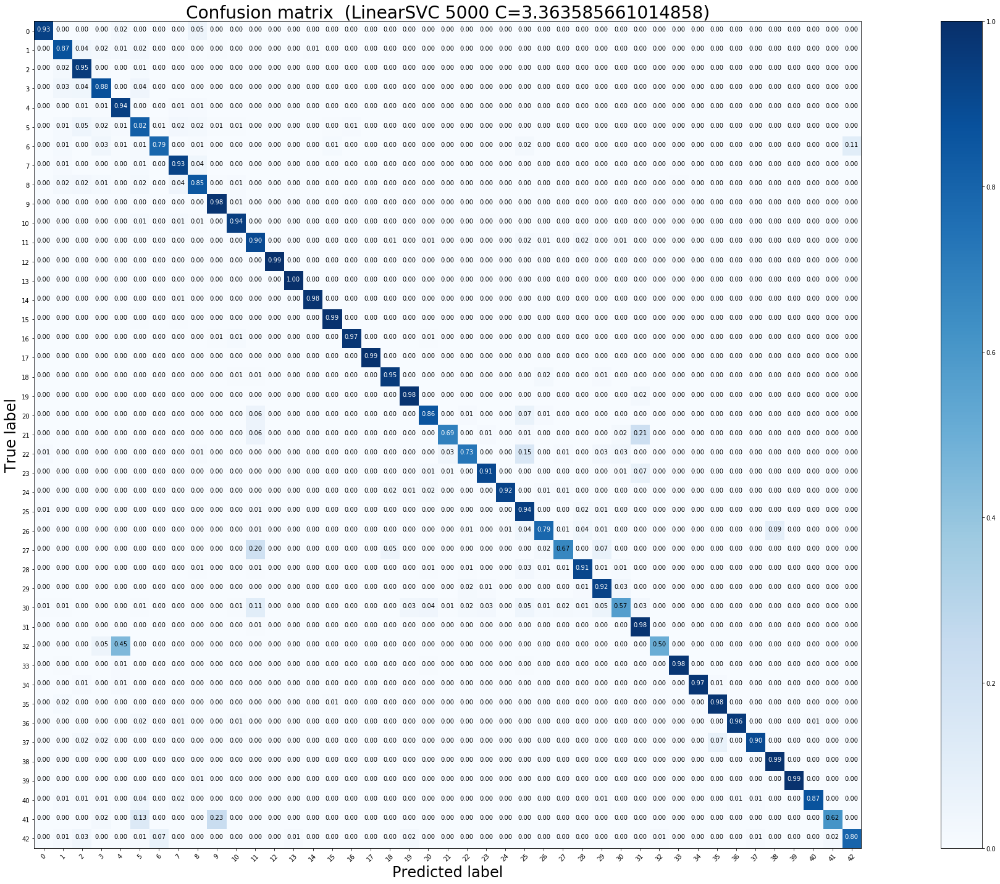

Test accuracy:  0.9214568487727632 

              precision    recall  f1-score   support

           0       0.88      0.93      0.90        60
           1       0.90      0.87      0.89       720
           2       0.87      0.95      0.91       750
           3       0.88      0.88      0.88       450
           4       0.92      0.94      0.93       660
           5       0.84      0.82      0.83       630
           6       0.92      0.79      0.85       150
           7       0.87      0.93      0.90       450
           8       0.89      0.85      0.87       450
           9       0.94      0.98      0.96       480
          10       0.96      0.94      0.95       660
          11       0.88      0.90      0.89       420
          12       0.99      0.99      0.99       690
          13       1.00      1.00      1.00       720
          14       0.98      0.98      0.98       270
          15       0.95      0.99      0.97       210
          16       0.93      0.97      0.95 

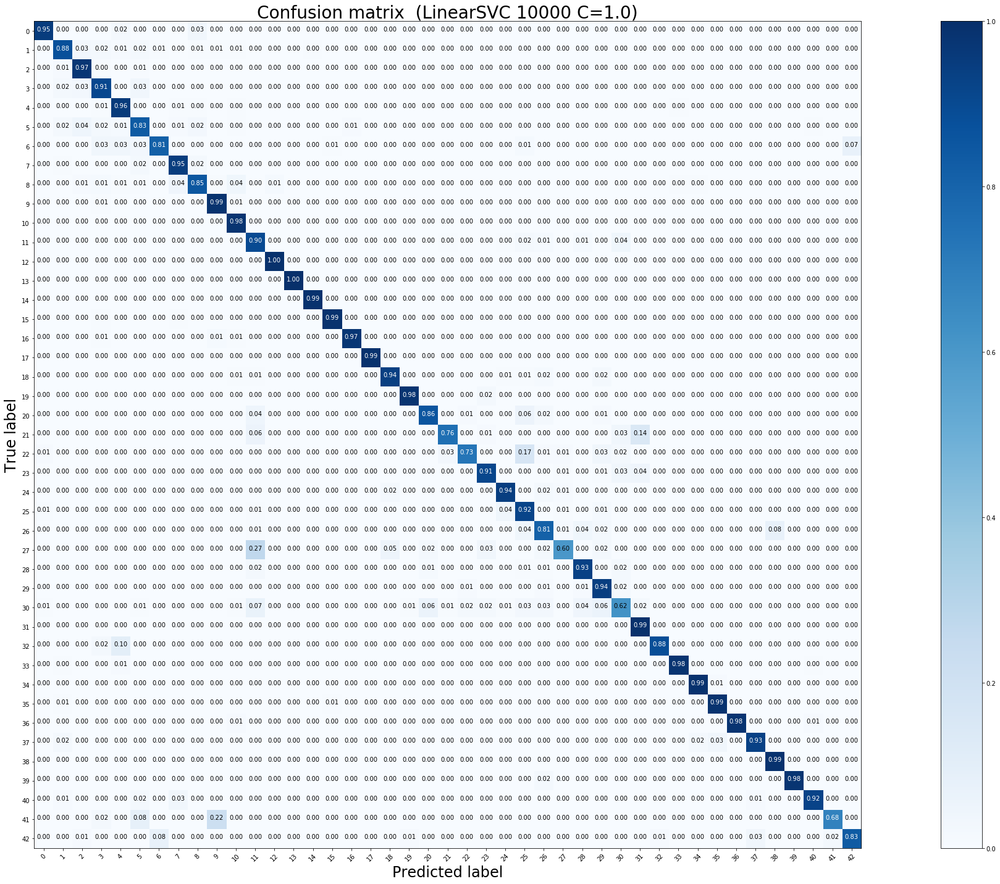

Test accuracy:  0.933729216152019 

              precision    recall  f1-score   support

           0       0.89      0.95      0.92        60
           1       0.95      0.88      0.91       720
           2       0.91      0.97      0.94       750
           3       0.89      0.91      0.90       450
           4       0.95      0.96      0.95       660
           5       0.89      0.83      0.86       630
           6       0.90      0.81      0.85       150
           7       0.92      0.95      0.93       450
           8       0.92      0.85      0.88       450
           9       0.95      0.99      0.97       480
          10       0.94      0.98      0.96       660
          11       0.89      0.90      0.89       420
          12       0.99      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.98      0.99      0.98       270
          15       0.96      0.99      0.98       210
          16       0.94      0.97      0.95  

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


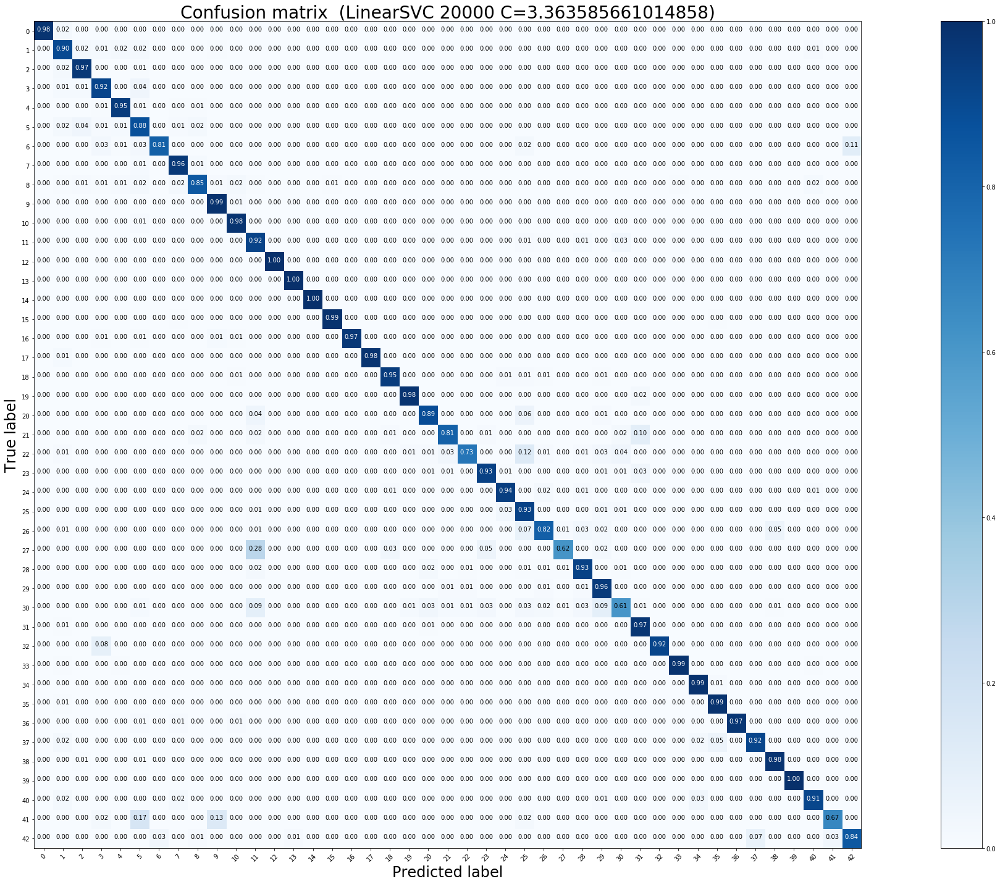

Test accuracy:  0.9394299287410927 

              precision    recall  f1-score   support

           0       0.98      0.98      0.98        60
           1       0.93      0.90      0.91       720
           2       0.92      0.97      0.95       750
           3       0.92      0.92      0.92       450
           4       0.96      0.95      0.95       660
           5       0.86      0.88      0.87       630
           6       0.94      0.81      0.87       150
           7       0.94      0.96      0.95       450
           8       0.94      0.85      0.89       450
           9       0.96      0.99      0.97       480
          10       0.97      0.98      0.97       660
          11       0.89      0.92      0.91       420
          12       1.00      1.00      1.00       690
          13       1.00      1.00      1.00       720
          14       0.99      1.00      0.99       270
          15       0.97      0.99      0.98       210
          16       0.97      0.97      0.97 

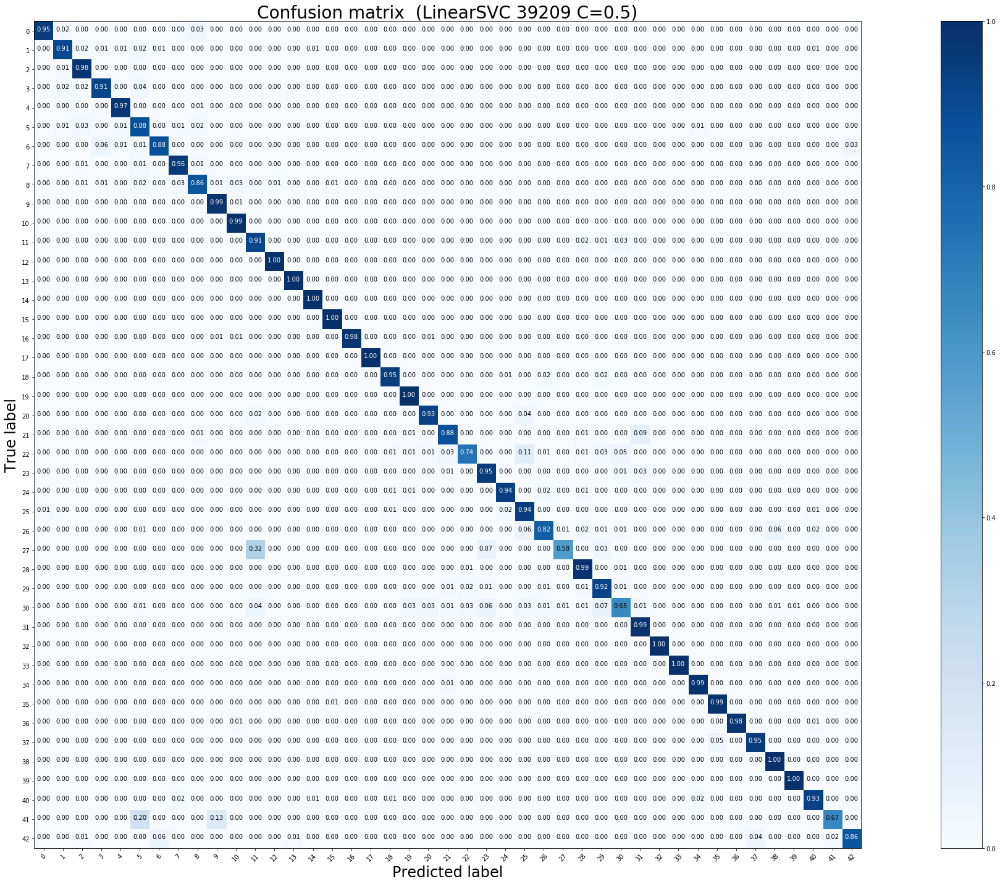

Test accuracy:  0.9475851148060174 

              precision    recall  f1-score   support

           0       0.90      0.95      0.93        60
           1       0.97      0.91      0.93       720
           2       0.94      0.98      0.96       750
           3       0.94      0.91      0.92       450
           4       0.97      0.97      0.97       660
           5       0.89      0.88      0.88       630
           6       0.91      0.88      0.89       150
           7       0.94      0.96      0.95       450
           8       0.94      0.86      0.90       450
           9       0.97      0.99      0.98       480
          10       0.96      0.99      0.97       660
          11       0.93      0.91      0.92       420
          12       0.99      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.97      1.00      0.98       270
          15       0.96      1.00      0.98       210
          16       0.99      0.98      0.98 

In [ ]:
# LinearSVCs mit optimierten Parametern trainieren
train_LinearSVC(X_tr_500, X_test_9_4_2, y_tr_500, y_test, 1, '500',0.42044820762685725, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_1000, X_test_9_4_2, y_tr_1000, y_test, 1, '1000',0.8408964152537145, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_2000, X_test_9_4_2, y_tr_2000, y_test, 1, '2000',0.5, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_5000, X_test_9_4_2, y_tr_5000, y_test, 1, '5000',3.363585661014858, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_10000, X_test_9_4_2, y_tr_10000, y_test, 1, '10000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_20000, X_test_9_4_2, y_tr_20000, y_test, 1, '20000',3.363585661014858, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr, X_test_9_4_2, y_tr, y_test, 1, '39209',0.5, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")

Daten skalieren ohne std


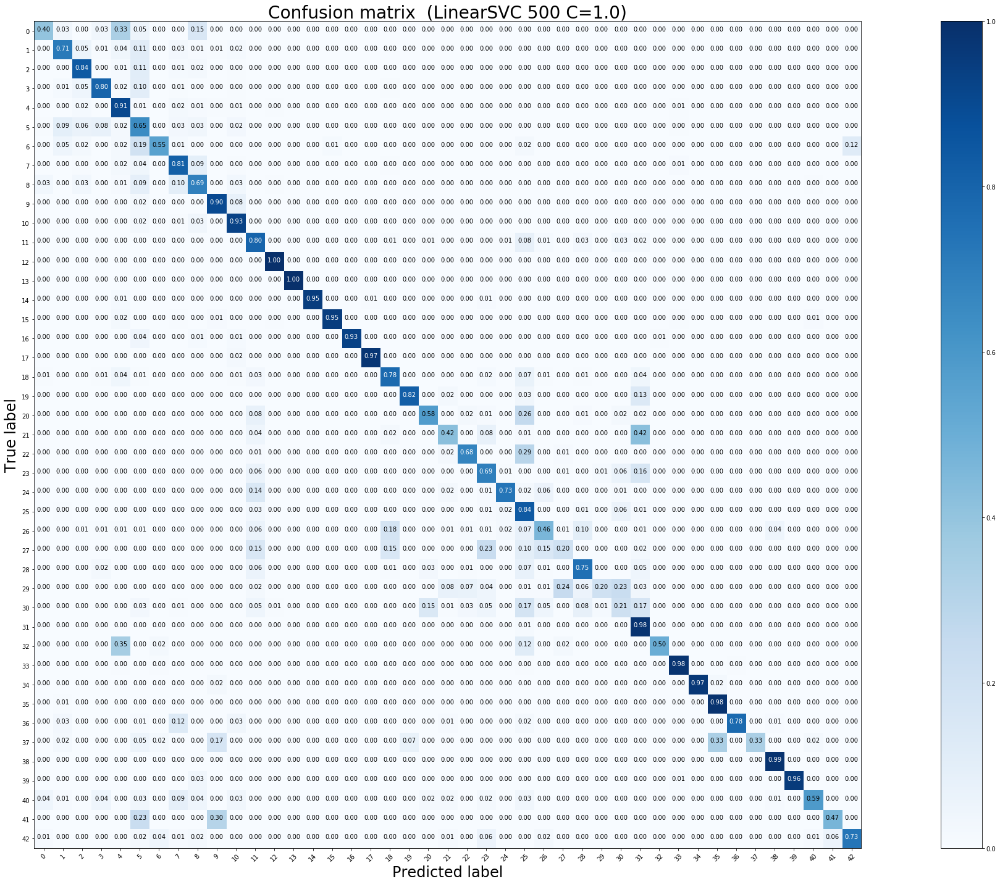

Test accuracy:  0.823673792557403 

              precision    recall  f1-score   support

           0       0.50      0.40      0.44        60
           1       0.86      0.71      0.78       720
           2       0.82      0.84      0.83       750
           3       0.84      0.80      0.82       450
           4       0.81      0.91      0.86       660
           5       0.53      0.65      0.58       630
           6       0.90      0.55      0.69       150
           7       0.72      0.81      0.76       450
           8       0.70      0.69      0.69       450
           9       0.91      0.90      0.90       480
          10       0.85      0.93      0.89       660
          11       0.77      0.80      0.79       420
          12       0.98      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.99      0.95      0.97       270
          15       0.97      0.95      0.96       210
          16       0.97      0.93      0.95  

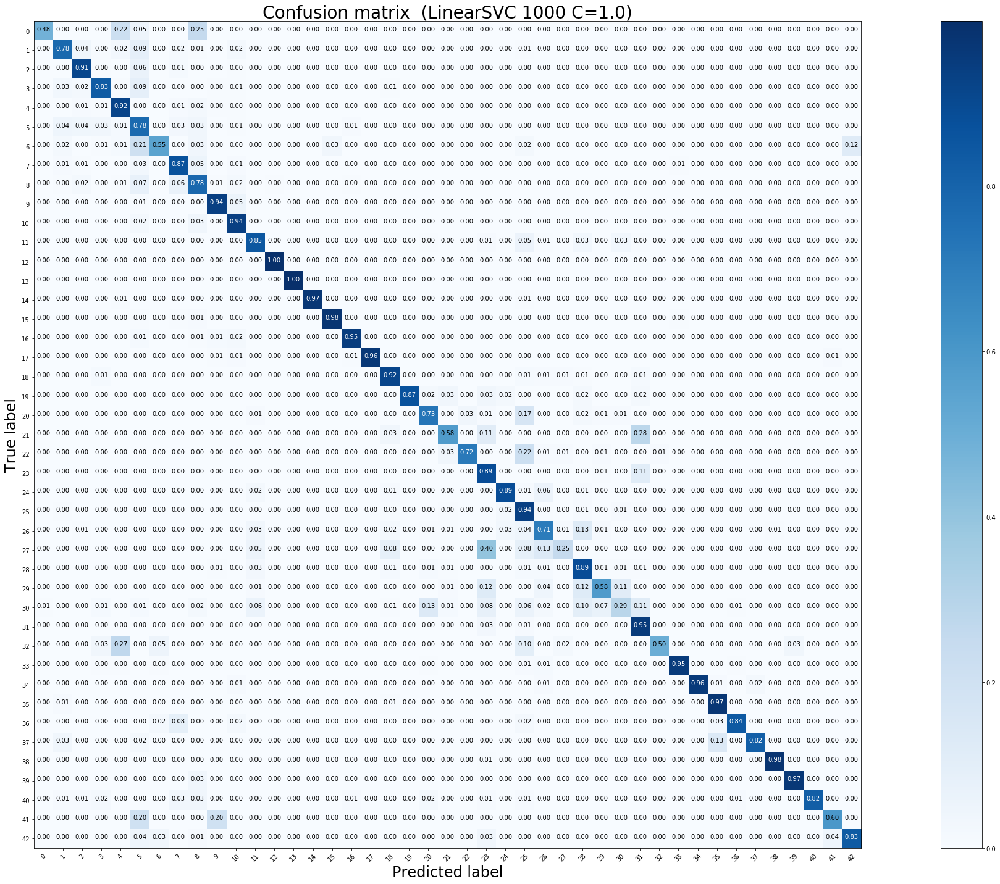

Test accuracy:  0.8771971496437054 

              precision    recall  f1-score   support

           0       0.91      0.48      0.63        60
           1       0.90      0.78      0.83       720
           2       0.89      0.91      0.90       750
           3       0.89      0.83      0.86       450
           4       0.90      0.92      0.91       660
           5       0.64      0.78      0.70       630
           6       0.88      0.55      0.67       150
           7       0.81      0.87      0.84       450
           8       0.75      0.78      0.76       450
           9       0.93      0.94      0.94       480
          10       0.89      0.94      0.91       660
          11       0.92      0.85      0.88       420
          12       0.99      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.99      0.97      0.98       270
          15       0.97      0.98      0.97       210
          16       0.89      0.95      0.92 

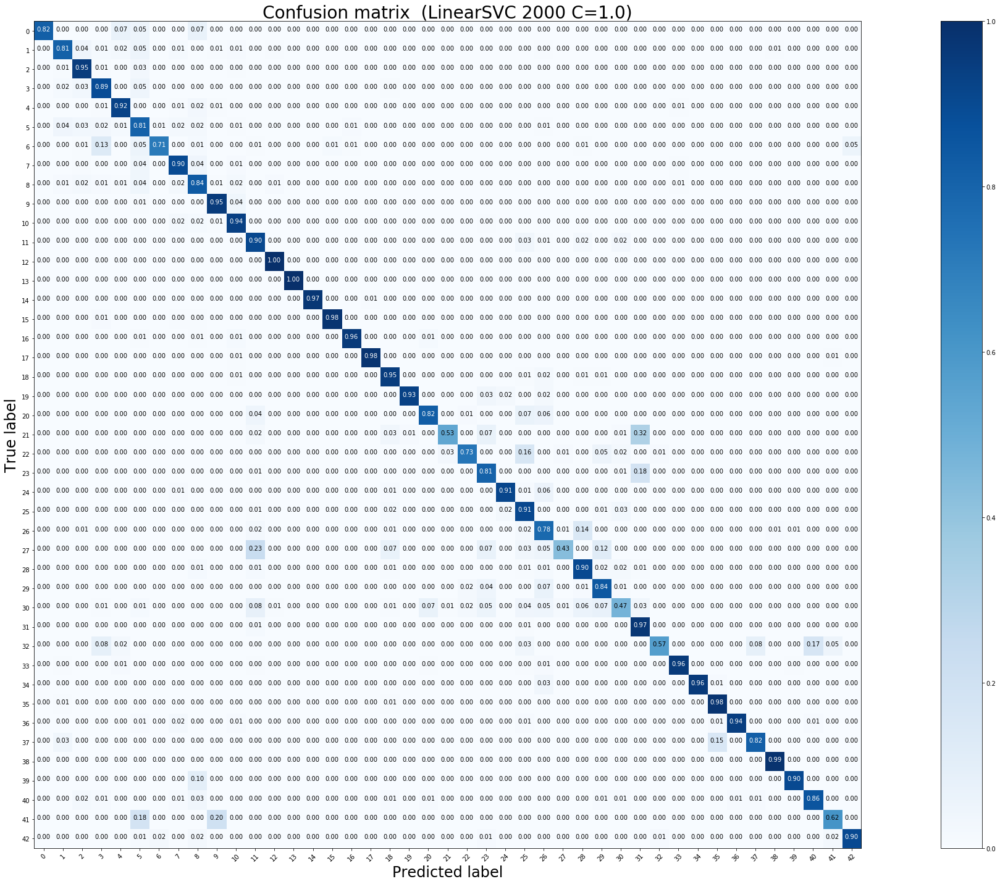

Test accuracy:  0.9037212984956453 

              precision    recall  f1-score   support

           0       0.94      0.82      0.87        60
           1       0.92      0.81      0.86       720
           2       0.90      0.95      0.92       750
           3       0.86      0.89      0.87       450
           4       0.95      0.92      0.93       660
           5       0.78      0.81      0.79       630
           6       0.93      0.71      0.81       150
           7       0.88      0.90      0.89       450
           8       0.81      0.84      0.82       450
           9       0.94      0.95      0.95       480
          10       0.92      0.94      0.93       660
          11       0.88      0.90      0.89       420
          12       0.98      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       1.00      0.97      0.98       270
          15       0.98      0.98      0.98       210
          16       0.92      0.96      0.94 

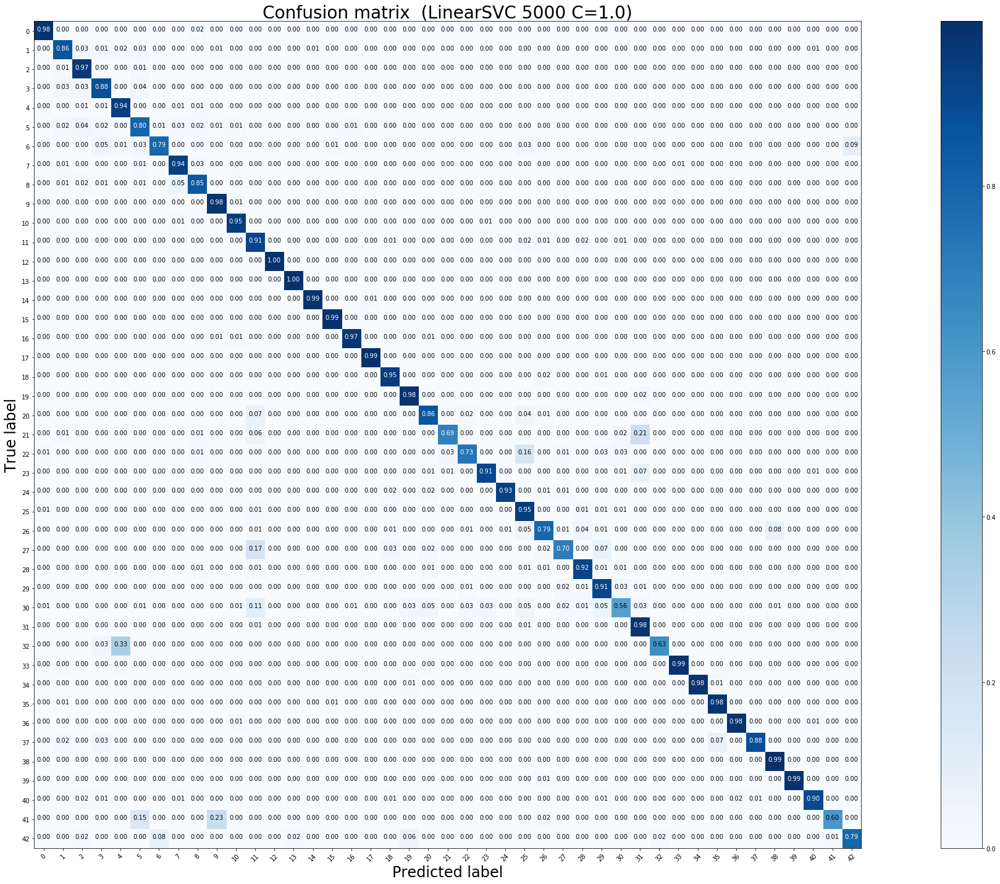

Test accuracy:  0.9247030878859858 

              precision    recall  f1-score   support

           0       0.88      0.98      0.93        60
           1       0.92      0.86      0.89       720
           2       0.90      0.97      0.93       750
           3       0.90      0.88      0.89       450
           4       0.94      0.94      0.94       660
           5       0.88      0.80      0.84       630
           6       0.91      0.79      0.84       150
           7       0.87      0.94      0.90       450
           8       0.89      0.85      0.87       450
           9       0.93      0.98      0.96       480
          10       0.96      0.95      0.95       660
          11       0.87      0.91      0.89       420
          12       0.99      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.97      0.99      0.98       270
          15       0.95      0.99      0.97       210
          16       0.91      0.97      0.94 

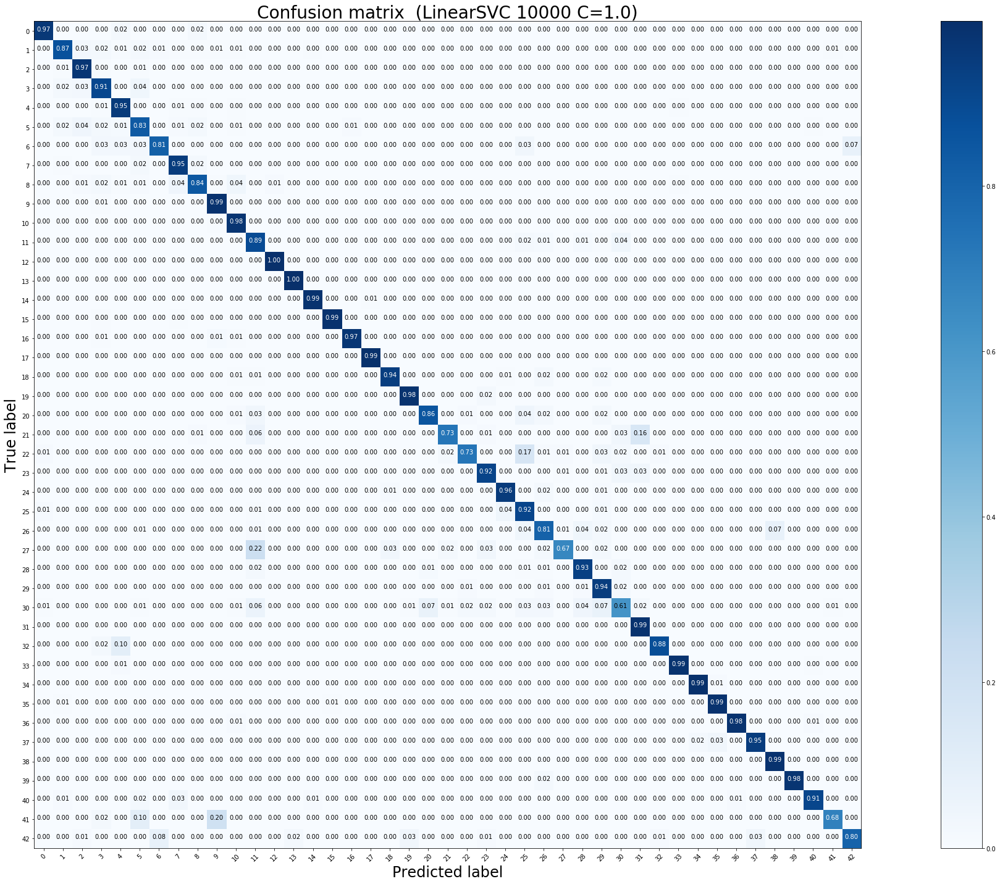

Test accuracy:  0.9324623911322248 

              precision    recall  f1-score   support

           0       0.88      0.97      0.92        60
           1       0.95      0.87      0.91       720
           2       0.91      0.97      0.94       750
           3       0.89      0.91      0.90       450
           4       0.95      0.95      0.95       660
           5       0.89      0.83      0.86       630
           6       0.88      0.81      0.85       150
           7       0.92      0.95      0.93       450
           8       0.92      0.84      0.88       450
           9       0.94      0.99      0.97       480
          10       0.94      0.98      0.96       660
          11       0.90      0.89      0.89       420
          12       0.99      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.97      0.99      0.98       270
          15       0.98      0.99      0.98       210
          16       0.94      0.97      0.96 

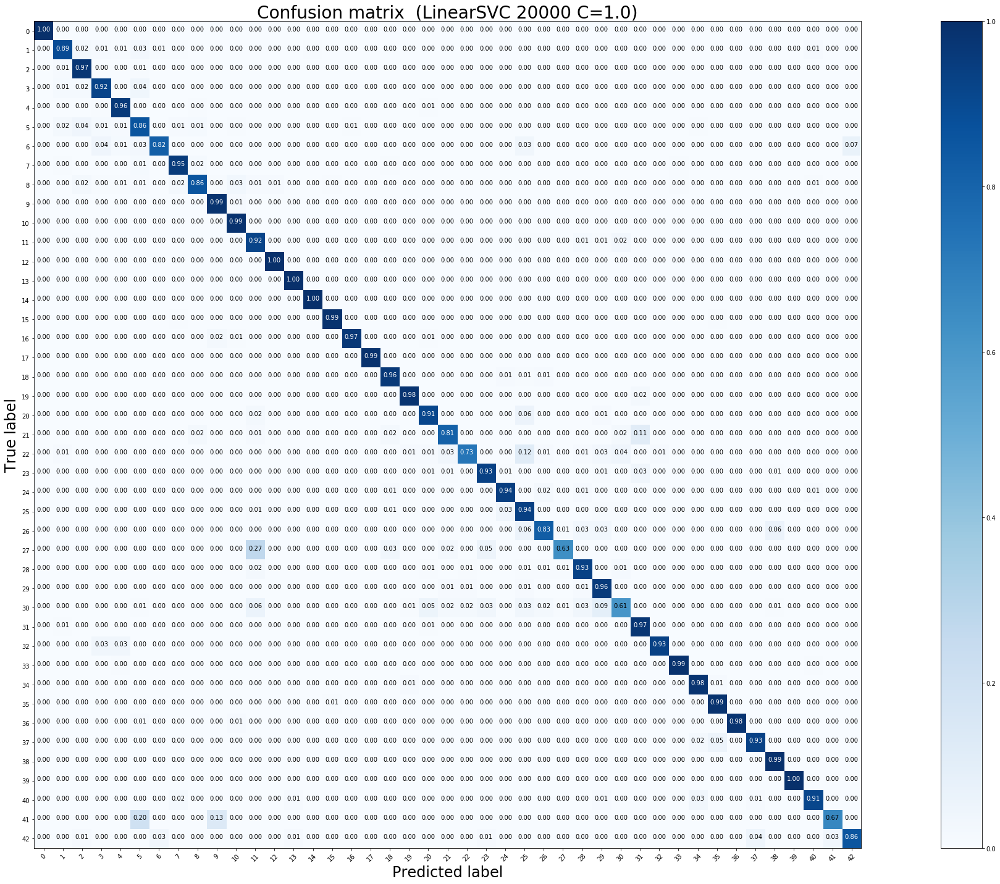

Test accuracy:  0.9420427553444181 

              precision    recall  f1-score   support

           0       0.97      1.00      0.98        60
           1       0.95      0.89      0.92       720
           2       0.93      0.97      0.95       750
           3       0.92      0.92      0.92       450
           4       0.97      0.96      0.96       660
           5       0.89      0.86      0.87       630
           6       0.92      0.82      0.87       150
           7       0.94      0.95      0.95       450
           8       0.95      0.86      0.90       450
           9       0.96      0.99      0.98       480
          10       0.96      0.99      0.97       660
          11       0.90      0.92      0.91       420
          12       0.99      1.00      1.00       690
          13       0.99      1.00      1.00       720
          14       0.98      1.00      0.99       270
          15       0.97      0.99      0.98       210
          16       0.97      0.97      0.97 

In [ ]:
##############################################################################
###########   LinearSVC, HOG, hinge, seed=1, random_A, with_scaler without_std 
###########   Defaultwerte     ###############################################
##############################################################################

train_LinearSVC(X_tr_500, X_test_9_4_2, y_tr_500, y_test, 1, '500',1.0, 1, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski/LinearSVC/Neue Mengen/", "seed_1_random_A_with_scaler_without_std", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_1000, X_test_9_4_2, y_tr_1000, y_test, 1, '1000',1.0, 1, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski/LinearSVC/Neue Mengen/", "seed_1_random_A_with_scaler_without_std", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_2000, X_test_9_4_2, y_tr_2000, y_test, 1, '2000',1.0, 1, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski/LinearSVC/Neue Mengen/", "seed_1_random_A_with_scaler_without_std", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_5000, X_test_9_4_2, y_tr_5000, y_test, 1, '5000',1.0, 1, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski/LinearSVC/Neue Mengen/", "seed_1_random_A_with_scaler_without_std", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_10000, X_test_9_4_2, y_tr_10000, y_test, 1, '10000',1.0, 1, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski/LinearSVC/Neue Mengen/", "seed_1_random_A_with_scaler_without_std", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_20000, X_test_9_4_2, y_tr_20000, y_test, 1, '20000',1.0, 1, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski/LinearSVC/Neue Mengen/", "seed_1_random_A_with_scaler_without_std", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr, X_test_9_4_2, y_tr, y_test, 1, '39209',1.0, 1, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski/LinearSVC/Neue Mengen/", "seed_1_random_A_with_scaler_without_std", "HOG_942_balanced.pkl")

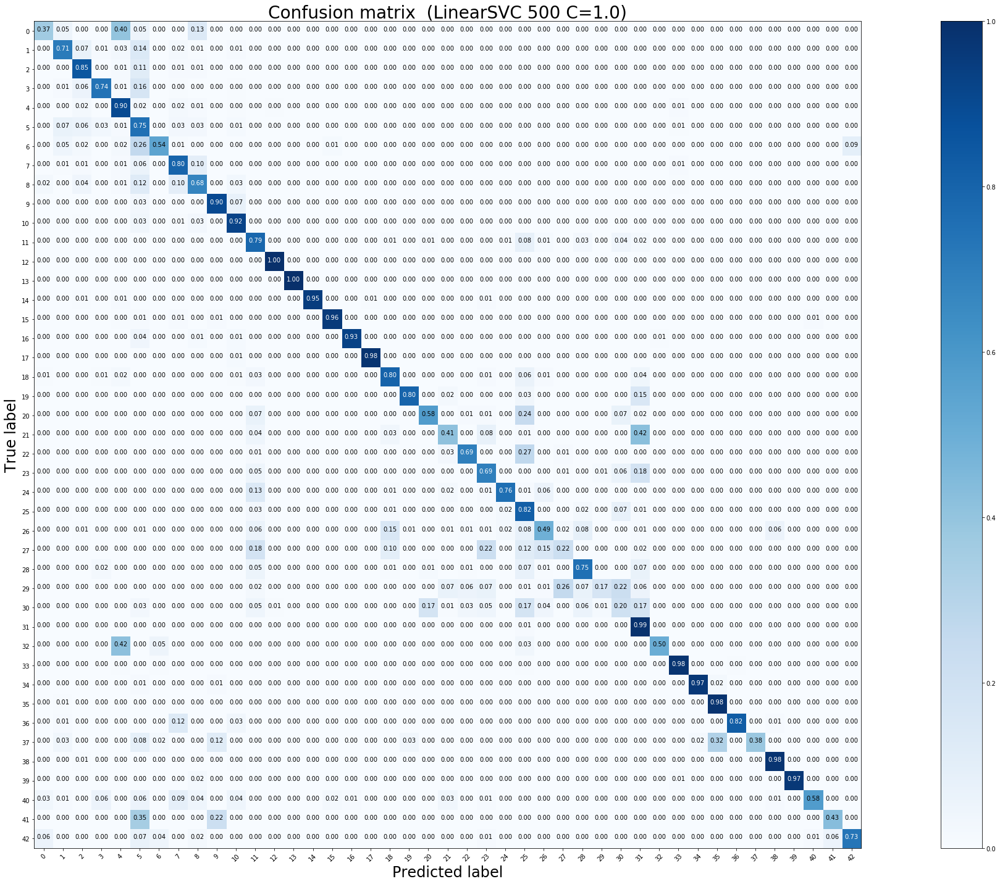

Test accuracy:  0.826049089469517 

              precision    recall  f1-score   support

           0       0.52      0.37      0.43        60
           1       0.87      0.71      0.78       720
           2       0.80      0.85      0.82       750
           3       0.90      0.74      0.81       450
           4       0.84      0.90      0.87       660
           5       0.49      0.75      0.60       630
           6       0.86      0.54      0.66       150
           7       0.74      0.80      0.77       450
           8       0.73      0.68      0.70       450
           9       0.94      0.90      0.92       480
          10       0.87      0.92      0.90       660
          11       0.78      0.79      0.79       420
          12       0.99      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       1.00      0.95      0.97       270
          15       0.96      0.96      0.96       210
          16       0.97      0.93      0.95  

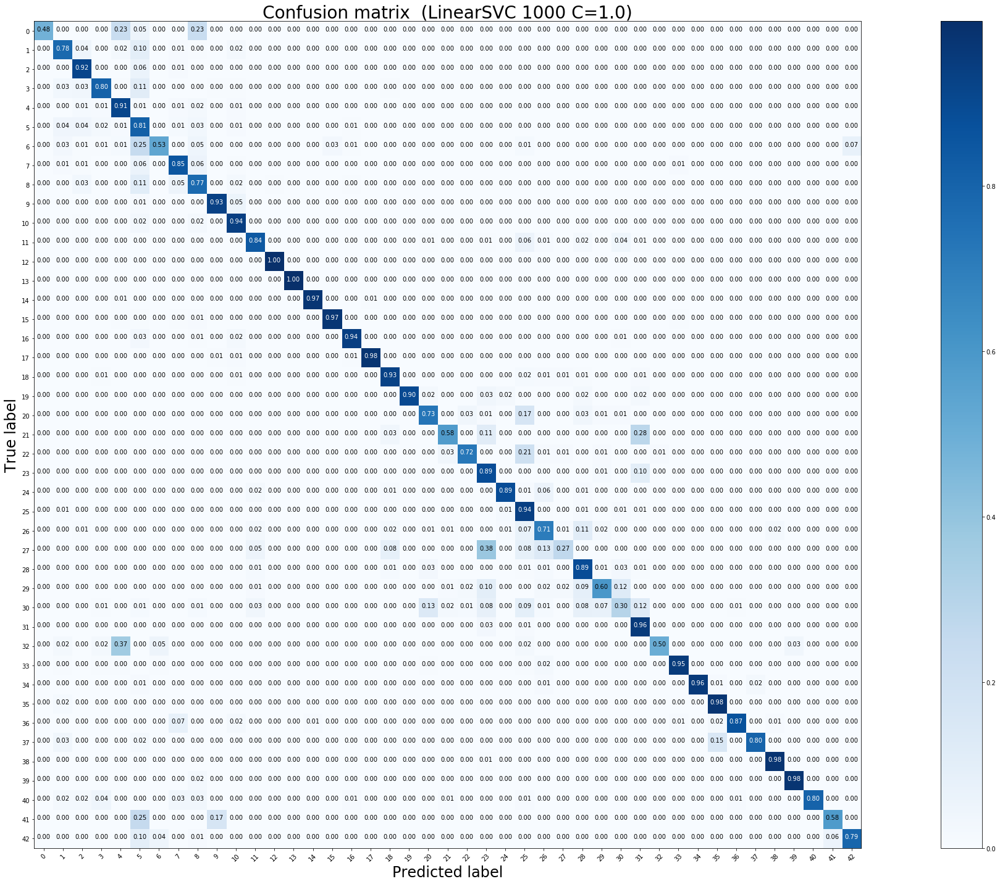

Test accuracy:  0.8776722090261283 

              precision    recall  f1-score   support

           0       0.94      0.48      0.64        60
           1       0.89      0.78      0.83       720
           2       0.86      0.92      0.89       750
           3       0.91      0.80      0.85       450
           4       0.90      0.91      0.90       660
           5       0.59      0.81      0.69       630
           6       0.90      0.53      0.67       150
           7       0.85      0.85      0.85       450
           8       0.76      0.77      0.77       450
           9       0.96      0.93      0.94       480
          10       0.89      0.94      0.91       660
          11       0.94      0.84      0.89       420
          12       0.99      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.99      0.97      0.98       270
          15       0.97      0.97      0.97       210
          16       0.91      0.94      0.92 

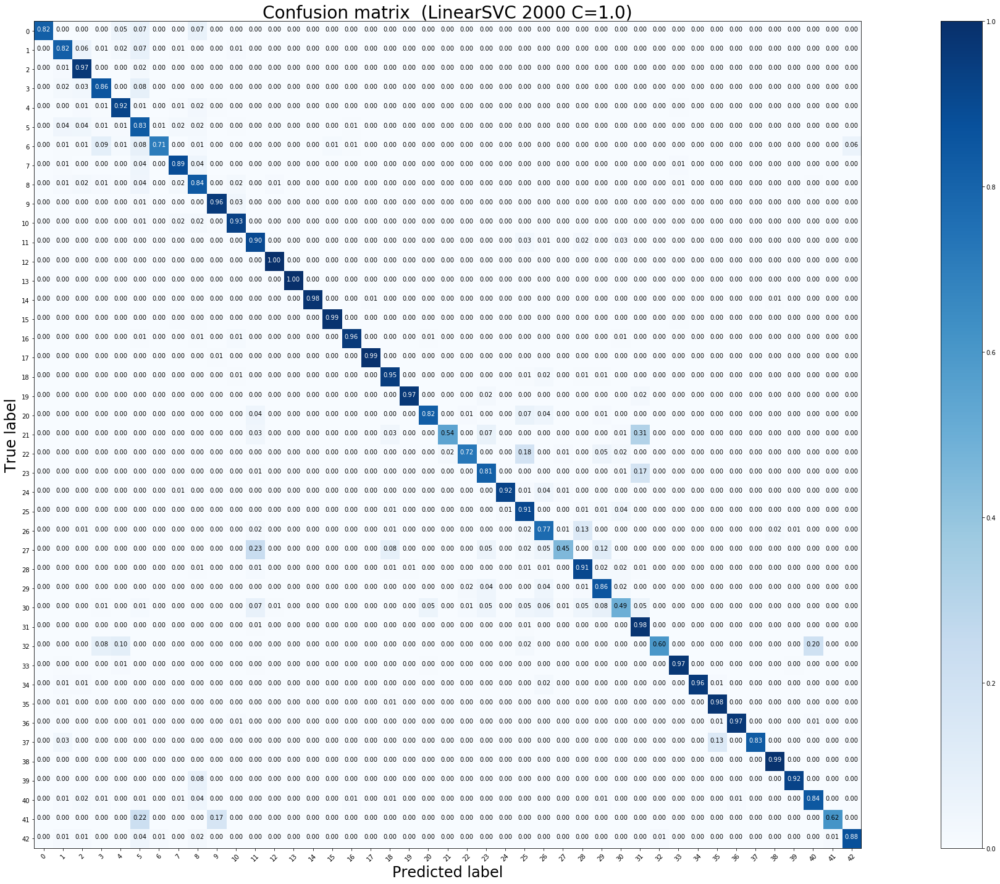

Test accuracy:  0.9068883610451306 

              precision    recall  f1-score   support

           0       0.94      0.82      0.87        60
           1       0.90      0.82      0.86       720
           2       0.88      0.97      0.92       750
           3       0.90      0.86      0.88       450
           4       0.95      0.92      0.94       660
           5       0.73      0.83      0.78       630
           6       0.95      0.71      0.81       150
           7       0.89      0.89      0.89       450
           8       0.82      0.84      0.83       450
           9       0.95      0.96      0.96       480
          10       0.93      0.93      0.93       660
          11       0.89      0.90      0.90       420
          12       0.98      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.99      0.98      0.99       270
          15       0.97      0.99      0.98       210
          16       0.94      0.96      0.95 

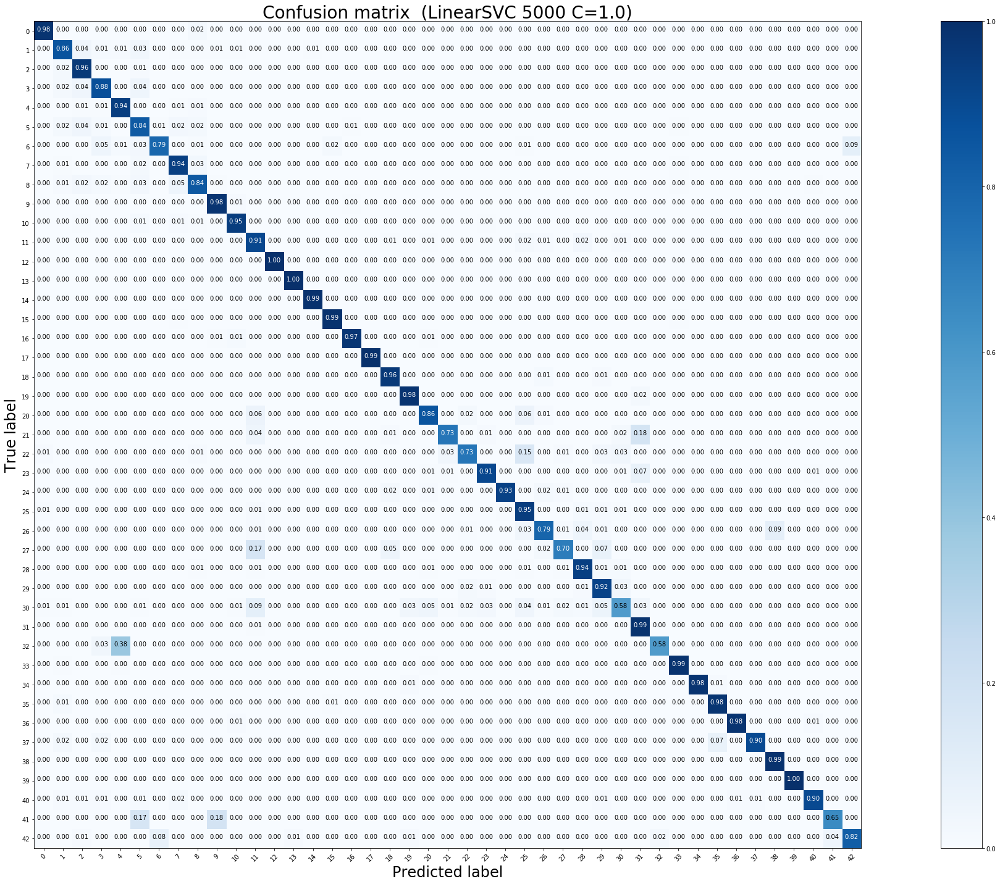

Test accuracy:  0.9275534441805225 

              precision    recall  f1-score   support

           0       0.88      0.98      0.93        60
           1       0.91      0.86      0.89       720
           2       0.88      0.96      0.92       750
           3       0.90      0.88      0.89       450
           4       0.94      0.94      0.94       660
           5       0.84      0.84      0.84       630
           6       0.91      0.79      0.85       150
           7       0.88      0.94      0.91       450
           8       0.90      0.84      0.87       450
           9       0.95      0.98      0.97       480
          10       0.97      0.95      0.96       660
          11       0.89      0.91      0.90       420
          12       0.99      1.00      1.00       690
          13       1.00      1.00      1.00       720
          14       0.98      0.99      0.98       270
          15       0.95      0.99      0.97       210
          16       0.94      0.97      0.96 

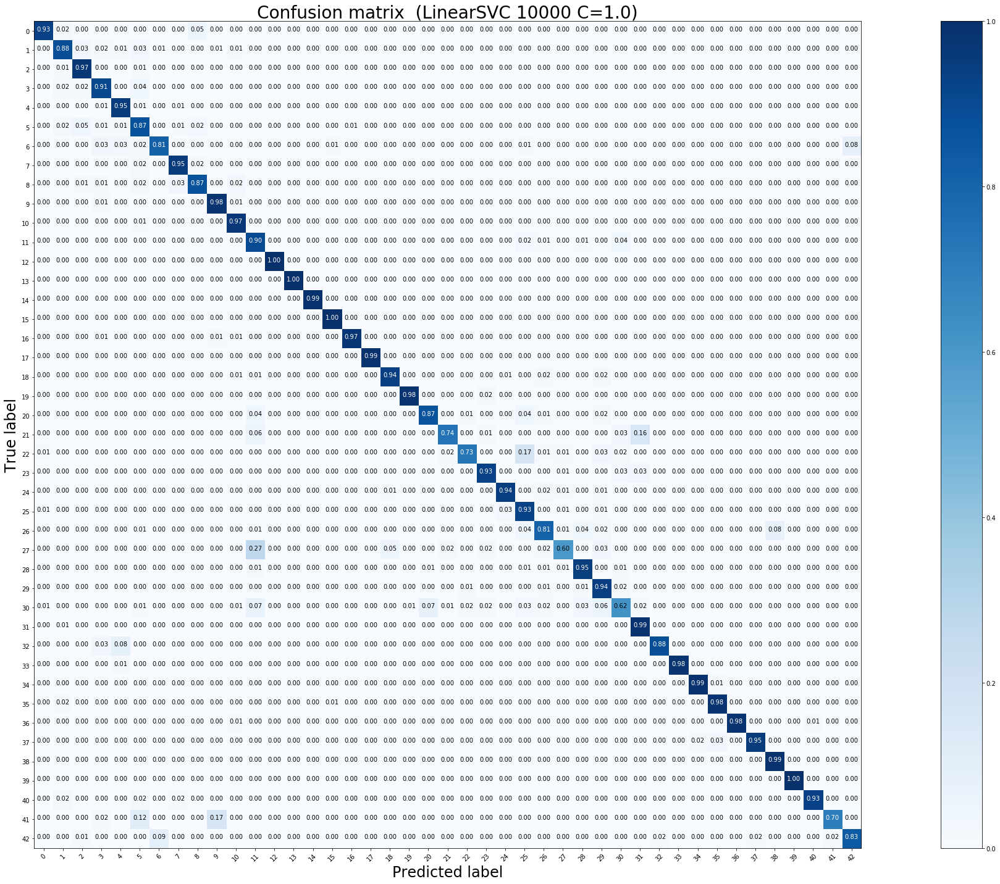

Test accuracy:  0.9357878068091845 

              precision    recall  f1-score   support

           0       0.90      0.93      0.92        60
           1       0.93      0.88      0.91       720
           2       0.91      0.97      0.94       750
           3       0.90      0.91      0.91       450
           4       0.96      0.95      0.96       660
           5       0.85      0.87      0.86       630
           6       0.91      0.81      0.86       150
           7       0.93      0.95      0.94       450
           8       0.92      0.87      0.89       450
           9       0.96      0.98      0.97       480
          10       0.94      0.97      0.96       660
          11       0.90      0.90      0.90       420
          12       0.99      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.99      0.99      0.99       270
          15       0.97      1.00      0.98       210
          16       0.96      0.97      0.97 

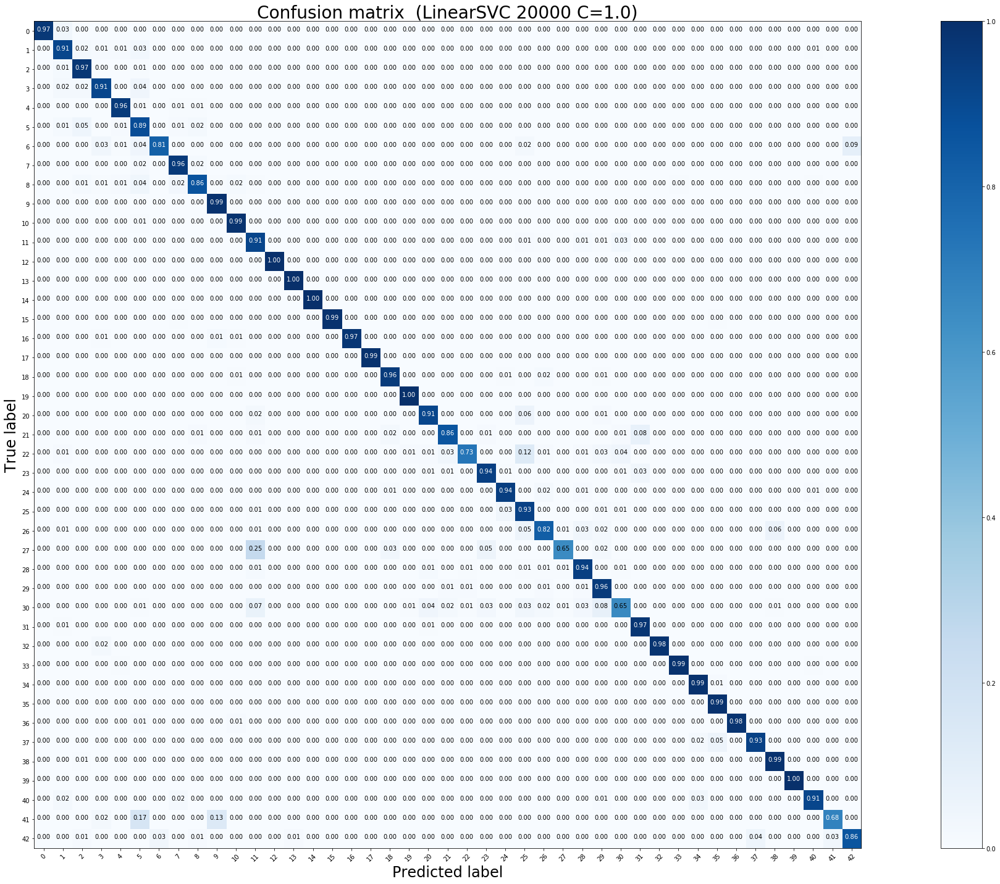

Test accuracy:  0.9448931116389548 

              precision    recall  f1-score   support

           0       0.98      0.97      0.97        60
           1       0.94      0.91      0.93       720
           2       0.92      0.97      0.94       750
           3       0.94      0.91      0.92       450
           4       0.97      0.96      0.96       660
           5       0.85      0.89      0.87       630
           6       0.95      0.81      0.88       150
           7       0.94      0.96      0.95       450
           8       0.94      0.86      0.90       450
           9       0.97      0.99      0.98       480
          10       0.97      0.99      0.98       660
          11       0.91      0.91      0.91       420
          12       1.00      1.00      1.00       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.99      0.99      0.99       210
          16       0.97      0.97      0.97 

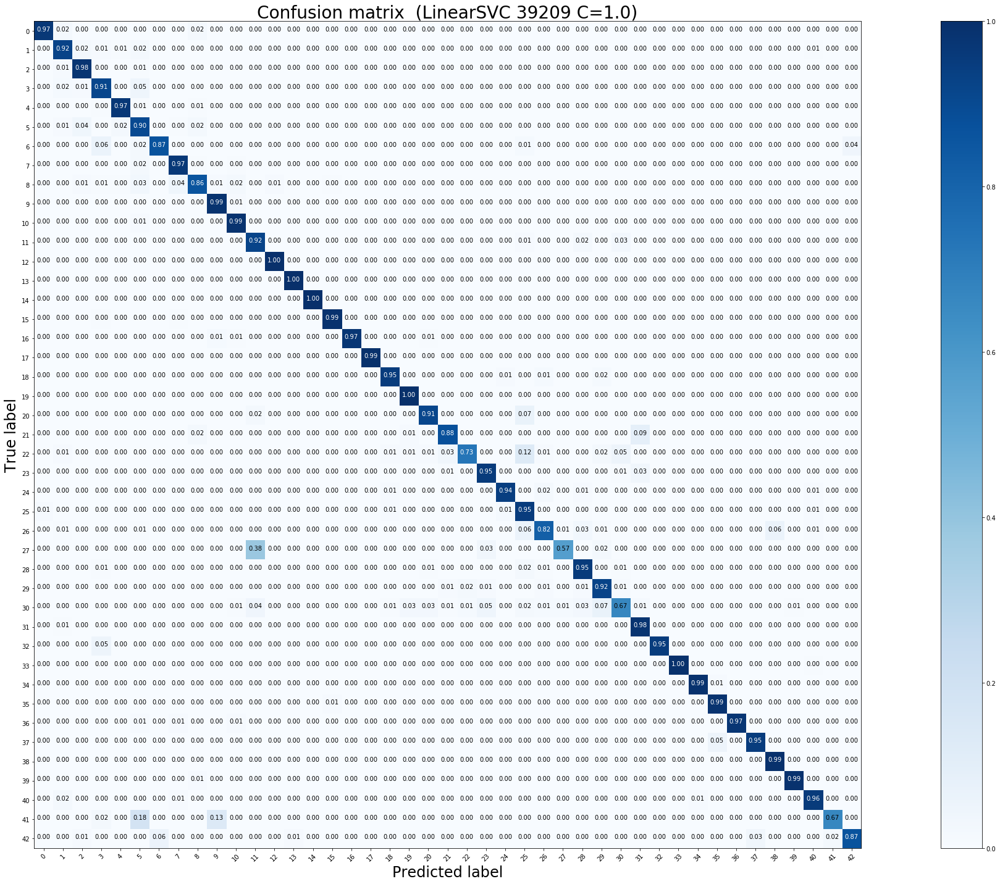

Test accuracy:  0.9486935866983373 

              precision    recall  f1-score   support

           0       0.94      0.97      0.95        60
           1       0.96      0.92      0.94       720
           2       0.94      0.98      0.96       750
           3       0.92      0.91      0.92       450
           4       0.97      0.97      0.97       660
           5       0.86      0.90      0.88       630
           6       0.94      0.87      0.90       150
           7       0.95      0.97      0.96       450
           8       0.95      0.86      0.90       450
           9       0.96      0.99      0.97       480
          10       0.96      0.99      0.98       660
          11       0.92      0.92      0.92       420
          12       0.99      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.99      1.00      0.99       270
          15       0.97      0.99      0.98       210
          16       0.99      0.97      0.98 

In [15]:
########################################################################################
###########   LinearSVC, squared_hinge, HOG, seed=1, random_A, without_scaler ##########
###########   Defaultwerte   ###########################################################
########################################################################################

train_LinearSVC_sq(X_tr_500, X_test_9_4_2, y_tr_500, y_test, 1, '500',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")
train_LinearSVC_sq(X_tr_1000, X_test_9_4_2, y_tr_1000, y_test, 1, '1000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")
train_LinearSVC_sq(X_tr_2000, X_test_9_4_2, y_tr_2000, y_test, 1, '2000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")
train_LinearSVC_sq(X_tr_5000, X_test_9_4_2, y_tr_5000, y_test, 1, '5000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")
train_LinearSVC_sq(X_tr_10000, X_test_9_4_2, y_tr_10000, y_test, 1, '10000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")
train_LinearSVC_sq(X_tr_20000, X_test_9_4_2, y_tr_20000, y_test, 1, '20000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")
train_LinearSVC_sq(X_tr, X_test_9_4_2, y_tr, y_test, 1, '39209',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")

In [25]:
#### GridSearch, ohne StandardScaler, mit l2, squared_hinge
# 1. DL
print('********************************************************************************')
print(' GridSearch 500 1. DL: ')
clf_500_lin, time_500_lin = tuning_hyper_params(X_tr_500, y_tr_500, X_test_9_4_2, y_test, 'LinearSVC', 10, 0, 0, 
                                                np.logspace(-16,10,14, base=2), np.logspace(-16,4,11, base=2), 'l2', 'squared_hinge', 1)
save_trained_model_as_pkl(clf_500_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/500/seed_1_random_A_without_scaler_l2_sq_hinge/GridSearch_1DL.pkl")
save_as_csv(time_500_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/500/seed_1_random_A_without_scaler_l2_sq_hinge/", 'Suchzeiten_GridSearch_1_DL.csv')
print('********************************************************************************')
print(' GridSearch 1000 1. DL: ')
clf_1000_lin, time_1000_lin = tuning_hyper_params(X_tr_1000, y_tr_1000, X_test_9_4_2, y_test, 'LinearSVC', 10, 0, 0, 
                                                np.logspace(-16,10,14, base=2), np.logspace(-16,4,11, base=2),'l2', 'squared_hinge', 1)
save_trained_model_as_pkl(clf_1000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/1000/seed_1_random_A_without_scaler_l2_sq_hinge/GridSearch_1DL.pkl")
save_as_csv(time_1000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/1000/seed_1_random_A_without_scaler_l2_sq_hinge/", 'Suchzeiten_GridSearch_1_DL.csv')
print('********************************************************************************')
print(' GridSearch 2000 1. DL: ')
clf_2000_lin, time_2000_lin = tuning_hyper_params(X_tr_2000, y_tr_2000, X_test_9_4_2, y_test, 'LinearSVC', 10, 0, 0, 
                                                np.logspace(-16,10,14, base=2), np.logspace(-16,4,11, base=2),'l2', 'squared_hinge', 1)
save_trained_model_as_pkl(clf_2000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/2000/seed_1_random_A_without_scaler_l2_sq_hinge/GridSearch_1DL.pkl")
save_as_csv(time_2000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/2000/seed_1_random_A_without_scaler_l2_sq_hinge/", 'Suchzeiten_GridSearch_1_DL.csv')
print('********************************************************************************')
print(' GridSearch 5000 1. DL: ')
clf_5000_lin, time_5000_lin = tuning_hyper_params(X_tr_5000, y_tr_5000, X_test_9_4_2, y_test, 'LinearSVC', 10, 0, 0, 
                                                np.logspace(-16,10,14, base=2), np.logspace(-16,4,11, base=2),'l2', 'squared_hinge', 1)
save_trained_model_as_pkl(clf_5000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/5000/seed_1_random_A_without_scaler_l2_sq_hinge/GridSearch_1DL.pkl")
save_as_csv(time_5000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/5000/seed_1_random_A_without_scaler_l2_sq_hinge/", 'Suchzeiten_GridSearch_1_DL.csv')

********************************************************************************
 GridSearch 500 1. DL: 


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 2 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)



 C_range: [1.526e-05 6.104e-05 2.441e-04 9.766e-04 3.906e-03 1.562e-02 6.250e-02
 2.500e-01 1.000e+00 4.000e+00 1.600e+01 6.400e+01 2.560e+02 1.024e+03]

 Bester Score:  0.7494840565007268

 Besten Parameter:  {'svm__C': 0.25}
Bester Estimator score:  0.8230403800475059
Precision-Score: 0.280979 (0.112707) mit Parameter: {'svm__C': 1.52587890625e-05}
Precision-Score: 0.300159 (0.103727) mit Parameter: {'svm__C': 6.103515625e-05}
Precision-Score: 0.406955 (0.110456) mit Parameter: {'svm__C': 0.000244140625}
Precision-Score: 0.544326 (0.071063) mit Parameter: {'svm__C': 0.0009765625}
Precision-Score: 0.627380 (0.099581) mit Parameter: {'svm__C': 0.00390625}
Precision-Score: 0.701431 (0.105090) mit Parameter: {'svm__C': 0.015625}
Precision-Score: 0.735129 (0.114211) mit Parameter: {'svm__C': 0.0625}
Precision-Score: 0.745841 (0.117684) mit Parameter: {'svm__C': 0.25}
Precision-Score: 0.750765 (0.121246) mit Parameter: {'svm__C': 1.0}
Precision-Score: 0.737986 (0.116567) mit Parameter: {'

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 5 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)



 C_range: [1.526e-05 6.104e-05 2.441e-04 9.766e-04 3.906e-03 1.562e-02 6.250e-02
 2.500e-01 1.000e+00 4.000e+00 1.600e+01 6.400e+01 2.560e+02 1.024e+03]

 Bester Score:  0.8697364360182412

 Besten Parameter:  {'svm__C': 4.0}
Bester Estimator score:  0.8731591448931116
Precision-Score: 0.217927 (0.044635) mit Parameter: {'svm__C': 1.52587890625e-05}
Precision-Score: 0.279897 (0.042090) mit Parameter: {'svm__C': 6.103515625e-05}
Precision-Score: 0.523364 (0.051512) mit Parameter: {'svm__C': 0.000244140625}
Precision-Score: 0.666576 (0.050908) mit Parameter: {'svm__C': 0.0009765625}
Precision-Score: 0.754727 (0.047374) mit Parameter: {'svm__C': 0.00390625}
Precision-Score: 0.812211 (0.041046) mit Parameter: {'svm__C': 0.015625}
Precision-Score: 0.855089 (0.037419) mit Parameter: {'svm__C': 0.0625}
Precision-Score: 0.866897 (0.028493) mit Parameter: {'svm__C': 0.25}
Precision-Score: 0.867166 (0.026290) mit Parameter: {'svm__C': 1.0}
Precision-Score: 0.873346 (0.042047) mit Parameter: {'s


 C_range: [1.526e-05 6.104e-05 2.441e-04 9.766e-04 3.906e-03 1.562e-02 6.250e-02
 2.500e-01 1.000e+00 4.000e+00 1.600e+01 6.400e+01 2.560e+02 1.024e+03]

 Bester Score:  0.9674410072194561

 Besten Parameter:  {'svm__C': 1.0}
Bester Estimator score:  0.9275534441805225
Precision-Score: 0.343256 (0.021458) mit Parameter: {'svm__C': 1.52587890625e-05}
Precision-Score: 0.648899 (0.020849) mit Parameter: {'svm__C': 6.103515625e-05}
Precision-Score: 0.828098 (0.025965) mit Parameter: {'svm__C': 0.000244140625}
Precision-Score: 0.856048 (0.017627) mit Parameter: {'svm__C': 0.0009765625}
Precision-Score: 0.897971 (0.016414) mit Parameter: {'svm__C': 0.00390625}
Precision-Score: 0.940395 (0.012055) mit Parameter: {'svm__C': 0.015625}
Precision-Score: 0.960218 (0.010777) mit Parameter: {'svm__C': 0.0625}
Precision-Score: 0.966818 (0.009942) mit Parameter: {'svm__C': 0.25}
Precision-Score: 0.972203 (0.007647) mit Parameter: {'svm__C': 1.0}
Precision-Score: 0.972935 (0.006274) mit Parameter: {'s

In [26]:
# 2. DL
print('********************************************************************************')
print(' GridSearch 500 2. DL: ')
clf_500_lin, time_500_lin = tuning_hyper_params(X_tr_500, y_tr_500, X_test_9_4_2, y_test, 'LinearSVC', 10, 0, 0, 
                                                get_finer_range(0.25), np.logspace(-16,4,11, base=2), 'l2', 'squared_hinge', 1)
save_trained_model_as_pkl(clf_500_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/500/seed_1_random_A_without_scaler_l2_sq_hinge/GridSearch_2DL.pkl")
save_as_csv(time_500_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/500/seed_1_random_A_without_scaler_l2_sq_hinge/", 'Suchzeiten_GridSearch_2_DL.csv')
print('********************************************************************************')
print(' GridSearch 1000 2. DL: ')
clf_1000_lin, time_1000_lin = tuning_hyper_params(X_tr_1000, y_tr_1000, X_test_9_4_2, y_test, 'LinearSVC', 10, 0, 0, 
                                                get_finer_range(4.0), np.logspace(-16,4,11, base=2),'l2', 'squared_hinge', 1)
save_trained_model_as_pkl(clf_1000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/1000/seed_1_random_A_without_scaler_l2_sq_hinge/GridSearch_2DL.pkl")
save_as_csv(time_1000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/1000/seed_1_random_A_without_scaler_l2_sq_hinge/", 'Suchzeiten_GridSearch_2_DL.csv')
print('********************************************************************************')
print(' GridSearch 2000 2. DL: ')
clf_2000_lin, time_2000_lin = tuning_hyper_params(X_tr_2000, y_tr_2000, X_test_9_4_2, y_test, 'LinearSVC', 10, 0, 0, 
                                                get_finer_range(1.0), np.logspace(-16,4,11, base=2),'l2', 'squared_hinge', 1)
save_trained_model_as_pkl(clf_2000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/2000/seed_1_random_A_without_scaler_l2_sq_hinge/GridSearch_2DL.pkl")
save_as_csv(time_2000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/2000/seed_1_random_A_without_scaler_l2_sq_hinge/", 'Suchzeiten_GridSearch_2_DL.csv')
print('********************************************************************************')
print(' GridSearch 5000 2. DL: ')
clf_5000_lin, time_5000_lin = tuning_hyper_params(X_tr_5000, y_tr_5000, X_test_9_4_2, y_test, 'LinearSVC', 10, 0, 0, 
                                                get_finer_range(1.0), np.logspace(-16,4,11, base=2),'l2', 'squared_hinge', 1)
save_trained_model_as_pkl(clf_5000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/5000/seed_1_random_A_without_scaler_l2_sq_hinge/GridSearch_2DL.pkl")
save_as_csv(time_5000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/5000/seed_1_random_A_without_scaler_l2_sq_hinge/", 'Suchzeiten_GridSearch_2_DL.csv')

********************************************************************************
 GridSearch 500 2. DL: 


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 2 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)



 C_range: [0.062 0.074 0.088 0.105 0.125 0.149 0.177 0.21  0.25  0.297 0.354 0.42
 0.5   0.595 0.707 0.841 1.   ]

 Bester Score:  0.7518765697084493

 Besten Parameter:  {'svm__C': 0.3535533905932738}
Bester Estimator score:  0.8246239113222487
Precision-Score: 0.735129 (0.114211) mit Parameter: {'svm__C': 0.0625}
Precision-Score: 0.739661 (0.125133) mit Parameter: {'svm__C': 0.07432544468767006}
Precision-Score: 0.745914 (0.126183) mit Parameter: {'svm__C': 0.08838834764831845}
Precision-Score: 0.750405 (0.121453) mit Parameter: {'svm__C': 0.10511205190671431}
Precision-Score: 0.744227 (0.113226) mit Parameter: {'svm__C': 0.125}
Precision-Score: 0.747355 (0.117120) mit Parameter: {'svm__C': 0.14865088937534013}
Precision-Score: 0.748223 (0.117653) mit Parameter: {'svm__C': 0.1767766952966369}
Precision-Score: 0.743733 (0.118594) mit Parameter: {'svm__C': 0.21022410381342863}
Precision-Score: 0.745841 (0.117684) mit Parameter: {'svm__C': 0.25}
Precision-Score: 0.742075 (0.123957) mit

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 5 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)



 C_range: [ 1.     1.189  1.414  1.682  2.     2.378  2.828  3.364  4.     4.757
  5.657  6.727  8.     9.514 11.314 13.454 16.   ]

 Bester Score:  0.8736930611760292

 Besten Parameter:  {'svm__C': 2.8284271247461903}
Bester Estimator score:  0.8741092636579573
Precision-Score: 0.867166 (0.026290) mit Parameter: {'svm__C': 1.0}
Precision-Score: 0.868633 (0.024546) mit Parameter: {'svm__C': 1.189207115002721}
Precision-Score: 0.870690 (0.027135) mit Parameter: {'svm__C': 1.4142135623730951}
Precision-Score: 0.873312 (0.025786) mit Parameter: {'svm__C': 1.681792830507429}
Precision-Score: 0.872940 (0.026275) mit Parameter: {'svm__C': 2.0}
Precision-Score: 0.871289 (0.027293) mit Parameter: {'svm__C': 2.378414230005442}
Precision-Score: 0.877450 (0.038487) mit Parameter: {'svm__C': 2.8284271247461903}
Precision-Score: 0.877089 (0.038384) mit Parameter: {'svm__C': 3.363585661014858}
Precision-Score: 0.873346 (0.042047) mit Parameter: {'svm__C': 4.0}
Precision-Score: 0.874984 (0.041982) 


 C_range: [0.25  0.297 0.354 0.42  0.5   0.595 0.707 0.841 1.    1.189 1.414 1.682
 2.    2.378 2.828 3.364 4.   ]

 Bester Score:  0.9675871147118703

 Besten Parameter:  {'svm__C': 1.4142135623730951}
Bester Estimator score:  0.9265241488519398
Precision-Score: 0.966818 (0.009942) mit Parameter: {'svm__C': 0.25}
Precision-Score: 0.968687 (0.009274) mit Parameter: {'svm__C': 0.29730177875068026}
Precision-Score: 0.968756 (0.009128) mit Parameter: {'svm__C': 0.3535533905932738}
Precision-Score: 0.969157 (0.009067) mit Parameter: {'svm__C': 0.42044820762685725}
Precision-Score: 0.969598 (0.008257) mit Parameter: {'svm__C': 0.5}
Precision-Score: 0.969942 (0.008301) mit Parameter: {'svm__C': 0.5946035575013605}
Precision-Score: 0.970842 (0.008332) mit Parameter: {'svm__C': 0.7071067811865476}
Precision-Score: 0.971002 (0.007695) mit Parameter: {'svm__C': 0.8408964152537145}
Precision-Score: 0.972203 (0.007647) mit Parameter: {'svm__C': 1.0}
Precision-Score: 0.972626 (0.007204) mit Parame

In [32]:
print('********************************************************************************')
print(' GridSearch 10000 1. DL: ')
print('')
clf_10000_lin, time_10000_lin = tuning_hyper_params(X_tr_10000, y_tr_10000, X_test_9_4_2, y_test, 'LinearSVC', 5, 0, 0, 
                                                np.logspace(-16,6,12, base=2), np.logspace(-16,4,11, base=2),'l2', 'squared_hinge',1)
save_trained_model_as_pkl(clf_10000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/10000/seed_1_random_A_without_scaler_l2_sq_hinge/GridSearch_1DL.pkl")
save_as_csv(time_10000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/10000/seed_1_random_A_without_scaler_l2_sq_hinge/", 'Suchzeiten_GridSearch_1_DL.csv')

print('********************************************************************************')
print(' GridSearch 20000 1. DL: ')
print('')
clf_20000_lin, time_20000_lin = tuning_hyper_params(X_tr_20000, y_tr_20000, X_test_9_4_2, y_test, 'LinearSVC', 3, 0, 0, 
                                                np.logspace(-16,6,12, base=2), np.logspace(-16,4,11, base=2),'l2', 'squared_hinge',1)
save_trained_model_as_pkl(clf_20000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/20000/seed_1_random_A_without_scaler_l2_sq_hinge/GridSearch_1DL.pkl")
save_as_csv(time_20000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/20000/seed_1_random_A_without_scaler_l2_sq_hinge/", 'Suchzeiten_GridSearch_1_DL.csv')

print('********************************************************************************')
print(' GridSearch 39209 1. DL: ')
print('')
clf_39209_lin, time_39209_lin = tuning_hyper_params(X_train_9_4_2, y_train, X_test_9_4_2, y_test, 'LinearSVC', 3, 0, 0, 
                                                np.logspace(-16,6,12, base=2), np.logspace(-16,4,11, base=2),'l2', 'squared_hinge',1)
save_trained_model_as_pkl(clf_39209_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/39209/seed_1_random_A_without_scaler_l2_sq_hinge/GridSearch_1DL.pkl")
save_as_csv(time_39209_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/39209/seed_1_random_A_without_scaler_l2_sq_hinge/", 'Suchzeiten_GridSearch_1_DL.csv')

********************************************************************************
 GridSearch 10000 1. DL: 


 C_range: [1.526e-05 6.104e-05 2.441e-04 9.766e-04 3.906e-03 1.562e-02 6.250e-02
 2.500e-01 1.000e+00 4.000e+00 1.600e+01 6.400e+01]

 Bester Score:  0.9744664663986256

 Besten Parameter:  {'svm__C': 1.0}
Bester Estimator score:  0.9357878068091845
Precision-Score: 0.516634 (0.014590) mit Parameter: {'svm__C': 1.52587890625e-05}
Precision-Score: 0.818942 (0.018425) mit Parameter: {'svm__C': 6.103515625e-05}
Precision-Score: 0.839668 (0.017863) mit Parameter: {'svm__C': 0.000244140625}
Precision-Score: 0.868142 (0.015169) mit Parameter: {'svm__C': 0.0009765625}
Precision-Score: 0.915085 (0.010622) mit Parameter: {'svm__C': 0.00390625}
Precision-Score: 0.948575 (0.005878) mit Parameter: {'svm__C': 0.015625}
Precision-Score: 0.965982 (0.004646) mit Parameter: {'svm__C': 0.0625}
Precision-Score: 0.974263 (0.003546) mit Parameter: {'svm__C': 0.25}
Precision-Score: 0.976744 (0.004313

********************************************************************************
 GridSearch 39209 1. DL: 


 C_range: [1.526e-05 6.104e-05 2.441e-04 9.766e-04 3.906e-03 1.562e-02 6.250e-02
 2.500e-01 1.000e+00 4.000e+00 1.600e+01 6.400e+01]

 Bester Score:  0.9475141266700773

 Besten Parameter:  {'svm__C': 0.25}
Bester Estimator score:  0.95027711797308
Precision-Score: 0.713555 (0.007405) mit Parameter: {'svm__C': 1.52587890625e-05}
Precision-Score: 0.790654 (0.005857) mit Parameter: {'svm__C': 6.103515625e-05}
Precision-Score: 0.820174 (0.008150) mit Parameter: {'svm__C': 0.000244140625}
Precision-Score: 0.873612 (0.002751) mit Parameter: {'svm__C': 0.0009765625}
Precision-Score: 0.916048 (0.002809) mit Parameter: {'svm__C': 0.00390625}
Precision-Score: 0.936281 (0.002685) mit Parameter: {'svm__C': 0.015625}
Precision-Score: 0.947899 (0.002262) mit Parameter: {'svm__C': 0.0625}
Precision-Score: 0.952067 (0.003026) mit Parameter: {'svm__C': 0.25}
Precision-Score: 0.951353 (0.002932)

In [34]:
print('********************************************************************************')
print(' GridSearch 10000 2. DL: ')
print('')
clf_10000_lin, time_10000_lin = tuning_hyper_params(X_tr_10000, y_tr_10000, X_test_9_4_2, y_test, 'LinearSVC', 5, 0, 0, 
                                                get_finer_range(1.0), np.logspace(-16,4,11, base=2),'l2', 'squared_hinge',1)
save_trained_model_as_pkl(clf_10000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/10000/seed_1_random_A_without_scaler_l2_sq_hinge/GridSearch_2DL.pkl")
save_as_csv(time_10000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/10000/seed_1_random_A_without_scaler_l2_sq_hinge/", 'Suchzeiten_GridSearch_2_DL.csv')

print('********************************************************************************')
print(' GridSearch 20000 2. DL: ')
print('')
clf_20000_lin, time_20000_lin = tuning_hyper_params(X_tr_20000, y_tr_20000, X_test_9_4_2, y_test, 'LinearSVC', 3, 0, 0, 
                                                get_finer_range(1.0), np.logspace(-16,4,11, base=2),'l2', 'squared_hinge',1)
save_trained_model_as_pkl(clf_20000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/20000/seed_1_random_A_without_scaler_l2_sq_hinge/GridSearch_2DL.pkl")
save_as_csv(time_20000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/20000/seed_1_random_A_without_scaler_l2_sq_hinge/", 'Suchzeiten_GridSearch_2_DL.csv')

print('********************************************************************************')
print(' GridSearch 39209 2. DL: ')
print('')
clf_39209_lin, time_39209_lin = tuning_hyper_params(X_train_9_4_2, y_train, X_test_9_4_2, y_test, 'LinearSVC', 3, 0, 0, 
                                                get_finer_range(0.25), np.logspace(-16,4,11, base=2),'l2', 'squared_hinge',1)
save_trained_model_as_pkl(clf_39209_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/39209/seed_1_random_A_without_scaler_l2_sq_hinge/GridSearch_2DL.pkl")
save_as_csv(time_39209_lin, "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/39209/seed_1_random_A_without_scaler_l2_sq_hinge/", 'Suchzeiten_GridSearch_2_DL.csv')

********************************************************************************
 GridSearch 10000 2. DL: 


 C_range: [0.25  0.297 0.354 0.42  0.5   0.595 0.707 0.841 1.    1.189 1.414 1.682
 2.    2.378 2.828 3.364 4.   ]

 Bester Score:  0.9745887124262588

 Besten Parameter:  {'svm__C': 0.8408964152537145}
Bester Estimator score:  0.9365003958828186
Precision-Score: 0.974263 (0.003546) mit Parameter: {'svm__C': 0.25}
Precision-Score: 0.975211 (0.003578) mit Parameter: {'svm__C': 0.29730177875068026}
Precision-Score: 0.975389 (0.003420) mit Parameter: {'svm__C': 0.3535533905932738}
Precision-Score: 0.975479 (0.003216) mit Parameter: {'svm__C': 0.42044820762685725}
Precision-Score: 0.976003 (0.003180) mit Parameter: {'svm__C': 0.5}
Precision-Score: 0.976099 (0.003097) mit Parameter: {'svm__C': 0.5946035575013605}
Precision-Score: 0.976240 (0.003921) mit Parameter: {'svm__C': 0.7071067811865476}
Precision-Score: 0.976636 (0.003639) mit Parameter: {'svm__C': 0.8408964152537145}
Precisi

********************************************************************************
 GridSearch 39209 2. DL: 


 C_range: [0.062 0.074 0.088 0.105 0.125 0.149 0.177 0.21  0.25  0.297 0.354 0.42
 0.5   0.595 0.707 0.841 1.   ]

 Bester Score:  0.9475900319795445

 Besten Parameter:  {'svm__C': 0.1767766952966369}
Bester Estimator score:  0.9495645288994458
Precision-Score: 0.947899 (0.002262) mit Parameter: {'svm__C': 0.0625}
Precision-Score: 0.948754 (0.002202) mit Parameter: {'svm__C': 0.07432544468767006}
Precision-Score: 0.949607 (0.002448) mit Parameter: {'svm__C': 0.08838834764831845}
Precision-Score: 0.950184 (0.002509) mit Parameter: {'svm__C': 0.10511205190671431}
Precision-Score: 0.950761 (0.002720) mit Parameter: {'svm__C': 0.125}
Precision-Score: 0.951430 (0.002846) mit Parameter: {'svm__C': 0.14865088937534013}
Precision-Score: 0.951778 (0.003027) mit Parameter: {'svm__C': 0.1767766952966369}
Precision-Score: 0.951989 (0.002980) mit Parameter: {'svm__C': 0.21022410381342863}
P

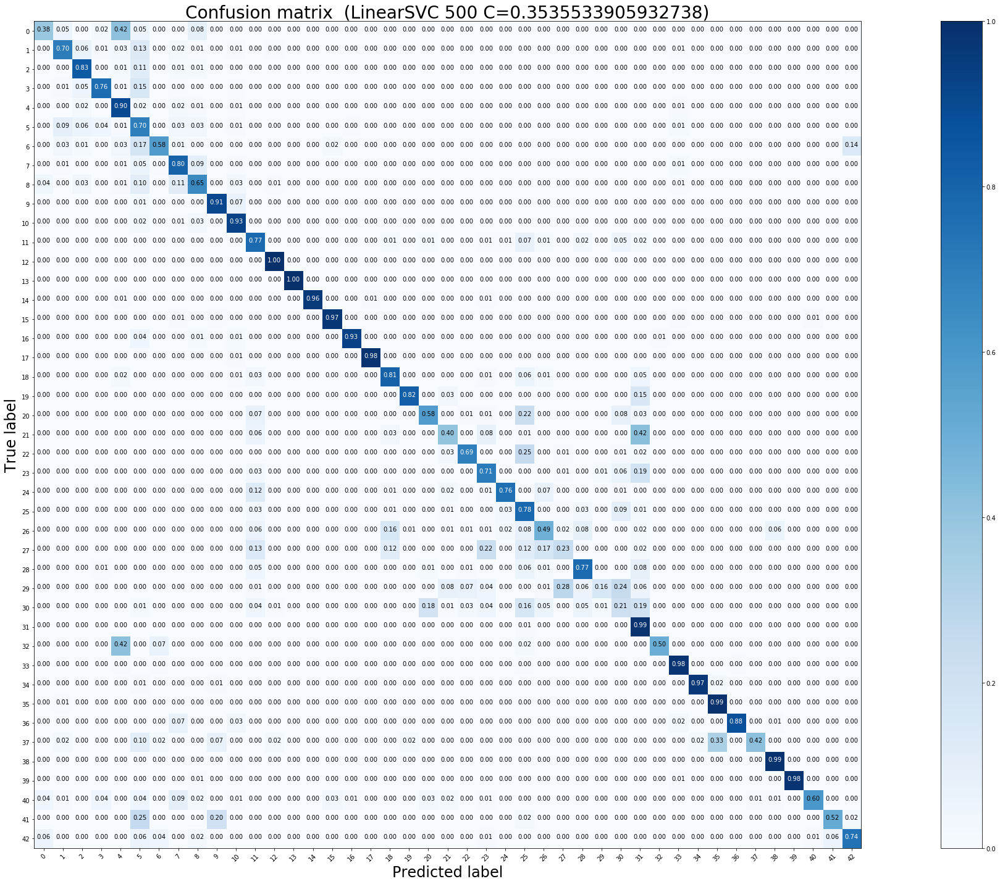

Test accuracy:  0.8246239113222487 

              precision    recall  f1-score   support

           0       0.44      0.38      0.41        60
           1       0.86      0.70      0.77       720
           2       0.81      0.83      0.82       750
           3       0.88      0.76      0.82       450
           4       0.83      0.90      0.87       660
           5       0.51      0.70      0.59       630
           6       0.86      0.58      0.69       150
           7       0.73      0.80      0.77       450
           8       0.71      0.65      0.68       450
           9       0.95      0.91      0.93       480
          10       0.87      0.93      0.90       660
          11       0.80      0.77      0.79       420
          12       0.98      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.99      0.96      0.98       270
          15       0.96      0.97      0.96       210
          16       0.96      0.93      0.94 

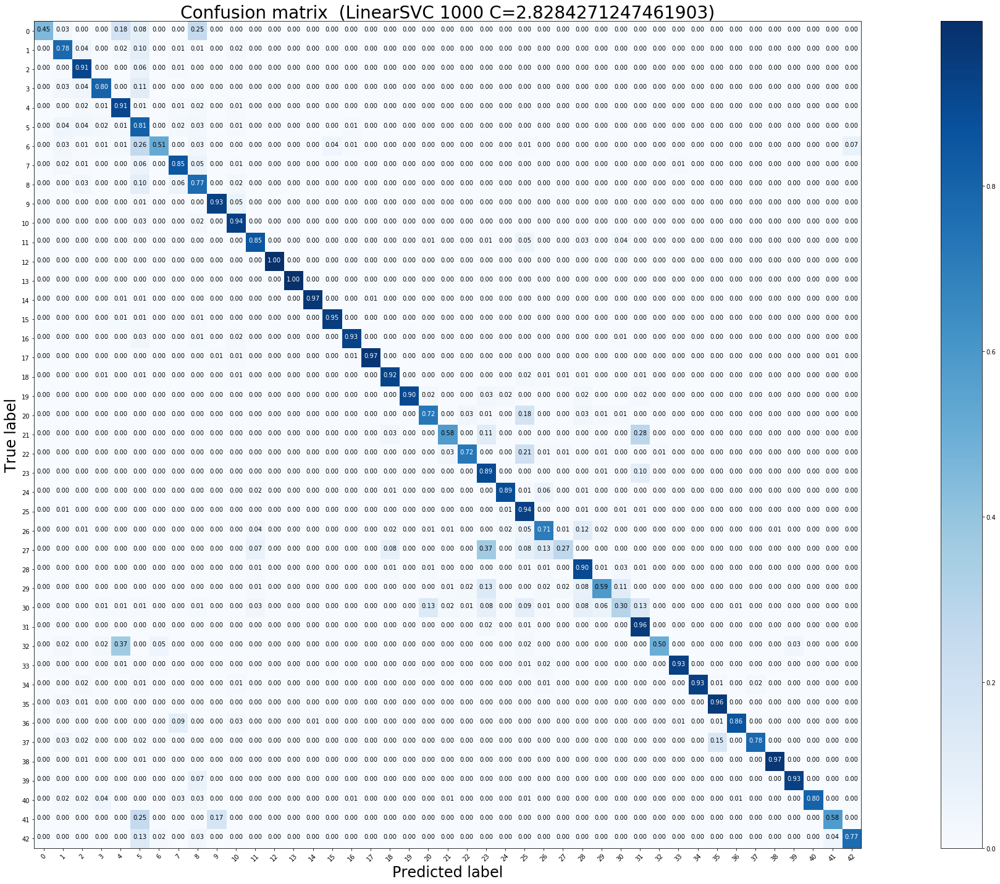

Test accuracy:  0.8741092636579573 

              precision    recall  f1-score   support

           0       0.93      0.45      0.61        60
           1       0.88      0.78      0.82       720
           2       0.85      0.91      0.88       750
           3       0.91      0.80      0.85       450
           4       0.89      0.91      0.90       660
           5       0.58      0.81      0.68       630
           6       0.91      0.51      0.66       150
           7       0.83      0.85      0.84       450
           8       0.76      0.77      0.76       450
           9       0.95      0.93      0.94       480
          10       0.88      0.94      0.91       660
          11       0.93      0.85      0.89       420
          12       0.99      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.99      0.97      0.98       270
          15       0.96      0.95      0.95       210
          16       0.91      0.93      0.92 

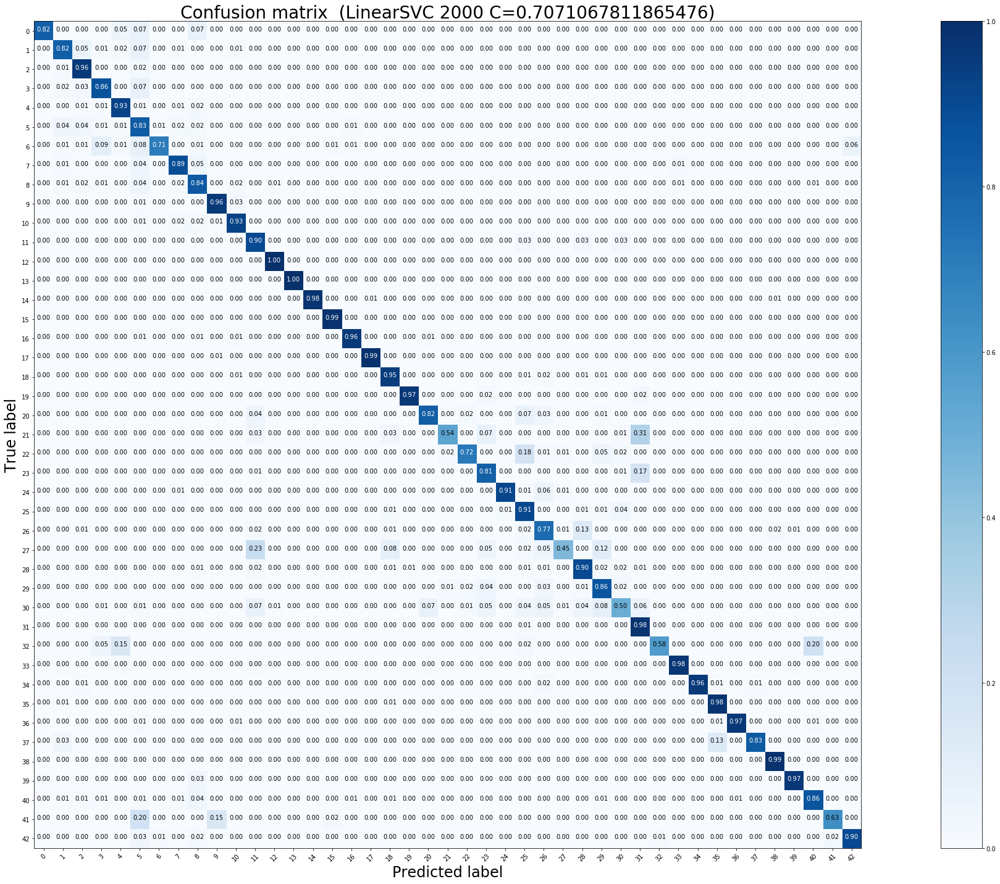

Test accuracy:  0.9075217735550277 

              precision    recall  f1-score   support

           0       0.94      0.82      0.87        60
           1       0.90      0.82      0.86       720
           2       0.88      0.96      0.92       750
           3       0.91      0.86      0.89       450
           4       0.95      0.93      0.94       660
           5       0.74      0.83      0.78       630
           6       0.95      0.71      0.81       150
           7       0.89      0.89      0.89       450
           8       0.83      0.84      0.83       450
           9       0.95      0.96      0.96       480
          10       0.93      0.93      0.93       660
          11       0.90      0.90      0.90       420
          12       0.99      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.99      0.98      0.99       270
          15       0.97      0.99      0.98       210
          16       0.92      0.96      0.94 

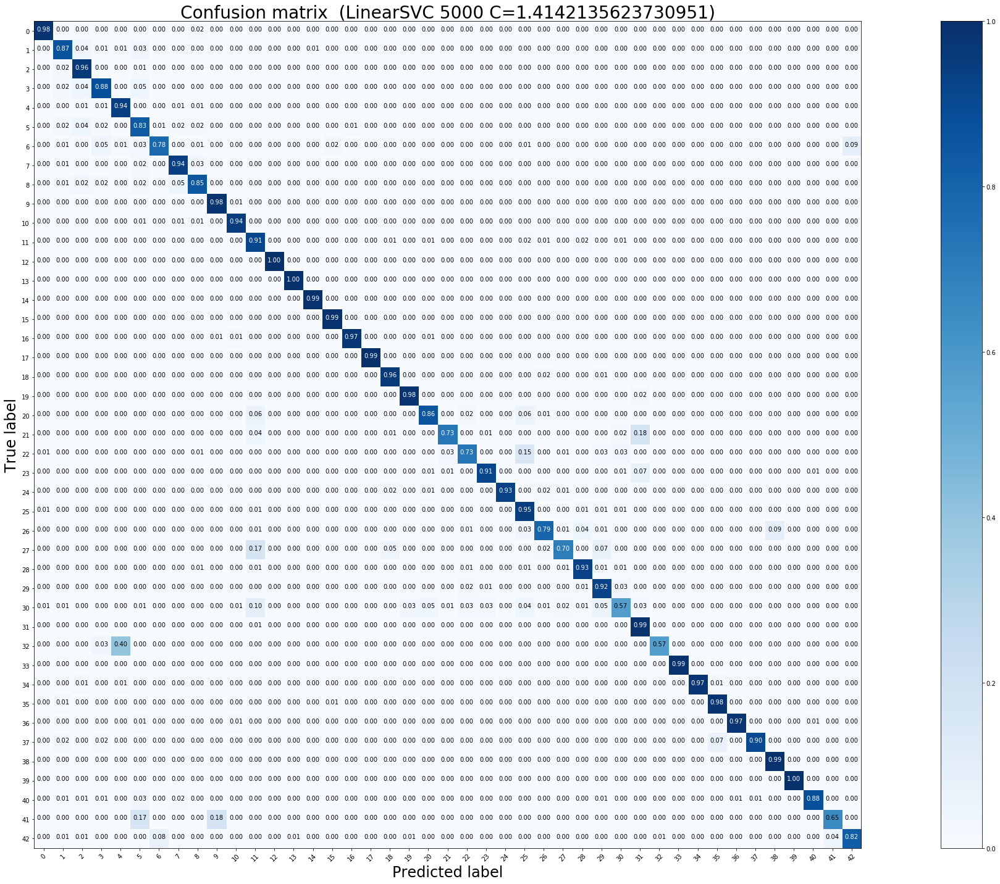

Test accuracy:  0.9265241488519398 

              precision    recall  f1-score   support

           0       0.88      0.98      0.93        60
           1       0.91      0.87      0.89       720
           2       0.88      0.96      0.92       750
           3       0.90      0.88      0.89       450
           4       0.94      0.94      0.94       660
           5       0.83      0.83      0.83       630
           6       0.91      0.78      0.84       150
           7       0.88      0.94      0.91       450
           8       0.89      0.85      0.87       450
           9       0.95      0.98      0.97       480
          10       0.97      0.94      0.95       660
          11       0.89      0.91      0.90       420
          12       0.99      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.97      0.99      0.98       270
          15       0.95      0.99      0.97       210
          16       0.93      0.97      0.95 

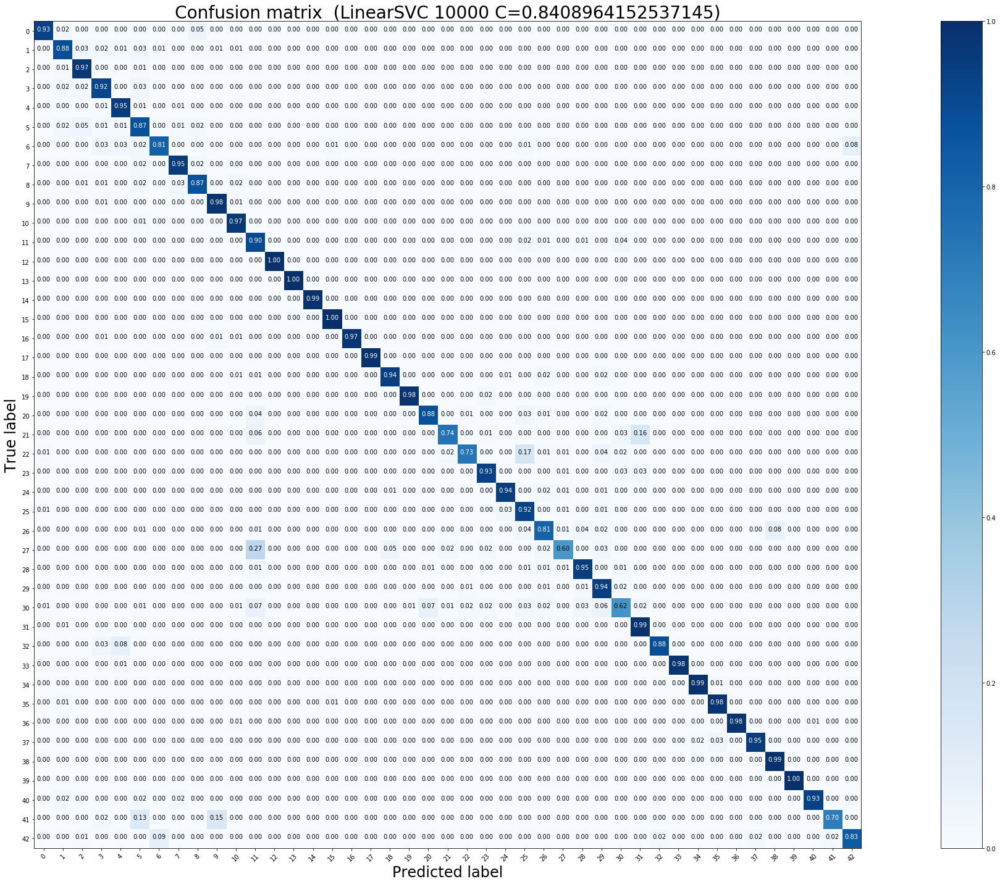

Test accuracy:  0.9365003958828186 

              precision    recall  f1-score   support

           0       0.90      0.93      0.92        60
           1       0.93      0.88      0.91       720
           2       0.91      0.97      0.94       750
           3       0.90      0.92      0.91       450
           4       0.96      0.95      0.96       660
           5       0.86      0.87      0.87       630
           6       0.91      0.81      0.86       150
           7       0.92      0.95      0.94       450
           8       0.92      0.87      0.89       450
           9       0.96      0.98      0.97       480
          10       0.95      0.97      0.96       660
          11       0.90      0.90      0.90       420
          12       1.00      1.00      1.00       690
          13       1.00      1.00      1.00       720
          14       0.99      0.99      0.99       270
          15       0.97      1.00      0.98       210
          16       0.97      0.97      0.97 

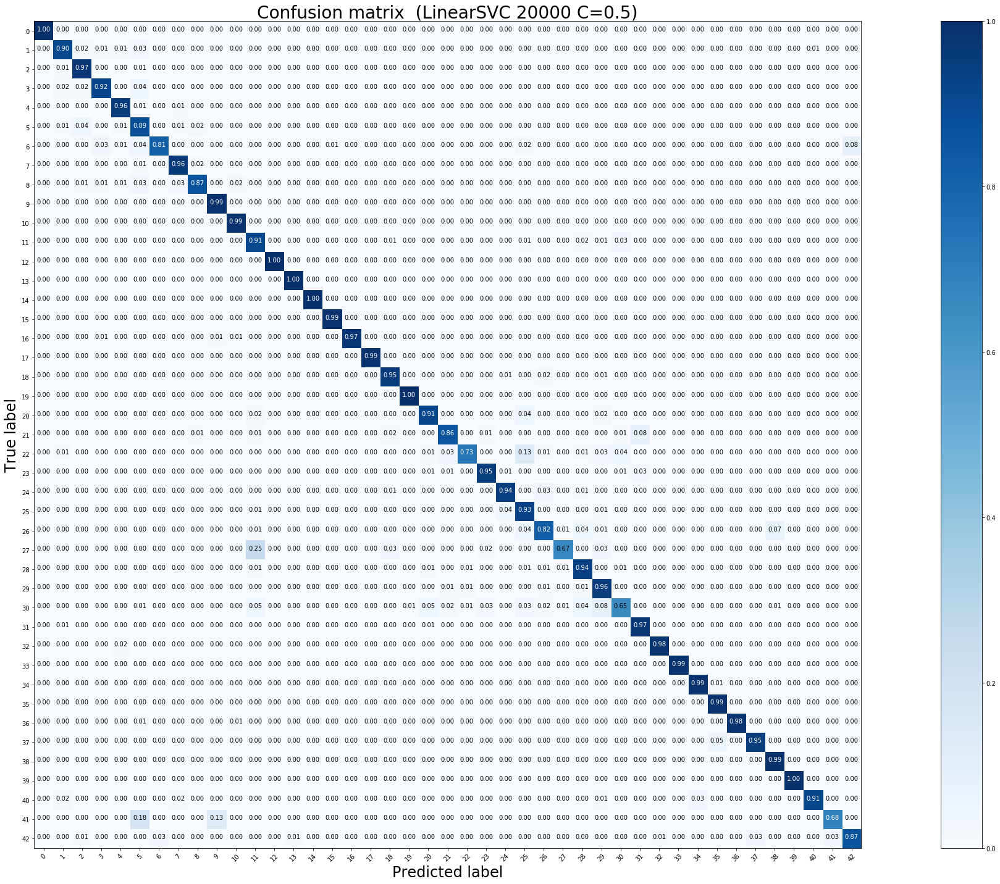

Test accuracy:  0.9451306413301662 

              precision    recall  f1-score   support

           0       0.97      1.00      0.98        60
           1       0.95      0.90      0.93       720
           2       0.92      0.97      0.95       750
           3       0.94      0.92      0.93       450
           4       0.97      0.96      0.96       660
           5       0.86      0.89      0.87       630
           6       0.95      0.81      0.87       150
           7       0.94      0.96      0.95       450
           8       0.95      0.87      0.91       450
           9       0.96      0.99      0.98       480
          10       0.97      0.99      0.98       660
          11       0.91      0.91      0.91       420
          12       1.00      1.00      1.00       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.98      0.99      0.99       210
          16       0.97      0.97      0.97 

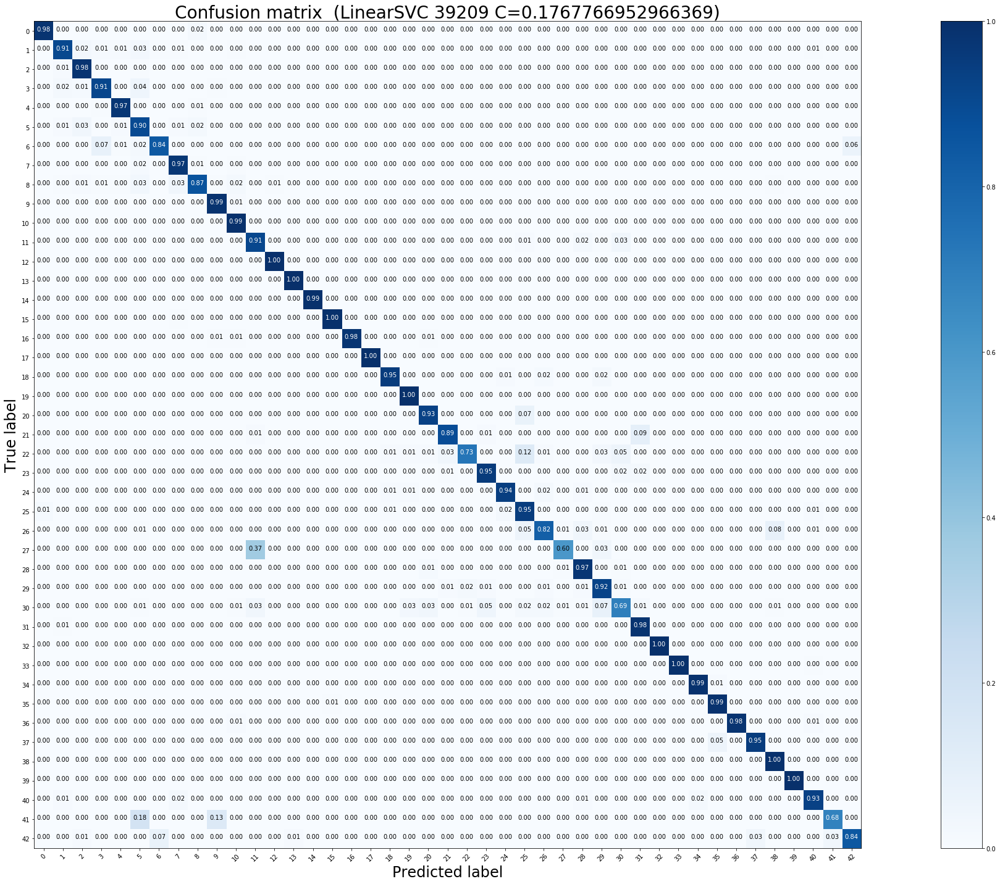

Test accuracy:  0.9495645288994458 

              precision    recall  f1-score   support

           0       0.91      0.98      0.94        60
           1       0.96      0.91      0.93       720
           2       0.94      0.98      0.96       750
           3       0.94      0.91      0.93       450
           4       0.97      0.97      0.97       660
           5       0.87      0.90      0.88       630
           6       0.93      0.84      0.88       150
           7       0.93      0.97      0.95       450
           8       0.95      0.87      0.90       450
           9       0.97      0.99      0.98       480
          10       0.96      0.99      0.98       660
          11       0.93      0.91      0.92       420
          12       0.99      1.00      1.00       690
          13       1.00      1.00      1.00       720
          14       0.99      0.99      0.99       270
          15       0.98      1.00      0.99       210
          16       0.99      0.98      0.99 

In [16]:
########################################################################################
###########   LinearSVC, squared_hinge, HOG, seed=1, random_A, without_scaler ##########
###########   optimierte Werte   #######################################################
########################################################################################

train_LinearSVC_sq(X_tr_500, X_test_9_4_2, y_tr_500, y_test, 1, '500',0.3535533905932738, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")
train_LinearSVC_sq(X_tr_1000, X_test_9_4_2, y_tr_1000, y_test, 1, '1000',2.8284271247461903, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")
train_LinearSVC_sq(X_tr_2000, X_test_9_4_2, y_tr_2000, y_test, 1, '2000',0.7071067811865476, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")
train_LinearSVC_sq(X_tr_5000, X_test_9_4_2, y_tr_5000, y_test, 1, '5000',1.4142135623730951, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")
train_LinearSVC_sq(X_tr_10000, X_test_9_4_2, y_tr_10000, y_test, 1, '10000',0.8408964152537145, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")
train_LinearSVC_sq(X_tr_20000, X_test_9_4_2, y_tr_20000, y_test, 1, '20000',0.5, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")
train_LinearSVC_sq(X_tr, X_test_9_4_2, y_tr, y_test, 1, '39209',0.1767766952966369, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt_ski/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")

Daten skalieren


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


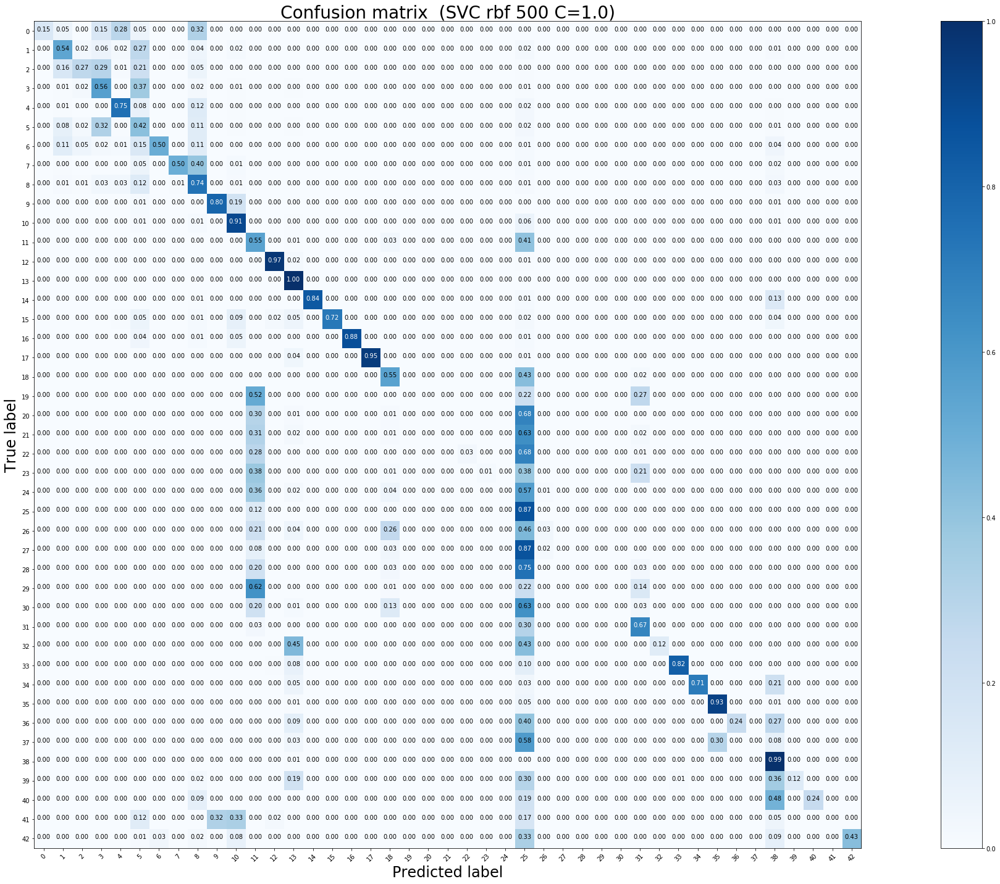

Test accuracy:  0.6285035629453681 

              precision    recall  f1-score   support

           0       0.82      0.15      0.25        60
           1       0.65      0.54      0.59       720
           2       0.81      0.27      0.41       750
           3       0.34      0.56      0.42       450
           4       0.90      0.75      0.82       660
           5       0.27      0.42      0.33       630
           6       0.96      0.50      0.66       150
           7       0.97      0.50      0.66       450
           8       0.41      0.74      0.53       450
           9       0.95      0.80      0.87       480
          10       0.77      0.91      0.83       660
          11       0.35      0.55      0.43       420
          12       0.99      0.97      0.98       690
          13       0.82      1.00      0.90       720
          14       1.00      0.84      0.91       270
          15       1.00      0.72      0.84       210
          16       1.00      0.88      0.94 

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarn

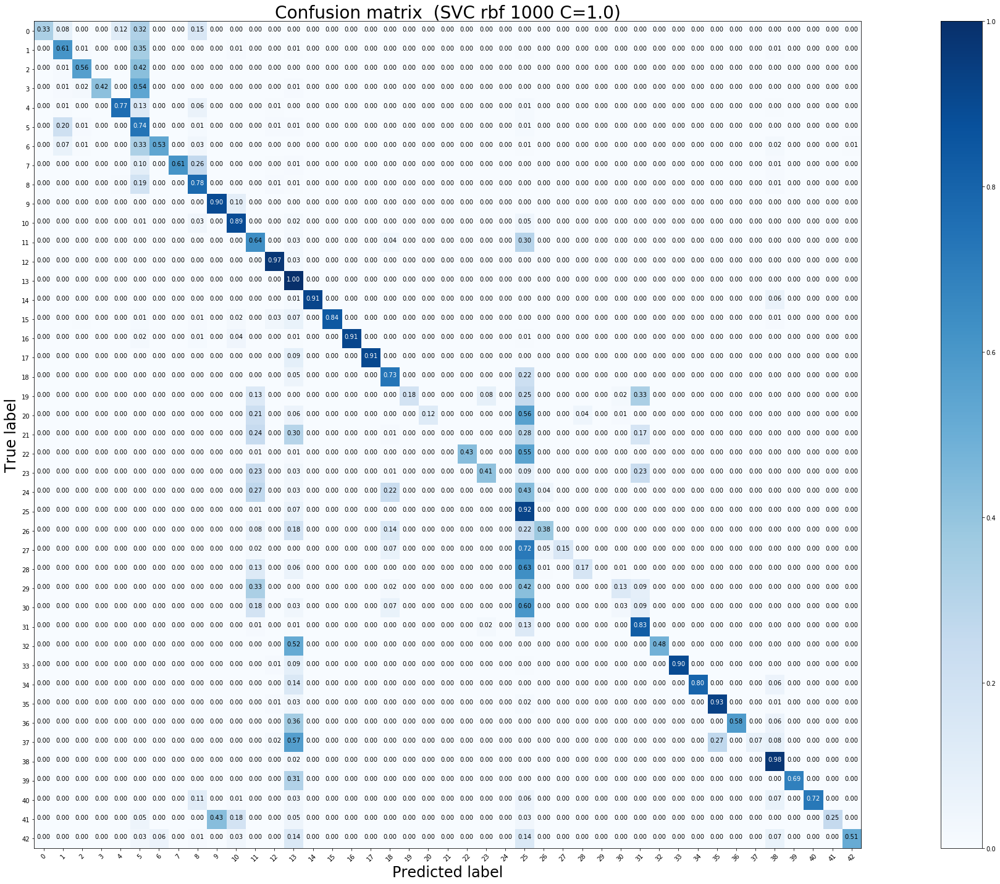

Test accuracy:  0.7215360253365004 

              precision    recall  f1-score   support

           0       1.00      0.33      0.50        60
           1       0.73      0.61      0.66       720
           2       0.95      0.56      0.71       750
           3       0.99      0.42      0.59       450
           4       0.98      0.77      0.86       660
           5       0.29      0.74      0.42       630
           6       0.94      0.53      0.68       150
           7       1.00      0.61      0.76       450
           8       0.61      0.78      0.69       450
           9       0.94      0.90      0.92       480
          10       0.88      0.89      0.89       660
          11       0.57      0.64      0.60       420
          12       0.95      0.97      0.96       690
          13       0.60      1.00      0.75       720
          14       1.00      0.91      0.96       270
          15       1.00      0.84      0.91       210
          16       1.00      0.91      0.95 

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarn

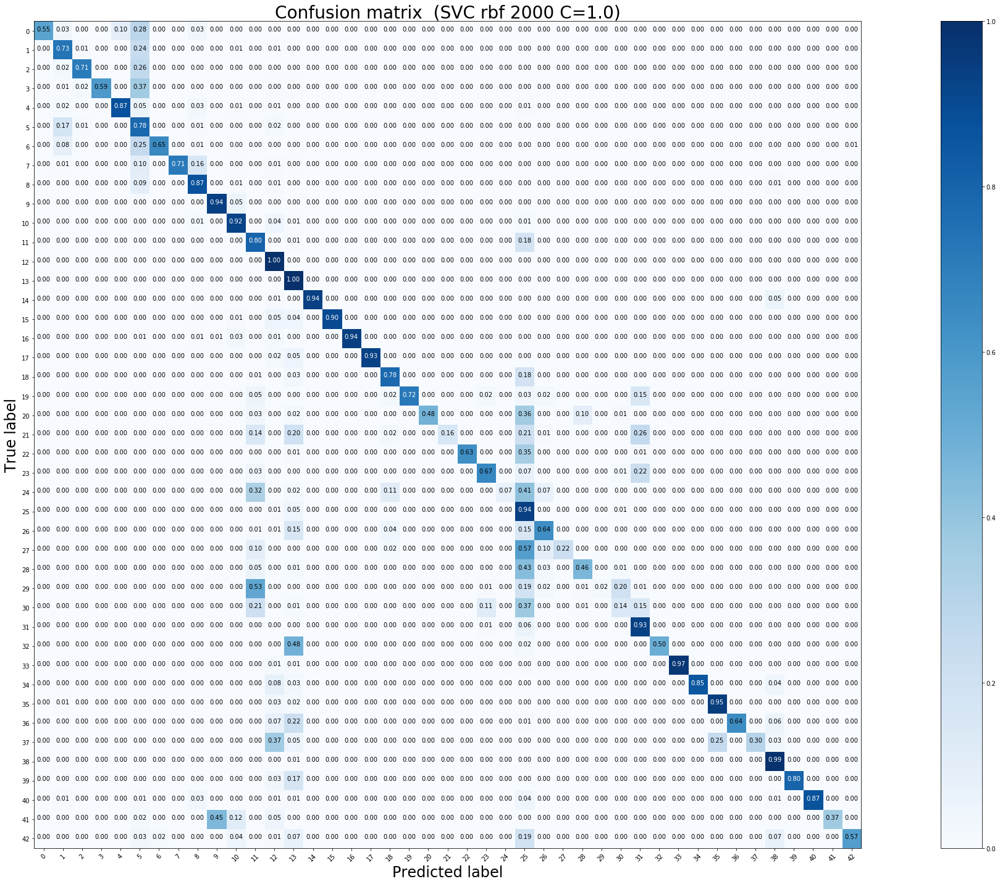

Test accuracy:  0.8062549485352336 

              precision    recall  f1-score   support

           0       1.00      0.55      0.71        60
           1       0.77      0.73      0.75       720
           2       0.96      0.71      0.82       750
           3       0.99      0.59      0.74       450
           4       0.99      0.87      0.93       660
           5       0.41      0.78      0.53       630
           6       0.98      0.65      0.78       150
           7       0.99      0.71      0.83       450
           8       0.78      0.87      0.83       450
           9       0.94      0.94      0.94       480
          10       0.91      0.92      0.92       660
          11       0.69      0.80      0.74       420
          12       0.82      1.00      0.90       690
          13       0.76      1.00      0.87       720
          14       1.00      0.94      0.97       270
          15       1.00      0.90      0.94       210
          16       1.00      0.94      0.97 

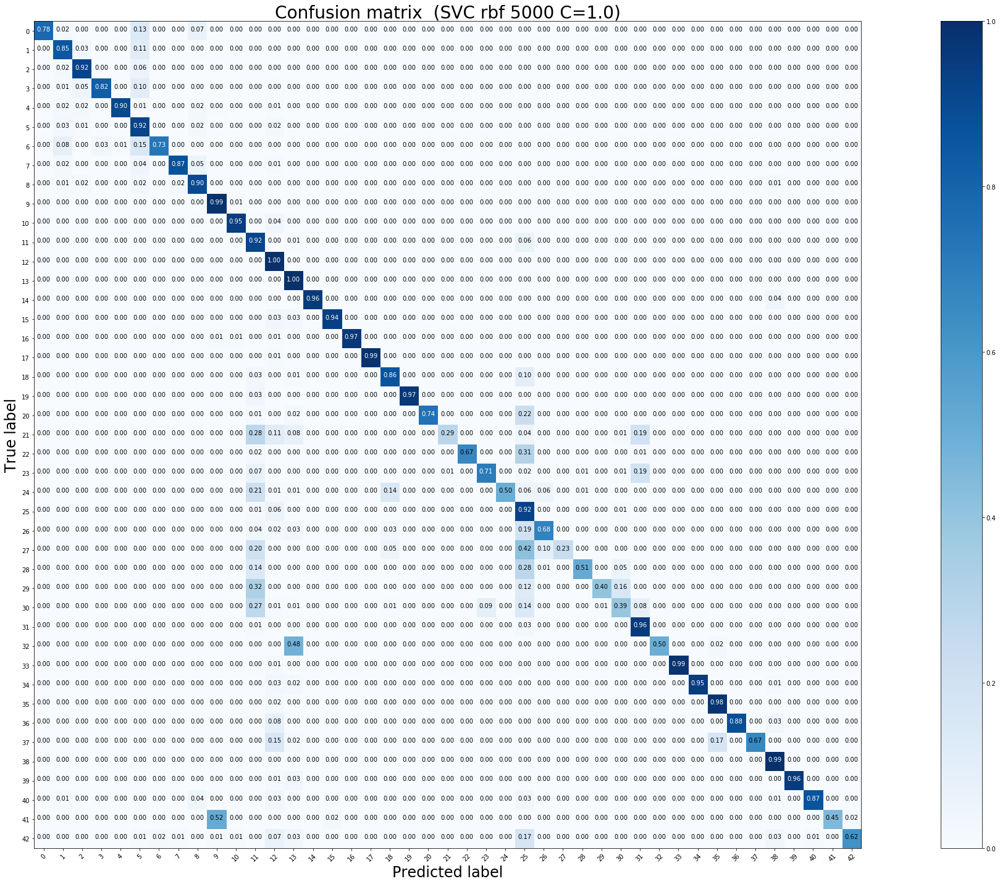

Test accuracy:  0.8859065716547901 

              precision    recall  f1-score   support

           0       1.00      0.78      0.88        60
           1       0.89      0.85      0.87       720
           2       0.90      0.92      0.91       750
           3       0.98      0.82      0.90       450
           4       1.00      0.90      0.95       660
           5       0.71      0.92      0.80       630
           6       0.98      0.73      0.84       150
           7       0.96      0.87      0.91       450
           8       0.87      0.90      0.88       450
           9       0.93      0.99      0.96       480
          10       0.98      0.95      0.96       660
          11       0.67      0.92      0.77       420
          12       0.82      1.00      0.90       690
          13       0.90      1.00      0.95       720
          14       1.00      0.96      0.98       270
          15       0.99      0.94      0.97       210
          16       1.00      0.97      0.98 

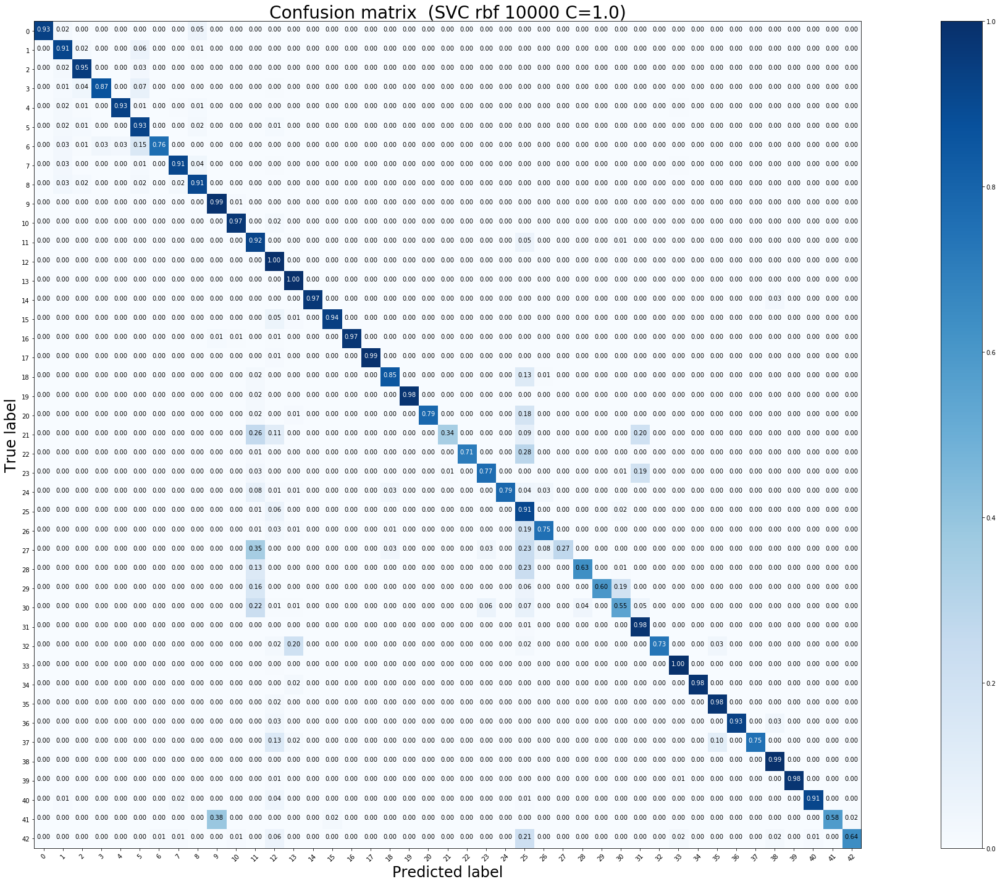

Test accuracy:  0.91243072050673 

              precision    recall  f1-score   support

           0       1.00      0.93      0.97        60
           1       0.89      0.91      0.90       720
           2       0.93      0.95      0.94       750
           3       0.98      0.87      0.92       450
           4       0.99      0.93      0.96       660
           5       0.81      0.93      0.86       630
           6       0.99      0.76      0.86       150
           7       0.96      0.91      0.94       450
           8       0.90      0.91      0.90       450
           9       0.95      0.99      0.97       480
          10       0.98      0.97      0.97       660
          11       0.74      0.92      0.82       420
          12       0.84      1.00      0.91       690
          13       0.96      1.00      0.98       720
          14       1.00      0.97      0.98       270
          15       0.99      0.94      0.97       210
          16       1.00      0.97      0.99   

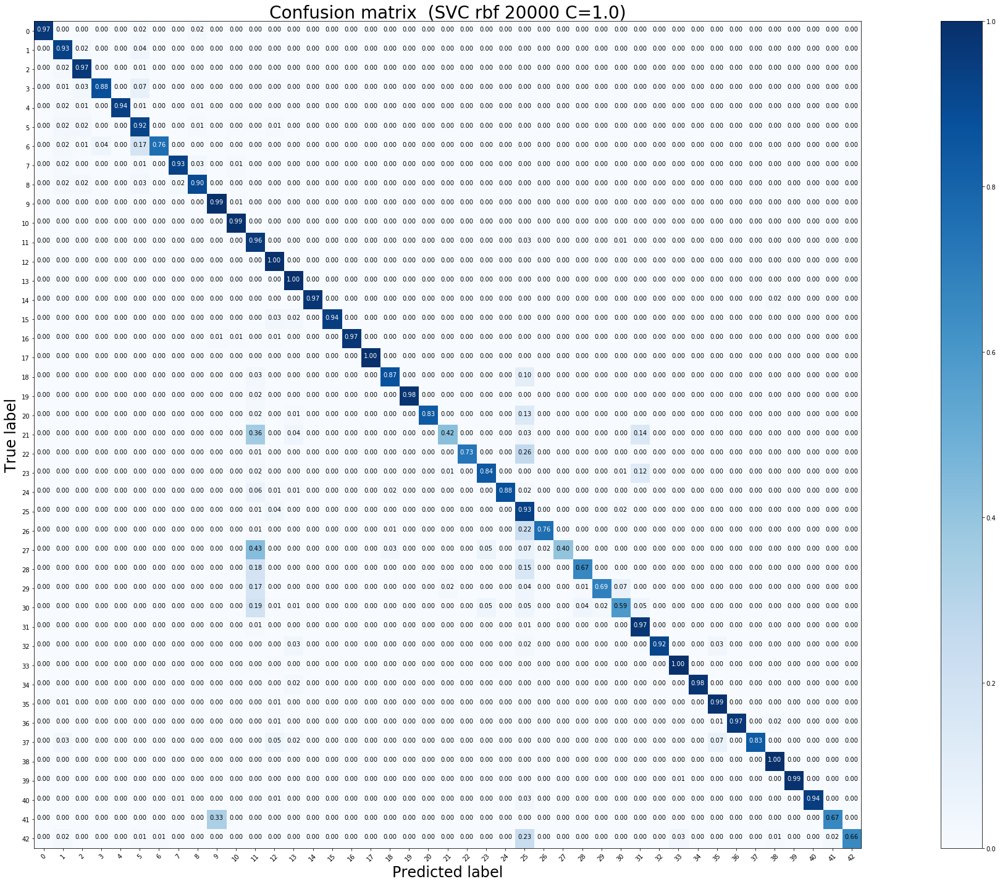

Test accuracy:  0.9277909738717339 

              precision    recall  f1-score   support

           0       1.00      0.97      0.98        60
           1       0.91      0.93      0.92       720
           2       0.92      0.97      0.94       750
           3       0.98      0.88      0.93       450
           4       1.00      0.94      0.97       660
           5       0.82      0.92      0.87       630
           6       0.99      0.76      0.86       150
           7       0.97      0.93      0.95       450
           8       0.94      0.90      0.92       450
           9       0.95      0.99      0.97       480
          10       0.98      0.99      0.98       660
          11       0.71      0.96      0.82       420
          12       0.93      1.00      0.96       690
          13       0.96      1.00      0.98       720
          14       1.00      0.97      0.99       270
          15       1.00      0.94      0.97       210
          16       1.00      0.97      0.99 

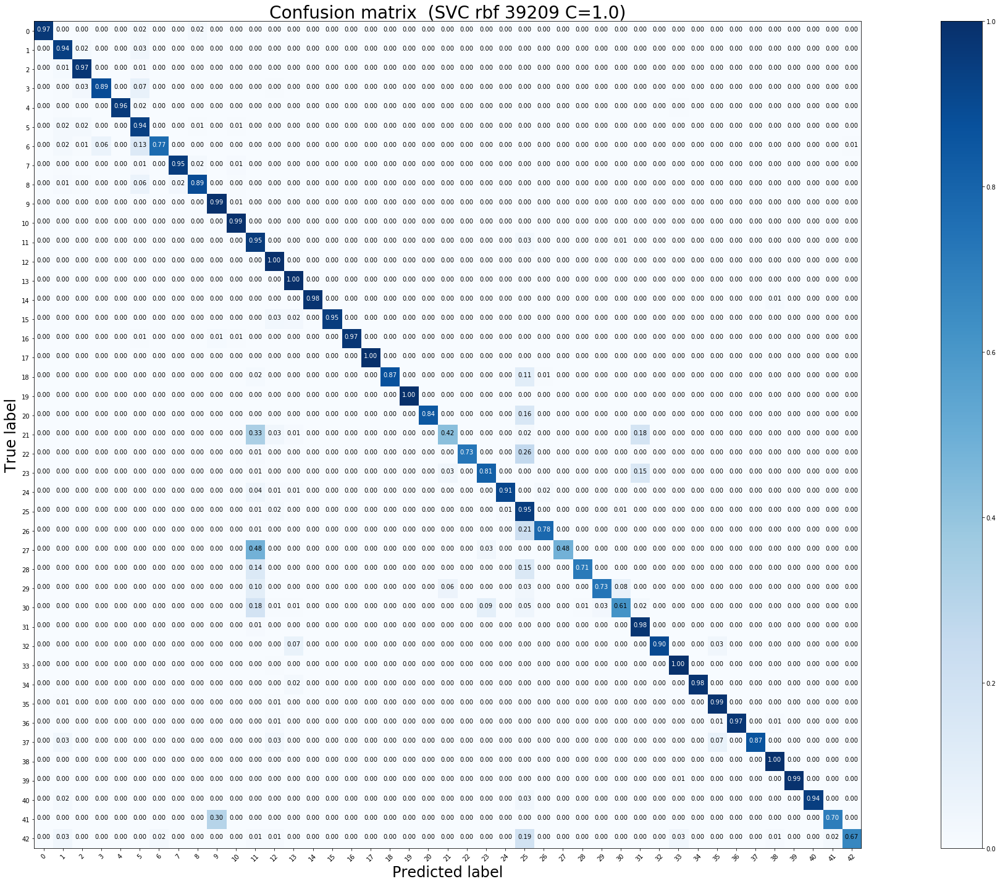

Test accuracy:  0.934916864608076 

              precision    recall  f1-score   support

           0       1.00      0.97      0.98        60
           1       0.93      0.94      0.94       720
           2       0.94      0.97      0.96       750
           3       0.97      0.89      0.93       450
           4       1.00      0.96      0.98       660
           5       0.82      0.94      0.88       630
           6       0.98      0.77      0.87       150
           7       0.97      0.95      0.96       450
           8       0.96      0.89      0.92       450
           9       0.96      0.99      0.98       480
          10       0.98      0.99      0.98       660
          11       0.74      0.95      0.84       420
          12       0.95      1.00      0.98       690
          13       0.97      1.00      0.98       720
          14       1.00      0.98      0.99       270
          15       1.00      0.95      0.97       210
          16       1.00      0.97      0.99  

In [17]:
##############################################################################
###########   SVC RBF, HOG, seed=1, random_A, with_scaler ####################
###########   Training mit Defaultwerten
##############################################################################

train_RBF_SVC(X_tr_500, X_test_9_4_2, y_tr_500, y_test, 1, '500',1.0, 'auto', 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_1000, X_test_9_4_2, y_tr_1000, y_test, 1, '1000',1.0, 'auto', 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_2000, X_test_9_4_2, y_tr_2000, y_test, 1, '2000',1.0, 'auto', 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_5000, X_test_9_4_2, y_tr_5000, y_test, 1, '5000',1.0, 'auto', 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_10000, X_test_9_4_2, y_tr_10000, y_test, 1, '10000',1.0, 'auto', 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_20000, X_test_9_4_2, y_tr_20000, y_test, 1, '20000',1.0, 'auto', 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr, X_test_9_4_2, y_tr, y_test, 1, '39209',1.0, 'auto', 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")

In [14]:
##################################################################################################
################ GridSearch, RBF #################################################################
################### mit StandardScaler   #########################################################
##################################################################################################
###### 1. Durchlauf GridSearch, Trainingsmengen 500, 1000
print("Trainingsmenge 500")
clf_500_RBF, time_500_RBF = tuning_hyper_params(X_tr_500, y_tr_500, X_test_9_4_2, y_test, 'rbf', 10, 2, 0, 
                                                np.logspace(-16,10,14, base=2), np.logspace(-16,4,11, base=2),'l2', 'hinge', 1)
save_trained_model_as_pkl(clf_500_RBF, "SVM_Modelle_GTSRB/Hog_opt_ski/rbf/Neue Mengen/500/seed_1_random_A_with_scaler/GridSearch_1DL.pkl")
save_as_csv(time_500_RBF, "SVM_Modelle_GTSRB/Hog_opt_ski/rbf/Neue Mengen/500/seed_1_random_A_with_scaler/", 'Suchzeiten_GridSearch_1_DL.csv')
print("*********************************************")
print("Trainingsmenge 1000")
clf_1000_RBF, time_1000_RBF = tuning_hyper_params(X_tr_1000, y_tr_1000, X_test_9_4_2, y_test, 'rbf', 10, 2, 0, 
                                                np.logspace(-16,10,14, base=2), np.logspace(-16,4,11, base=2),'l2', 'hinge', 1)
save_trained_model_as_pkl(clf_1000_RBF, "SVM_Modelle_GTSRB/Hog_opt_ski/rbf/Neue Mengen/1000/seed_1_random_A_with_scaler/GridSearch_1DL.pkl")
save_as_csv(time_1000_RBF, "SVM_Modelle_GTSRB/Hog_opt_ski/rbf/Neue Mengen/1000/seed_1_random_A_with_scaler/", 'Suchzeiten_GridSearch_1_DL.csv')


Trainingsmenge 500


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 2 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)



 C_range:  [1.52587891e-05 6.10351562e-05 2.44140625e-04 9.76562500e-04
 3.90625000e-03 1.56250000e-02 6.25000000e-02 2.50000000e-01
 1.00000000e+00 4.00000000e+00 1.60000000e+01 6.40000000e+01
 2.56000000e+02 1.02400000e+03]

 gamma_range: [1.52587891e-05 6.10351562e-05 2.44140625e-04 9.76562500e-04
 3.90625000e-03 1.56250000e-02 6.25000000e-02 2.50000000e-01
 1.00000000e+00 4.00000000e+00 1.60000000e+01]

 Beste Score:  0.7318257094430999

 Besten Parameter:  {'svm__C': 256.0, 'svm__gamma': 1.52587890625e-05}
Precision-Score: 0.038492 (0.036970) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 1.52587890625e-05}
Precision-Score: 0.036608 (0.035690) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 6.103515625e-05}
Precision-Score: 0.026869 (0.031311) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 0.000244140625}
Precision-Score: 0.027033 (0.030623) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 0.0009765625}
Precision-Score: 0.017108 (0.027

Recall-Score: 0.033294 (0.009938) mit Parameter: {'svm__C': 16.0, 'svm__gamma': 4.0}
Recall-Score: 0.033294 (0.009938) mit Parameter: {'svm__C': 16.0, 'svm__gamma': 16.0}
Recall-Score: 0.754859 (0.105658) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 1.52587890625e-05}
Recall-Score: 0.741588 (0.108336) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 6.103515625e-05}
Recall-Score: 0.671587 (0.149284) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 0.000244140625}
Recall-Score: 0.330769 (0.115380) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 0.0009765625}
Recall-Score: 0.048756 (0.019501) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 0.00390625}
Recall-Score: 0.033294 (0.009938) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 0.015625}
Recall-Score: 0.033294 (0.009938) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 0.0625}
Recall-Score: 0.033294 (0.009938) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 0.25}
Recall-Score: 0.033294 (0.009938) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 1.0}
Re

*********************************************
Trainingsmenge 1000


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 5 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)



 C_range:  [1.52587891e-05 6.10351562e-05 2.44140625e-04 9.76562500e-04
 3.90625000e-03 1.56250000e-02 6.25000000e-02 2.50000000e-01
 1.00000000e+00 4.00000000e+00 1.60000000e+01 6.40000000e+01
 2.56000000e+02 1.02400000e+03]

 gamma_range: [1.52587891e-05 6.10351562e-05 2.44140625e-04 9.76562500e-04
 3.90625000e-03 1.56250000e-02 6.25000000e-02 2.50000000e-01
 1.00000000e+00 4.00000000e+00 1.60000000e+01]

 Beste Score:  0.834090454877125

 Besten Parameter:  {'svm__C': 256.0, 'svm__gamma': 1.52587890625e-05}
Precision-Score: 0.028031 (0.021750) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 1.52587890625e-05}
Precision-Score: 0.026329 (0.022890) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 6.103515625e-05}
Precision-Score: 0.013362 (0.013602) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 0.000244140625}
Precision-Score: 0.010877 (0.012031) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 0.0009765625}
Precision-Score: 0.005927 (0.0065

FileNotFoundError: [Errno 2] No such file or directory: 'SVM_Modelle_GTSRB/Hog_opt_ski/rbf/Neue Mengen/1000/seed_1_random_A_with_scaler/GridSearch_1DL.pkl'

In [16]:
save_trained_model_as_pkl(clf_1000_RBF, "SVM_Modelle_GTSRB/Hog_opt_ski/rbf/Neue Mengen/1000/seed_1_random_A_with_scaler/GridSearch_1DL.pkl")
save_as_csv(time_1000_RBF, "SVM_Modelle_GTSRB/Hog_opt_ski/rbf/Neue Mengen/1000/seed_1_random_A_with_scaler/", 'Suchzeiten_GridSearch_1_DL.csv')


In [17]:
# 1. Durchlauf GridSearch, Trainingsmenge 2000
print("*********************************************")
print("Trainingsmenge 2000")
clf_2000_RBF, time_2000_RBF = tuning_hyper_params(X_tr_2000, y_tr_2000, X_test_9_4_2, y_test, 'rbf', 10, 2, 0, 
                                                np.logspace(-16,10,14, base=2), np.logspace(-16,4,11, base=2),'l2', 'hinge', 1)
save_trained_model_as_pkl(clf_2000_RBF, "SVM_Modelle_GTSRB/Hog_opt_ski/rbf/Neue Mengen/2000/seed_1_random_A_with_scaler/GridSearch_1DL.pkl")
save_as_csv(time_2000_RBF, "SVM_Modelle_GTSRB/Hog_opt_ski/rbf/Neue Mengen/2000/seed_1_random_A_with_scaler/", 'Suchzeiten_GridSearch_1_DL.csv')

*********************************************
Trainingsmenge 2000

 C_range:  [1.52587891e-05 6.10351562e-05 2.44140625e-04 9.76562500e-04
 3.90625000e-03 1.56250000e-02 6.25000000e-02 2.50000000e-01
 1.00000000e+00 4.00000000e+00 1.60000000e+01 6.40000000e+01
 2.56000000e+02 1.02400000e+03]

 gamma_range: [1.52587891e-05 6.10351562e-05 2.44140625e-04 9.76562500e-04
 3.90625000e-03 1.56250000e-02 6.25000000e-02 2.50000000e-01
 1.00000000e+00 4.00000000e+00 1.60000000e+01]

 Beste Score:  0.9002489659200468

 Besten Parameter:  {'svm__C': 256.0, 'svm__gamma': 1.52587890625e-05}
Precision-Score: 0.007242 (0.009594) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 1.52587890625e-05}
Precision-Score: 0.004179 (0.006515) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 6.103515625e-05}
Precision-Score: 0.002232 (0.001962) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 0.000244140625}
Precision-Score: 0.005921 (0.009437) mit Parameter: {'svm__C': 1.52587890625

In [14]:
###### 2. Durchlauf GridSearch Trainingsmengen 500, 1000
print("Trainingsmenge 500")
clf_500_RBF, time_500_RBF = tuning_hyper_params(X_tr_500, y_tr_500, X_test_9_4_2, y_test, 'rbf', 10, 2, 0, 
                                                get_finer_range(256.0), get_finer_range(1.52587890625e-05),'l2', 'hinge', 1)
save_trained_model_as_pkl(clf_500_RBF, "SVM_Modelle_GTSRB/Hog_opt_ski/rbf/Neue Mengen/500/seed_1_random_A_with_scaler/GridSearch_2DL.pkl")
save_as_csv(time_500_RBF, "SVM_Modelle_GTSRB/Hog_opt_ski/rbf/Neue Mengen/500/seed_1_random_A_with_scaler/", 'Suchzeiten_GridSearch_2_DL.csv')

print("*********************************************")
print("Trainingsmenge 1000")
clf_1000_RBF, time_1000_RBF = tuning_hyper_params(X_tr_1000, y_tr_1000, X_test_9_4_2, y_test, 'rbf', 10, 2, 0, 
                                                get_finer_range(256.0), get_finer_range(1.52587890625e-05),'l2', 'hinge', 1)
save_trained_model_as_pkl(clf_1000_RBF, "SVM_Modelle_GTSRB/Hog_opt_ski/rbf/Neue Mengen/1000/seed_1_random_A_with_scaler/GridSearch_2DL.pkl")
save_as_csv(time_1000_RBF, "SVM_Modelle_GTSRB/Hog_opt_ski/rbf/Neue Mengen/1000/seed_1_random_A_with_scaler/", 'Suchzeiten_GridSearch_2_DL.csv')


Trainingsmenge 500


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 2 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)



 C_range:  [  64.           76.10925536   90.50966799  107.63474115  128.
  152.21851072  181.01933598  215.2694823   256.          304.43702144
  362.03867197  430.53896461  512.          608.87404288  724.07734394
  861.07792922 1024.        ]

 gamma_range: [3.81469727e-06 4.53646513e-06 5.39479661e-06 6.41553051e-06
 7.62939453e-06 9.07293026e-06 1.07895932e-05 1.28310610e-05
 1.52587891e-05 1.81458605e-05 2.15791864e-05 2.56621220e-05
 3.05175781e-05 3.62917210e-05 4.31583729e-05 5.13242441e-05
 6.10351562e-05]

 Beste Score:  0.734981741782853

 Besten Parameter:  {'svm__C': 215.2694823049509, 'svm__gamma': 6.4155305118844185e-06}
Precision-Score: 0.696154 (0.121325) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 3.814697265625e-06}
Precision-Score: 0.713580 (0.124278) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 4.536465129862675e-06}
Precision-Score: 0.718726 (0.128714) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 5.3947966093944364e-06}
Precision-Score: 0.721626 (0.128725) m

Precision-Score: 0.715174 (0.128711) mit Parameter: {'svm__C': 1024.0, 'svm__gamma': 6.103515625e-05}
Recall-Score: 0.723338 (0.100324) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 3.814697265625e-06}
Recall-Score: 0.738381 (0.103995) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 4.536465129862675e-06}
Recall-Score: 0.744461 (0.104717) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 5.3947966093944364e-06}
Recall-Score: 0.744770 (0.108592) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 6.4155305118844185e-06}
Recall-Score: 0.744016 (0.105151) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 7.62939453125e-06}
Recall-Score: 0.750228 (0.108569) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 9.07293025972535e-06}
Recall-Score: 0.750276 (0.107528) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 1.0789593218788873e-05}
Recall-Score: 0.752751 (0.107763) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 1.2831061023768837e-05}
Recall-Score: 0.754859 (0.105658) mit Parameter: {'svm__C': 64.0, 'svm__gamma'

Roc-Score: 0.871905 (0.053642) mit Parameter: {'svm__C': 608.8740428813932, 'svm__gamma': 3.0517578125e-05}
Roc-Score: 0.871905 (0.053642) mit Parameter: {'svm__C': 608.8740428813932, 'svm__gamma': 3.62917210389014e-05}
Roc-Score: 0.870300 (0.055309) mit Parameter: {'svm__C': 608.8740428813932, 'svm__gamma': 4.315837287515549e-05}
Roc-Score: 0.867576 (0.054737) mit Parameter: {'svm__C': 608.8740428813932, 'svm__gamma': 5.132424409507535e-05}
Roc-Score: 0.867576 (0.054737) mit Parameter: {'svm__C': 608.8740428813932, 'svm__gamma': 6.103515625e-05}
Roc-Score: 0.877181 (0.056383) mit Parameter: {'svm__C': 724.0773439350247, 'svm__gamma': 3.814697265625e-06}
Roc-Score: 0.877181 (0.056383) mit Parameter: {'svm__C': 724.0773439350247, 'svm__gamma': 4.536465129862675e-06}
Roc-Score: 0.877181 (0.056383) mit Parameter: {'svm__C': 724.0773439350247, 'svm__gamma': 5.3947966093944364e-06}
Roc-Score: 0.877181 (0.056383) mit Parameter: {'svm__C': 724.0773439350247, 'svm__gamma': 6.4155305118844185e-

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 5 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)



 C_range:  [  64.           76.10925536   90.50966799  107.63474115  128.
  152.21851072  181.01933598  215.2694823   256.          304.43702144
  362.03867197  430.53896461  512.          608.87404288  724.07734394
  861.07792922 1024.        ]

 gamma_range: [3.81469727e-06 4.53646513e-06 5.39479661e-06 6.41553051e-06
 7.62939453e-06 9.07293026e-06 1.07895932e-05 1.28310610e-05
 1.52587891e-05 1.81458605e-05 2.15791864e-05 2.56621220e-05
 3.05175781e-05 3.62917210e-05 4.31583729e-05 5.13242441e-05
 6.10351562e-05]

 Beste Score:  0.8396352047009447

 Besten Parameter:  {'svm__C': 430.5389646099018, 'svm__gamma': 5.3947966093944364e-06}
Precision-Score: 0.823107 (0.057549) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 3.814697265625e-06}
Precision-Score: 0.823917 (0.057971) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 4.536465129862675e-06}
Precision-Score: 0.826253 (0.057618) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 5.3947966093944364e-06}
Precision-Score: 0.826119 (0.062798) 

Roc-Score: 0.923006 (0.033783) mit Parameter: {'svm__C': 1024.0, 'svm__gamma': 7.62939453125e-06}
Roc-Score: 0.923006 (0.033783) mit Parameter: {'svm__C': 1024.0, 'svm__gamma': 9.07293025972535e-06}
Roc-Score: 0.923006 (0.033783) mit Parameter: {'svm__C': 1024.0, 'svm__gamma': 1.0789593218788873e-05}
Roc-Score: 0.923006 (0.033783) mit Parameter: {'svm__C': 1024.0, 'svm__gamma': 1.2831061023768837e-05}
Roc-Score: 0.923006 (0.033783) mit Parameter: {'svm__C': 1024.0, 'svm__gamma': 1.52587890625e-05}
Roc-Score: 0.921256 (0.032773) mit Parameter: {'svm__C': 1024.0, 'svm__gamma': 1.81458605194507e-05}
Roc-Score: 0.921256 (0.032773) mit Parameter: {'svm__C': 1024.0, 'svm__gamma': 2.1579186437577746e-05}
Roc-Score: 0.921256 (0.032773) mit Parameter: {'svm__C': 1024.0, 'svm__gamma': 2.5662122047537674e-05}
Roc-Score: 0.921691 (0.033247) mit Parameter: {'svm__C': 1024.0, 'svm__gamma': 3.0517578125e-05}
Roc-Score: 0.920045 (0.034902) mit Parameter: {'svm__C': 1024.0, 'svm__gamma': 3.629172103890

In [15]:
# 2. Durchlauf GridSearch Trainingsmenge 2000
print("*********************************************")
print("Trainingsmenge 2000")
clf_2000_RBF, time_2000_RBF = tuning_hyper_params(X_tr_2000, y_tr_2000, X_test_9_4_2, y_test, 'rbf', 10, 2, 0, 
                                                get_finer_range(256.0), get_finer_range(1.52587890625e-05),'l2', 'hinge', 1)
save_trained_model_as_pkl(clf_2000_RBF, "SVM_Modelle_GTSRB/Hog_opt_ski/rbf/Neue Mengen/2000/seed_1_random_A_with_scaler/GridSearch_2DL.pkl")
save_as_csv(time_2000_RBF, "SVM_Modelle_GTSRB/Hog_opt_ski/rbf/Neue Mengen/2000/seed_1_random_A_with_scaler/", 'Suchzeiten_GridSearch_2_DL.csv')

*********************************************
Trainingsmenge 2000

 C_range:  [  64.           76.10925536   90.50966799  107.63474115  128.
  152.21851072  181.01933598  215.2694823   256.          304.43702144
  362.03867197  430.53896461  512.          608.87404288  724.07734394
  861.07792922 1024.        ]

 gamma_range: [3.81469727e-06 4.53646513e-06 5.39479661e-06 6.41553051e-06
 7.62939453e-06 9.07293026e-06 1.07895932e-05 1.28310610e-05
 1.52587891e-05 1.81458605e-05 2.15791864e-05 2.56621220e-05
 3.05175781e-05 3.62917210e-05 4.31583729e-05 5.13242441e-05
 6.10351562e-05]

 Beste Score:  0.9082246536995249

 Besten Parameter:  {'svm__C': 512.0, 'svm__gamma': 4.536465129862675e-06}
Precision-Score: 0.917114 (0.043558) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 3.814697265625e-06}
Precision-Score: 0.918685 (0.045048) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 4.536465129862675e-06}
Precision-Score: 0.915067 (0.041186) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 5.394796

Daten skalieren


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


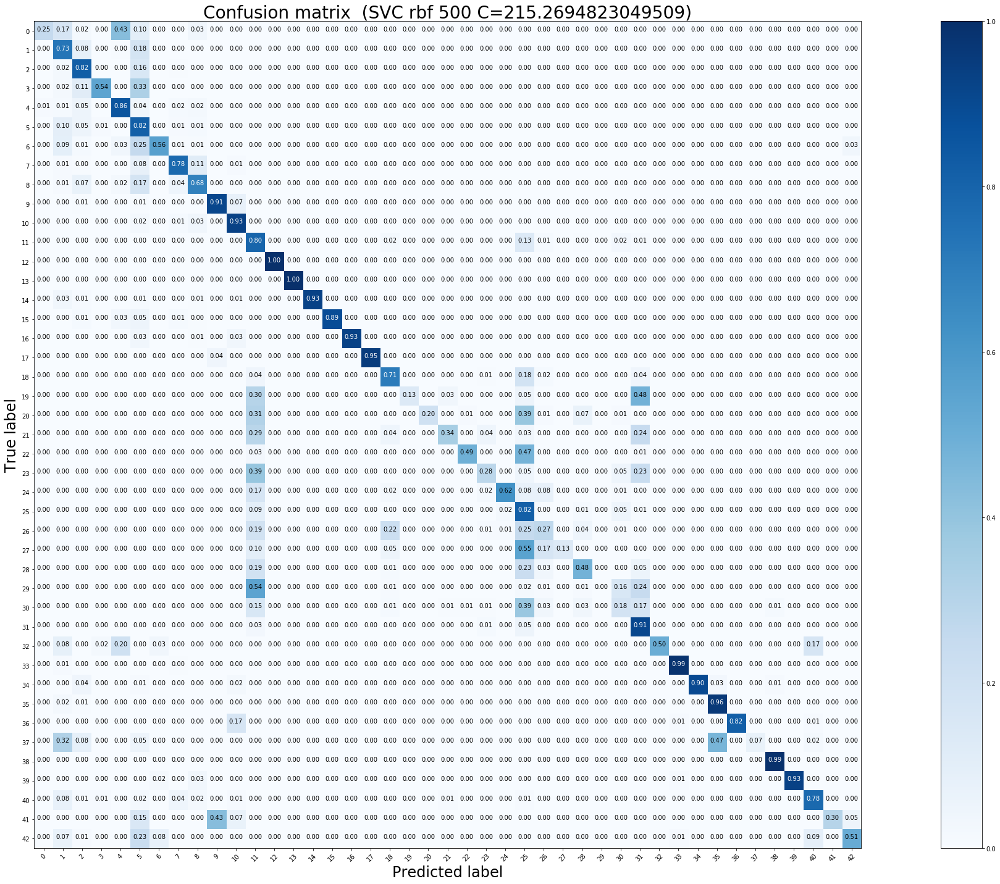

Test accuracy:  0.7878859857482186 

              precision    recall  f1-score   support

           0       0.68      0.25      0.37        60
           1       0.74      0.73      0.74       720
           2       0.72      0.82      0.77       750
           3       0.96      0.54      0.69       450
           4       0.90      0.86      0.88       660
           5       0.45      0.82      0.58       630
           6       0.88      0.56      0.69       150
           7       0.86      0.78      0.82       450
           8       0.74      0.68      0.71       450
           9       0.91      0.91      0.91       480
          10       0.89      0.93      0.91       660
          11       0.48      0.80      0.60       420
          12       1.00      1.00      1.00       690
          13       1.00      1.00      1.00       720
          14       1.00      0.93      0.96       270
          15       1.00      0.89      0.94       210
          16       1.00      0.93      0.96 

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarn

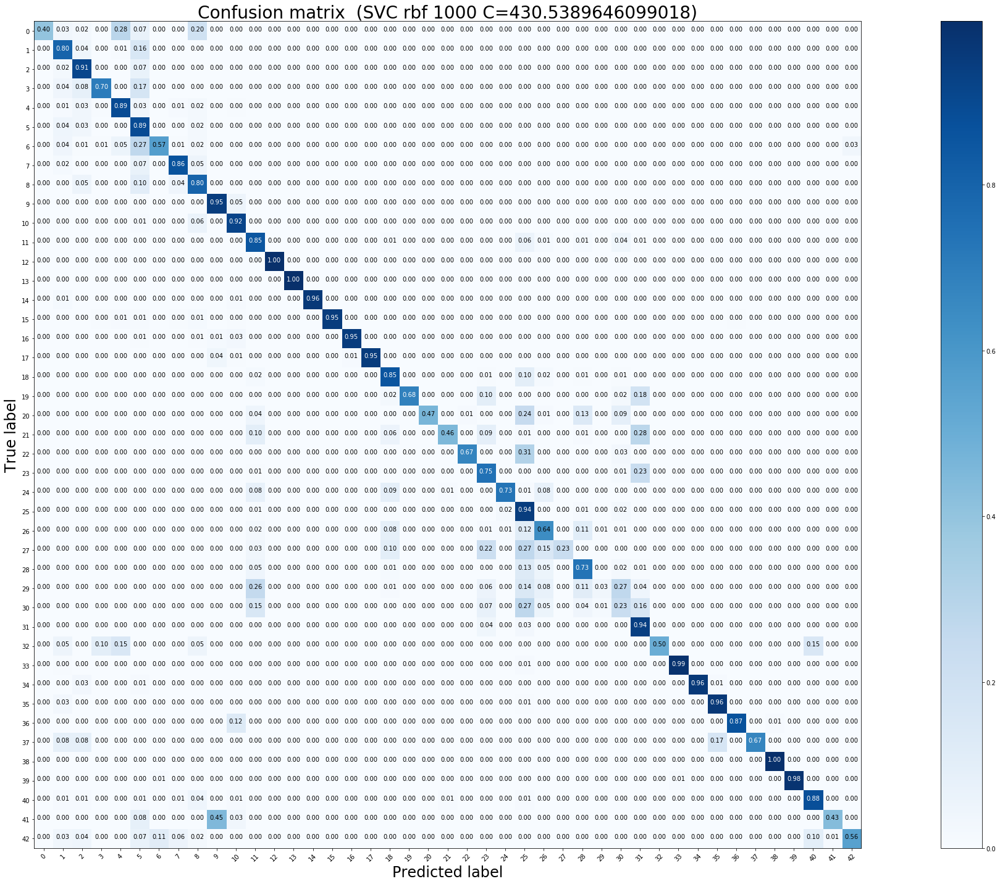

Test accuracy:  0.858590657165479 

              precision    recall  f1-score   support

           0       1.00      0.40      0.57        60
           1       0.84      0.80      0.82       720
           2       0.82      0.91      0.86       750
           3       0.96      0.70      0.81       450
           4       0.93      0.89      0.91       660
           5       0.58      0.89      0.70       630
           6       0.89      0.57      0.69       150
           7       0.91      0.86      0.89       450
           8       0.75      0.80      0.77       450
           9       0.91      0.95      0.93       480
          10       0.91      0.92      0.91       660
          11       0.80      0.85      0.83       420
          12       1.00      1.00      1.00       690
          13       1.00      1.00      1.00       720
          14       1.00      0.96      0.98       270
          15       1.00      0.95      0.97       210
          16       0.98      0.95      0.96  

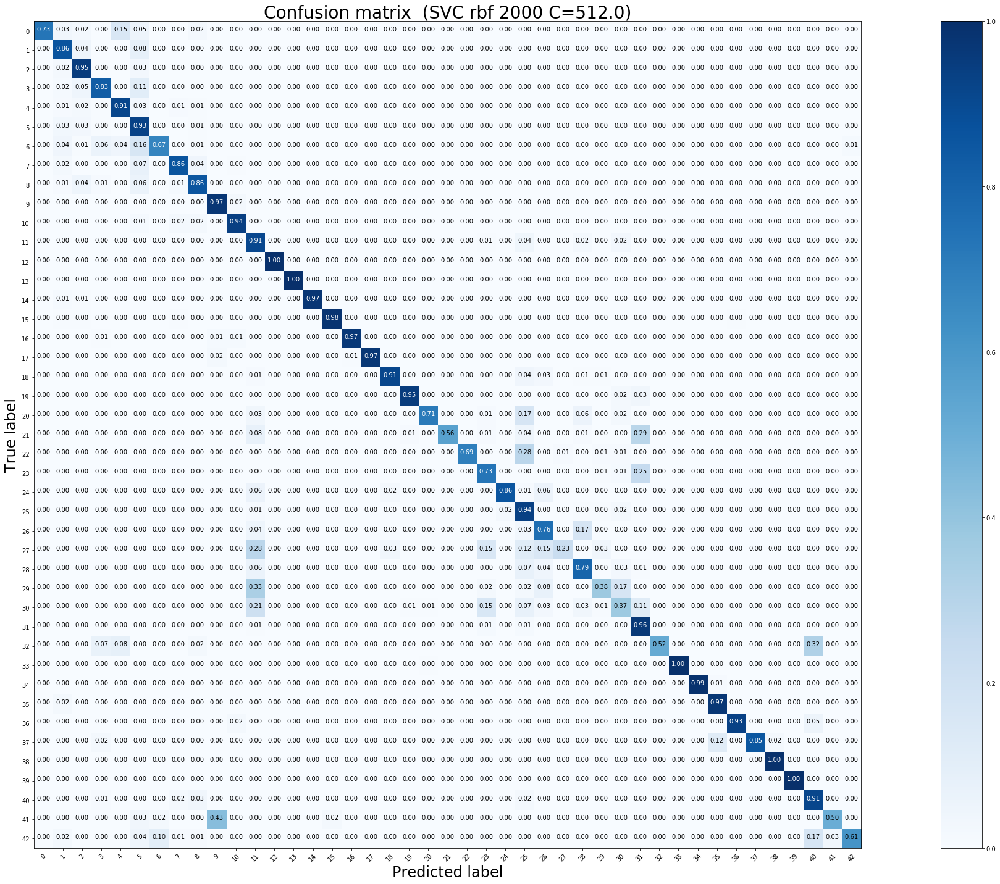

Test accuracy:  0.8992082343626286 

              precision    recall  f1-score   support

           0       1.00      0.73      0.85        60
           1       0.88      0.86      0.87       720
           2       0.87      0.95      0.91       750
           3       0.93      0.83      0.88       450
           4       0.96      0.91      0.94       660
           5       0.70      0.93      0.80       630
           6       0.91      0.67      0.77       150
           7       0.92      0.86      0.89       450
           8       0.88      0.86      0.87       450
           9       0.92      0.97      0.95       480
          10       0.97      0.94      0.95       660
          11       0.76      0.91      0.83       420
          12       1.00      1.00      1.00       690
          13       1.00      1.00      1.00       720
          14       0.99      0.97      0.98       270
          15       1.00      0.98      0.99       210
          16       0.98      0.97      0.97 

In [18]:
# Training SVC mit RBF-Kernel und optimierten Hyperparametern
# Trainingsmengen 500, 1000, 2000
train_RBF_SVC(X_tr_500, X_test_9_4_2, y_tr_500, y_test, 1, '500',215.2694823049509, 6.4155305118844185e-06, 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt_ski/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_1000, X_test_9_4_2, y_tr_1000, y_test, 1, '1000',430.5389646099018, 5.3947966093944364e-06, 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt_ski/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_2000, X_test_9_4_2, y_tr_2000, y_test, 1, '2000',512.0, 4.536465129862675e-06, 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt_ski/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")

In [ ]:
# 1. Durchlauf
# Ergebnisse wurden wurden zwar nicht im Output ausgegeben nach Neustart des Rechners
# Dennoch wurden sie auf der Festplatte gespeichert, sodass die Ergebnisse
# dennoch gesichert sind
print("*********************************************")
print("Trainingsmenge 5000")
clf_5000_RBF, time_5000_RBF = tuning_hyper_params(X_tr_5000, y_tr_5000, X_test_9_4_2, y_test, 'rbf', 10, 2, 0, 
                                                np.logspace(-16,10,14, base=2), np.logspace(-16,4,11, base=2),'l2', 'hinge', 1)
save_trained_model_as_pkl(clf_5000_RBF, "SVM_Modelle_GTSRB/Hog_opt_ski/rbf/Neue Mengen/5000/seed_1_random_A_with_scaler/GridSearch_1DL.pkl")
save_as_csv(time_5000_RBF, "SVM_Modelle_GTSRB/Hog_opt_ski/rbf/Neue Mengen/5000/seed_1_random_A_with_scaler/", 'Suchzeiten_GridSearch_1_DL.csv')

*********************************************
Trainingsmenge 5000


In [22]:
clf_5000_RBF_1_DL_results = load_trained_model_from_pkl("SVM_Modelle_GTSRB/Hog_opt_ski/rbf/Neue Mengen/5000/seed_1_random_A_with_scaler/GridSearch_1DL.pkl")
get_gridSearch_results(clf_5000_RBF_1_DL_results)

Besten Parameter:  {'svm__C': 64.0, 'svm__gamma': 6.103515625e-05}
Bester Score:  0.971636777003813
Precision-Score: 0.008778 (0.015977) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 1.52587890625e-05}
Precision-Score: 0.008857 (0.014825) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 6.103515625e-05}
Precision-Score: 0.007859 (0.010308) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 0.000244140625}
Precision-Score: 0.021633 (0.023641) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 0.0009765625}
Precision-Score: 0.002986 (0.006837) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 0.00390625}
Precision-Score: 0.003107 (0.006795) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 0.015625}
Precision-Score: 0.003487 (0.006690) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 0.0625}
Precision-Score: 0.001781 (0.001481) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 0.25}
Precision-Score: 0.005488 (0.0

In [ ]:
# 2. Durchlauf
print("*********************************************")
print("Trainingsmenge 5000")
clf_5000_RBF, time_5000_RBF = tuning_hyper_params(X_tr_5000, y_tr_5000, X_test_9_4_2, y_test, 'rbf', 10, 2, 0, 
                                                get_finer_range(64.0), get_finer_range(6.103515625e-05),'l2', 'hinge', 1)
save_trained_model_as_pkl(clf_5000_RBF, "SVM_Modelle_GTSRB/Hog_opt_ski/rbf/Neue Mengen/5000/seed_1_random_A_with_scaler/GridSearch_2DL.pkl")
save_as_csv(time_5000_RBF, "SVM_Modelle_GTSRB/Hog_opt_ski/rbf/Neue Mengen/5000/seed_1_random_A_with_scaler/", 'Suchzeiten_GridSearch_2_DL.csv')

*********************************************
Trainingsmenge 5000


In [21]:
# Falls Ergebnisse im Output nach GridSearchCV nicht gespeichert werden, können die Ergebnisse
# mit folgender Funktion separat von Festplatte abgefragt werden
def get_gridSearch_results(clf):
    print("Besten Parameter: ", clf.best_params_)
    print("Bester Score: ", clf.best_score_)
    for mean, stdev, param in zip(clf.cv_results_['mean_test_Precision'], clf.cv_results_['std_test_Precision'],
                                  clf.cv_results_['params']):
        print("Precision-Score: %f (%f) mit Parameter: %r" % (mean, stdev, param))
        
    for mean, stdev, param in zip(clf.cv_results_['mean_test_Recall'],clf.cv_results_['std_test_Recall'],clf.cv_results_['params']):
        print("Recall-Score: %f (%f) mit Parameter: %r" % (mean, stdev, param))
        
    for mean, stdev, param in zip(clf.cv_results_['mean_test_F1'], clf.cv_results_['std_test_F1'],clf.cv_results_['params']):
        print("F1-Score: %f (%f) mit Parameter: %r" % (mean, stdev, param))
        
    for mean, stdev, param in zip(clf.cv_results_['mean_test_acc'], clf.cv_results_['std_test_acc'],clf.cv_results_['params']):
        print("Accuracy-Score: %f (%f) mit Parameter: %r" % (mean, stdev, param))  
                
    for mean, stdev, param in zip(clf.cv_results_['mean_test_roc'],clf.cv_results_['std_test_roc'],clf.cv_results_['params']):
        print("Roc-Score: %f (%f) mit Parameter: %r" % (mean, stdev, param)) 

In [ ]:
# 1. Durchlauf
print("*********************************************")
print("Trainingsmenge 10000")
clf_10000_RBF, time_10000_RBF = tuning_hyper_params(X_tr_10000, y_tr_10000, X_test_9_4_2, y_test, 'rbf', 5, 2, 0, 
                                                np.logspace(-16,10,14, base=2), np.logspace(-16,4,11, base=2),'l2', 'hinge', 1)
save_trained_model_as_pkl(clf_10000_RBF, "SVM_Modelle_GTSRB/Hog_opt_ski/rbf/Neue Mengen/10000/seed_1_random_A_with_scaler/GridSearch_1DL.pkl")
save_as_csv(time_10000_RBF, "SVM_Modelle_GTSRB/Hog_opt_ski/rbf/Neue Mengen/10000/seed_1_random_A_with_scaler/", 'Suchzeiten_GridSearch_1_DL.csv')

print("*********************************************")
print("Trainingsmenge 20000")
clf_20000_RBF, time_20000_RBF = tuning_hyper_params(X_tr_20000, y_tr_20000, X_test_9_4_2, y_test, 'rbf', 3, 2, 0, 
                                                np.logspace(-16,10,14, base=2), np.logspace(-16,4,11, base=2),'l2', 'hinge', 1)
save_trained_model_as_pkl(clf_20000_RBF, "SVM_Modelle_GTSRB/Hog_opt_ski/rbf/Neue Mengen/20000/seed_1_random_A_with_scaler/GridSearch_1DL.pkl")
save_as_csv(time_20000_RBF, "SVM_Modelle_GTSRB/Hog_opt_ski/rbf/Neue Mengen/20000/seed_1_random_A_with_scaler/", 'Suchzeiten_GridSearch_1_DL.csv')

print("*********************************************")
print("Trainingsmenge 39209")
clf_39209_RBF, time_39209_RBF = tuning_hyper_params(X_tr, y_tr, X_test_9_4_2, y_test, 'rbf', 3, 2, 0, 
                                                np.logspace(-16,10,14, base=2), np.logspace(-16,4,11, base=2),'l2', 'hinge', 1)
save_trained_model_as_pkl(clf_39209_RBF, "SVM_Modelle_GTSRB/Hog_opt_ski/rbf/Neue Mengen/39209/seed_1_random_A_with_scaler/GridSearch_1DL.pkl")
save_as_csv(time_39209_RBF, "SVM_Modelle_GTSRB/Hog_opt_ski/rbf/Neue Mengen/39209/seed_1_random_A_with_scaler/", 'Suchzeiten_GridSearch_1_DL.csv')